# 1. Data preparation

In [1]:
import sklearn 
import pandas as pd  
import matplotlib.pyplot as plt
import requests
from datetime import datetime, timedelta
from dateutil.relativedelta import relativedelta
import os

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

Read dataframes from datas folder

In [13]:
# Dictionary to store all teh dataframes
dataframes_dictionary = {}
# Counter just for verification
csvcount = 0

# Path to access to the .csv files (It might need to be modified when working on local environment)
directory = './datas'

# Loop for reading all the dfs at once and storing them in a dictionary to easy handle it for common changes
    
for filename in os.listdir(directory):
    if filename.endswith(".csv"):  # Reads only the .csv files
        # Getting the file path
        filepath = os.path.join(directory, filename)
        df = pd.read_csv(filepath)
        
        # Use the file name without '.csv' as df name
        var_name = filename[:-4]
        # Storing each dataframe into a dictionary
        dataframes_dictionary[var_name] = df
        
        #globals()[var_name] = df
        csvcount += 1
print(f"Number of files imported {csvcount}\n")

Number of files imported 6



Change to datetime and also remove the timezone, keeping the local timezone, not the UTC one

In [14]:
#Change to datetime
for keys in dataframes_dictionary:
    dataframes_dictionary[keys]['datetime'] = pd.to_datetime(dataframes_dictionary[keys]['datetime'])

#Remove timezone info
for keys in dataframes_dictionary:
    dataframes_dictionary[keys]['datetime'] = dataframes_dictionary[keys]['datetime'].apply(lambda x: x.replace(tzinfo=None))

Check for duplicates, they generally appear on October, when summer time shifts to winter time.

In [15]:
for keys in dataframes_dictionary:
    duplicates = dataframes_dictionary[keys][dataframes_dictionary[keys].duplicated(subset='datetime',keep=False)] 
    print(duplicates)

                 datetime          datetime_utc  geo_id   geo_name   value
7153  2014-10-26 02:00:00  2014-10-26T00:00:00Z    8741  Península  15.000
7154  2014-10-26 02:00:00  2014-10-26T01:00:00Z    8741  Península  14.800
15889 2015-10-25 02:00:00  2015-10-25T00:00:00Z    8741  Península   7.100
15890 2015-10-25 02:00:00  2015-10-25T01:00:00Z    8741  Península   2.500
24793 2016-10-30 02:00:00  2016-10-30T00:00:00Z    8741  Península  60.400
24794 2016-10-30 02:00:00  2016-10-30T01:00:00Z    8741  Península   9.200
33529 2017-10-29 02:00:00  2017-10-29T00:00:00Z    8741  Península  59.100
33530 2017-10-29 02:00:00  2017-10-29T01:00:00Z    8741  Península  47.100
42265 2018-10-28 02:00:00  2018-10-28T00:00:00Z    8741  Península   0.900
42266 2018-10-28 02:00:00  2018-10-28T01:00:00Z    8741  Península   1.300
51001 2019-10-27 02:00:00  2019-10-27T00:00:00Z    8741  Península  11.500
51002 2019-10-27 02:00:00  2019-10-27T01:00:00Z    8741  Península   9.700
59737 2020-10-25 02:00:00

In [16]:
#Remove duplicates, keep last value
for keys in dataframes_dictionary:
    dataframes_dictionary[keys] = dataframes_dictionary[keys].drop_duplicates(subset='datetime',keep='last')

In [17]:
#Set datetime as index
for keys in dataframes_dictionary:
    dataframes_dictionary[keys] = dataframes_dictionary[keys].set_index('datetime')

In [18]:
# Give a commun date_range
date_range = pd.date_range(start=dataframes_dictionary["price_DA"].index.min(), end=dataframes_dictionary["price_DA"].index.max(), freq='H')
print(date_range)

for keys in dataframes_dictionary:
    dataframes_dictionary[keys] = dataframes_dictionary[keys].reindex(date_range)

DatetimeIndex(['2014-01-01 00:00:00', '2014-01-01 01:00:00',
               '2014-01-01 02:00:00', '2014-01-01 03:00:00',
               '2014-01-01 04:00:00', '2014-01-01 05:00:00',
               '2014-01-01 06:00:00', '2014-01-01 07:00:00',
               '2014-01-01 08:00:00', '2014-01-01 09:00:00',
               ...
               '2024-10-31 14:00:00', '2024-10-31 15:00:00',
               '2024-10-31 16:00:00', '2024-10-31 17:00:00',
               '2024-10-31 18:00:00', '2024-10-31 19:00:00',
               '2024-10-31 20:00:00', '2024-10-31 21:00:00',
               '2024-10-31 22:00:00', '2024-10-31 23:00:00'],
              dtype='datetime64[ns]', length=94968, freq='h')


Some graphs of daily hourly profiles just to see if the data makes sense...

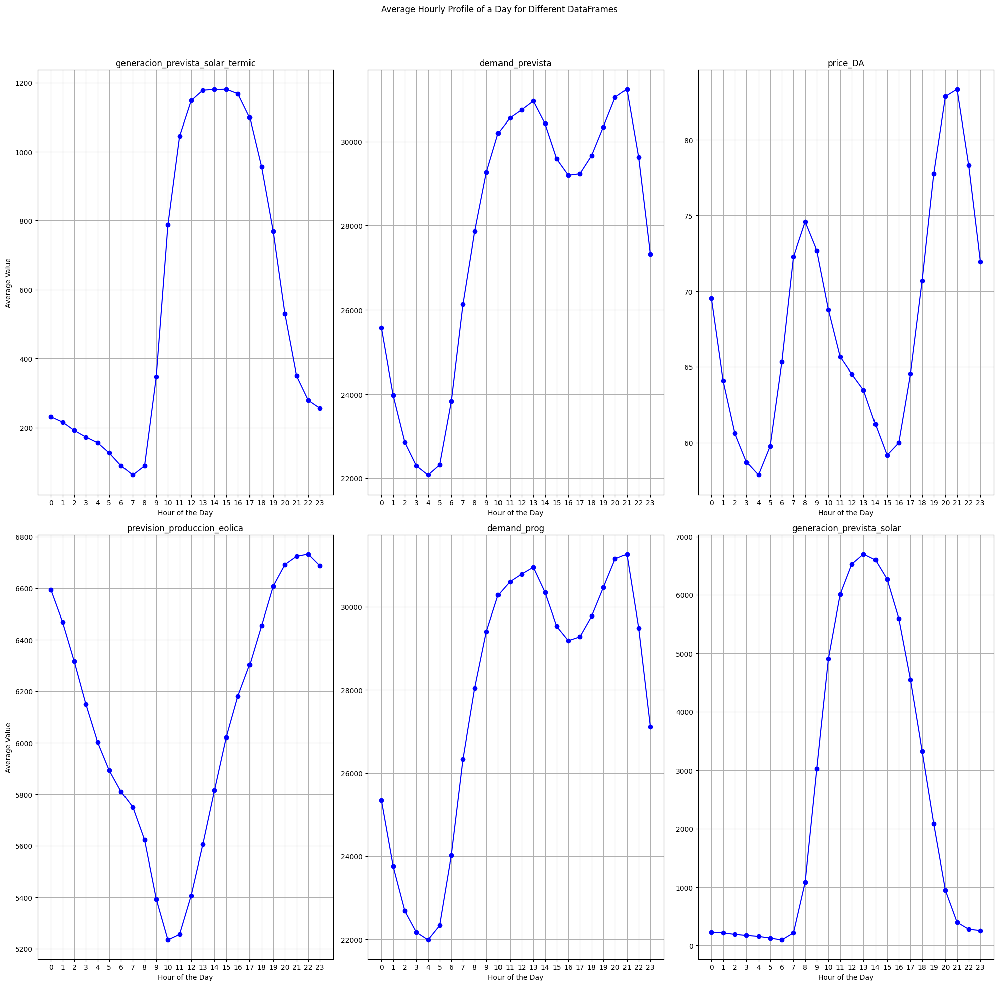

In [20]:
import matplotlib.pyplot as plt

# Set up a 3xlen(dataframes_dictionnary) subplot grid
fig, axs = plt.subplots(2, len(dataframes_dictionary)//3+1, figsize=(20, 20))
fig.suptitle("Average Hourly Profile of a Day for Different DataFrames")

# Loop over each DataFrame, calculate the average hourly profile, and plot
col = 0
row = 0
for keys in dataframes_dictionary:
    # Group by hour of the day and calculate the mean for each hour
    average_hourly_profile = dataframes_dictionary[keys].groupby(dataframes_dictionary[keys].index.hour)['value'].mean()
    
    # Plot on the corresponding subplot
    axs[row, col].plot(average_hourly_profile, marker='o', color='b')
    axs[row, col].set_title(keys)
    axs[row, col].set_xlabel("Hour of the Day")
    axs[row, col].set_xticks(range(0, 24))
    axs[row, col].grid(True)
    col += 1
    if col > 2:
        col = 0
        row += 1

# Set a common y-label for all subplots
for ax in axs[:, 0]:  # Pour chaque ligne de la première colonne
    ax.set_ylabel("Average Value")

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit title
plt.show()

In [21]:
# Rename the 'value' columns in each DataFrame to reflect their data source
for keys in dataframes_dictionary:
    dataframes_dictionary[keys] = dataframes_dictionary[keys].rename(columns={'value': f'{keys}'})

# Concatenate the DataFrames, aligning on the index of prices_DA_full
dataframes_to_concat = [dataframes_dictionary['price_DA']['price_DA']]  # Start with the prices DataFrame

# Add the renamed DataFrames from the dataframes_dictionnary to the list
for keys in dataframes_dictionary:
    if keys != 'price_DA':
        dataframes_to_concat.extend([dataframes_dictionary[keys][keys]])

full_data = pd.concat(dataframes_to_concat, axis=1)

# Display the concatenated DataFrame
full_data

,price_DA,generacion_prevista_solar_termic,demand_prevista,prevision_produccion_eolica,demand_prog,generacion_prevista_solar
2014-01-01 00:00:00,20.02,3.50,23878.333333,10790.00,24099.0,3.50
2014-01-01 01:00:00,10.34,0.00,23322.000000,10885.00,22269.0,0.00
2014-01-01 02:00:00,5.35,0.00,21711.166667,10984.00,21136.0,0.00
2014-01-01 03:00:00,5.00,0.50,20230.333333,10680.00,19911.0,0.50
2014-01-01 04:00:00,0.50,2.20,19215.333333,10605.00,19060.0,2.20
...,...,...,...,...,...,...
2024-10-31 19:00:00,135.01,82.55,30143.666667,3972.75,29705.5,82.55
2024-10-31 20:00:00,148.72,94.40,29875.750000,4615.25,29545.5,94.40
2024-10-31 21:00:00,134.34,97.75,29014.000000,4913.00,28285.5,97.75
2024-10-31 22:00:00,115.20,64.15,26512.166667,4820.25,25917.0,64.15


Some column renaming

In [22]:
full_data.rename(columns = {'demand_prevista':'demand_fore',
                            'demand_prog':'demand_scheduled',
                            'generacion_prevista_solar':'solar_gen_fore',
                            'generacion_prevista_solar_termic':'solar_thermal_fore',
                            'prevision_produccion_eolica':'wind_gen_fore'}, inplace = True)
full_data


,price_DA,solar_thermal_fore,demand_fore,wind_gen_fore,demand_scheduled,solar_gen_fore
2014-01-01 00:00:00,20.02,3.50,23878.333333,10790.00,24099.0,3.50
2014-01-01 01:00:00,10.34,0.00,23322.000000,10885.00,22269.0,0.00
2014-01-01 02:00:00,5.35,0.00,21711.166667,10984.00,21136.0,0.00
2014-01-01 03:00:00,5.00,0.50,20230.333333,10680.00,19911.0,0.50
2014-01-01 04:00:00,0.50,2.20,19215.333333,10605.00,19060.0,2.20
...,...,...,...,...,...,...
2024-10-31 19:00:00,135.01,82.55,30143.666667,3972.75,29705.5,82.55
2024-10-31 20:00:00,148.72,94.40,29875.750000,4615.25,29545.5,94.40
2024-10-31 21:00:00,134.34,97.75,29014.000000,4913.00,28285.5,97.75
2024-10-31 22:00:00,115.20,64.15,26512.166667,4820.25,25917.0,64.15


Check NaNs and drop them, sometimes Nans also occur when shifting from winter time to summer time.

In [23]:
#Check NaNs
full_data.isna().sum()

price_DA              11
solar_thermal_fore    32
demand_fore           11
wind_gen_fore         31
demand_scheduled      11
solar_gen_fore        32
dtype: int64

Number of NaNs is not relevant, we'll drop them. 

In [24]:
#Drop them
full_data.dropna(inplace=True,subset=['solar_gen_fore',
                                      'wind_gen_fore',
                                      'solar_thermal_fore',
                                      'demand_fore',
                                      'demand_scheduled'])
full_data.isna().sum()

price_DA              0
solar_thermal_fore    0
demand_fore           0
wind_gen_fore         0
demand_scheduled      0
solar_gen_fore        0
dtype: int64

# END OF DATA PREPARATION
___

# 2. Data Exploration

In [25]:
# Stats
total_stats = full_data.agg(['mean', 'var'])
# Group by year and calculate mean, median, and variance for each numeric column
yearly_stats = full_data.groupby(full_data.index.year).agg(['mean', 'var'])
# Group by month and calculate statistics
monthly_stats = full_data.groupby(full_data.index.month).agg(['mean', 'var'])

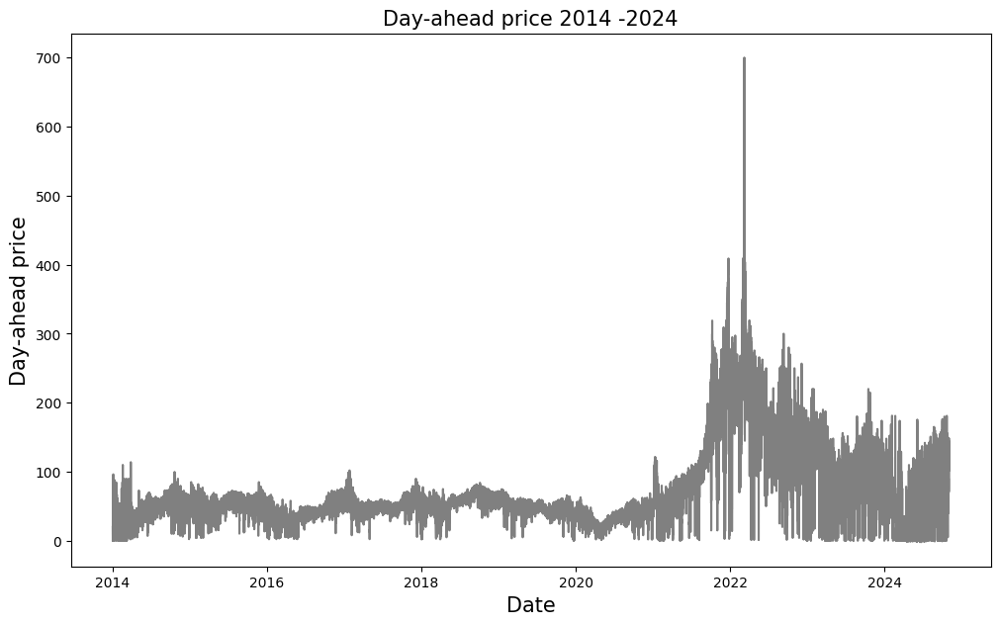

In [26]:
# Plotting the Day Ahead Price to identify trends.
plt.figure(figsize=(12,7))
plt.plot(full_data['price_DA'], color='grey')
plt.xlabel('Date', fontsize=15)
plt.ylabel('Day-ahead price', fontsize=15)
plt.title('Day-ahead price 2014 -2024', fontsize=15)
plt.show()

/var/folders/h1/pxtpg4h944j672ncc_wl9qp80000gn/T/ipykernel_18862/22772836.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


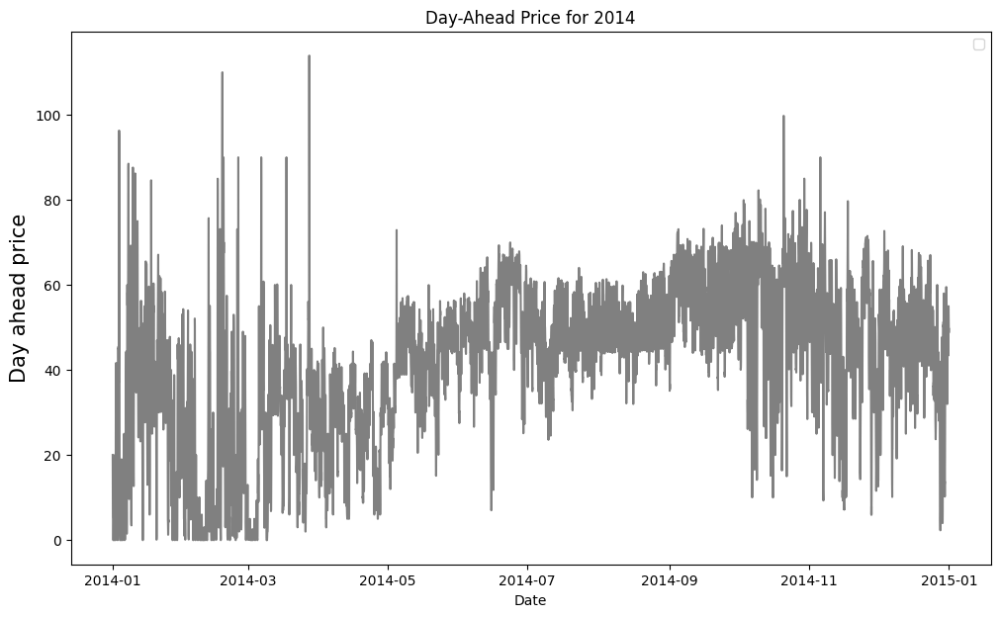

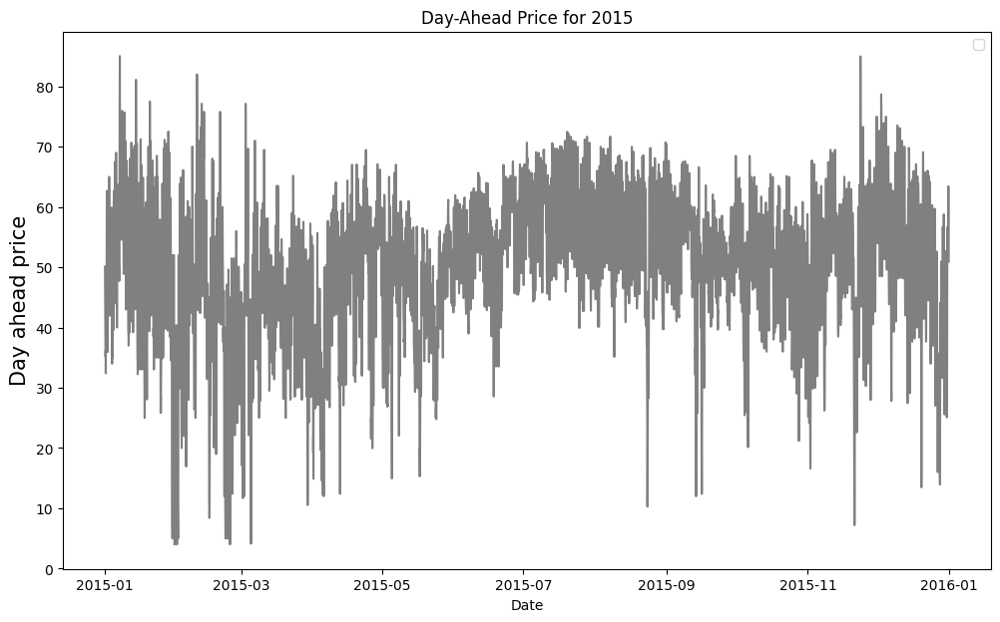

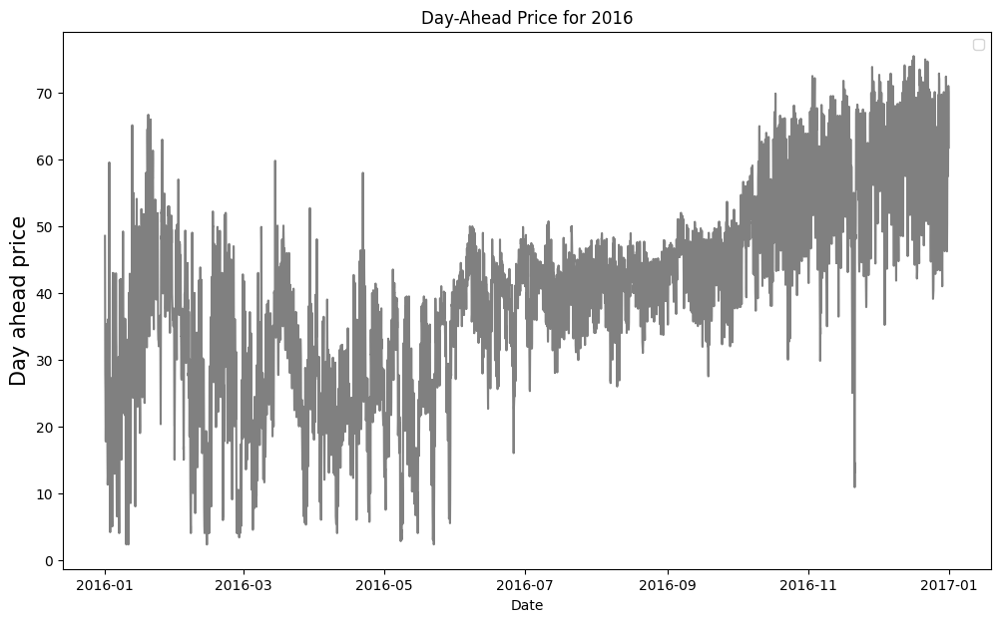

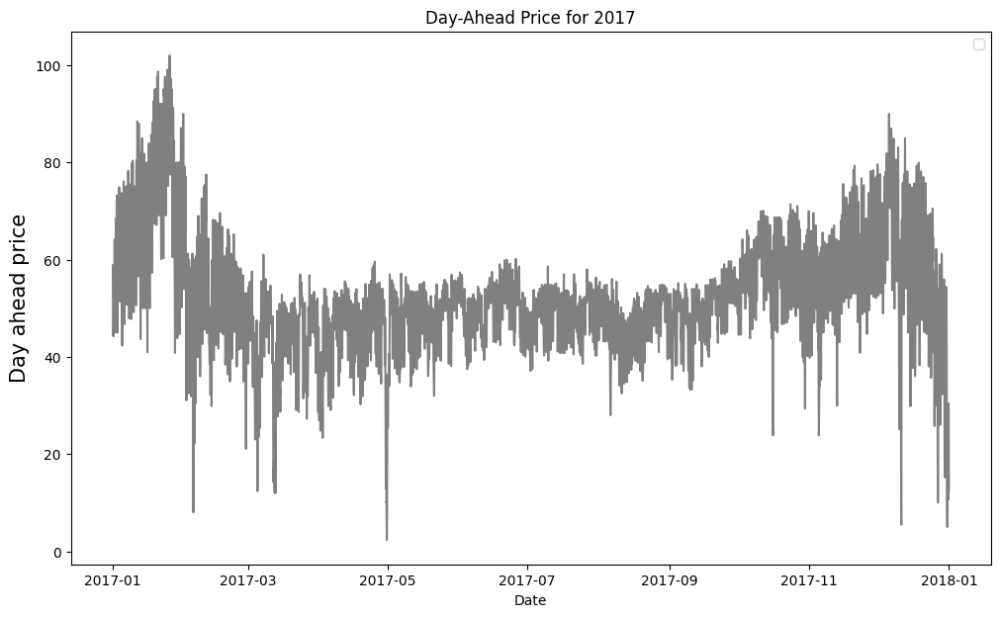

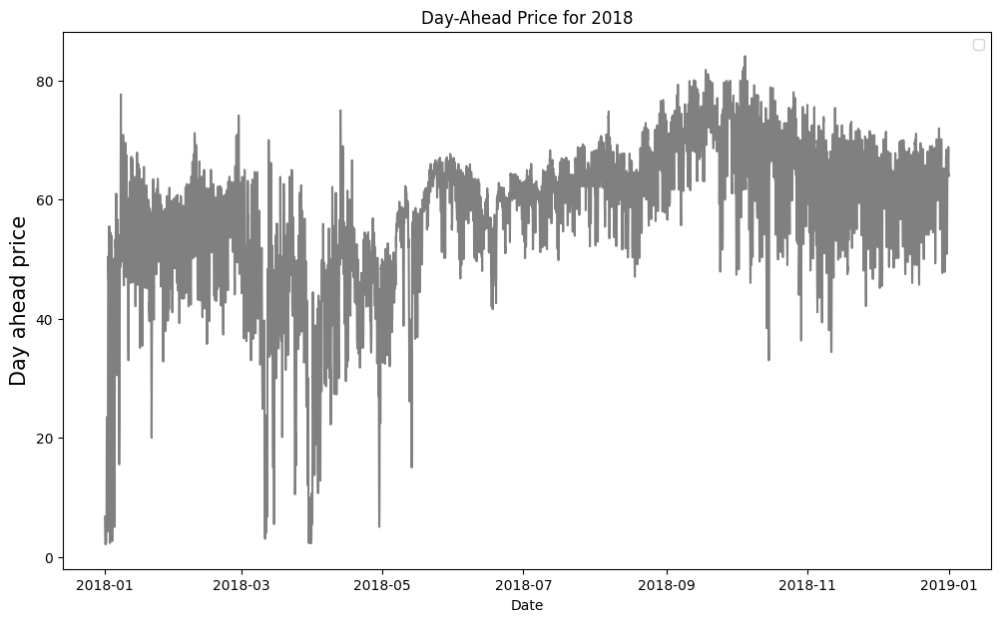

...

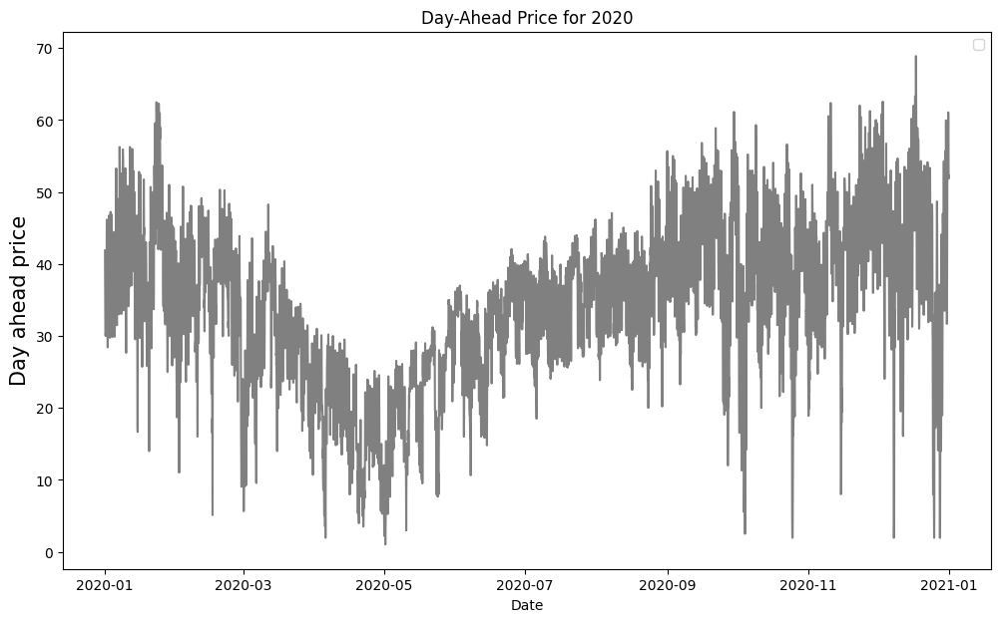

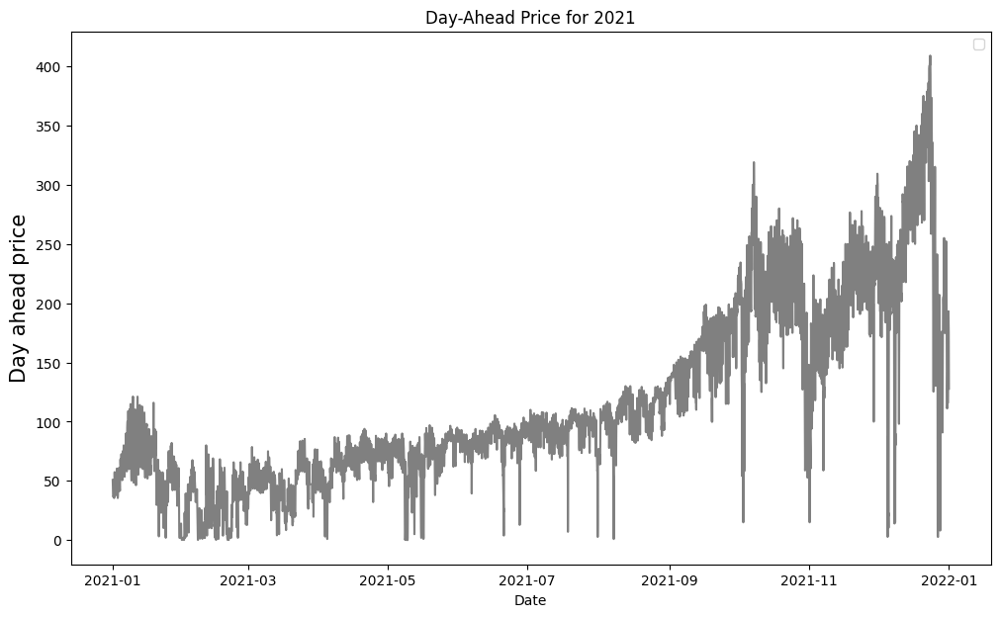

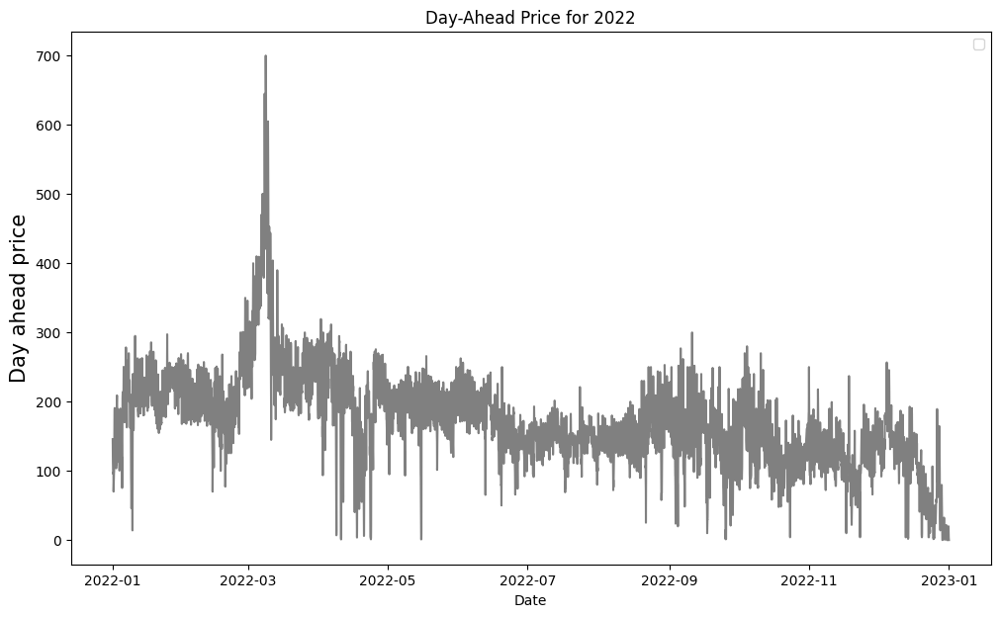

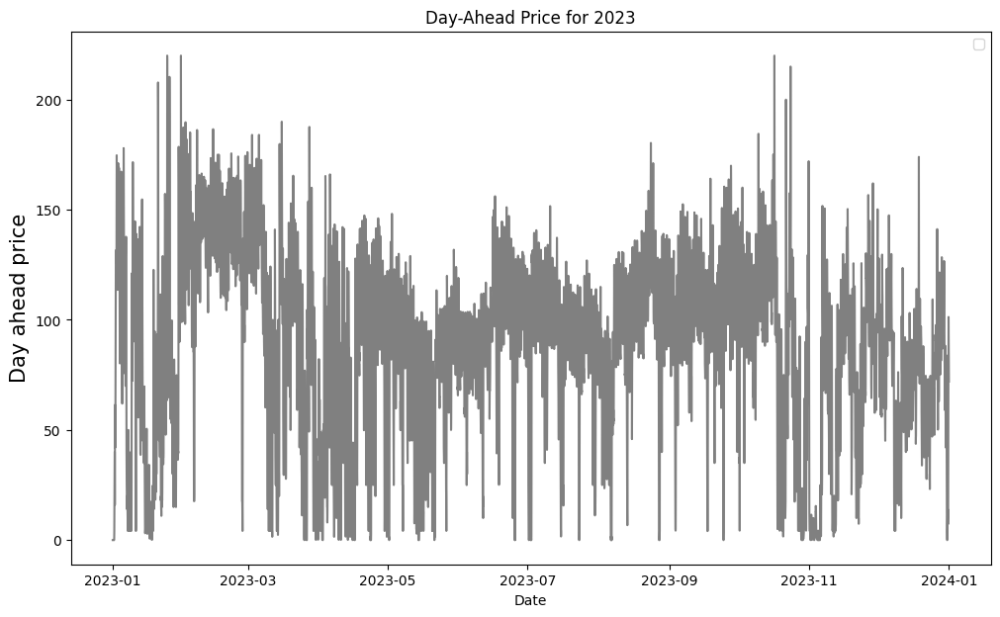

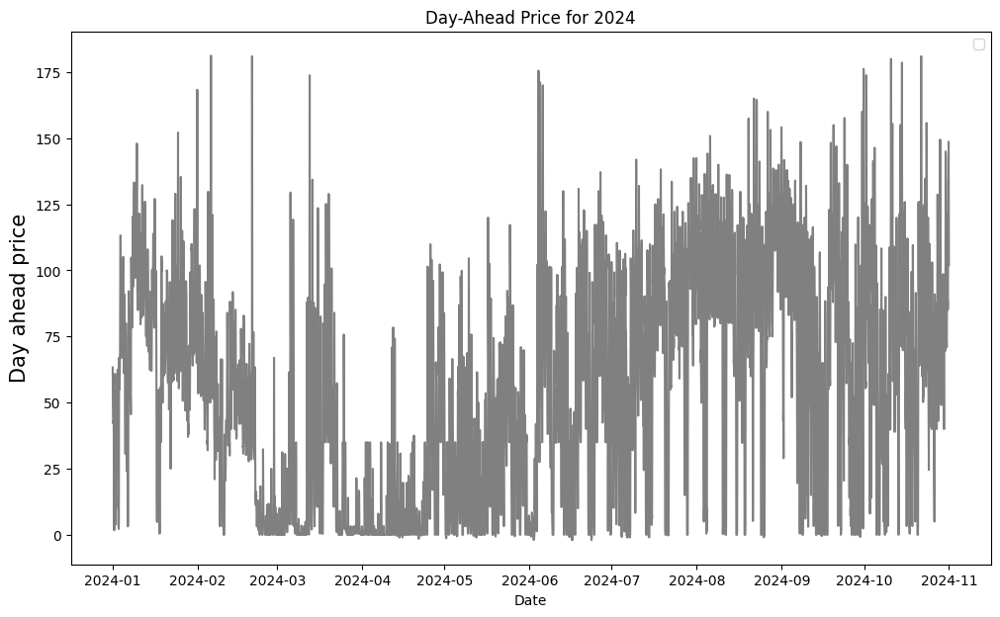

In [27]:
# Day ahead price per year.
for year, data in full_data.groupby(full_data.index.year):
    
    plt.figure(figsize=(12, 7))
    plt.plot(data['price_DA'], color = 'grey')
    plt.title(f'Day-Ahead Price for {year}')
    plt.xlabel('Date')
    plt.ylabel('Day ahead price', fontsize=15)
    plt.legend()
    plt.show()

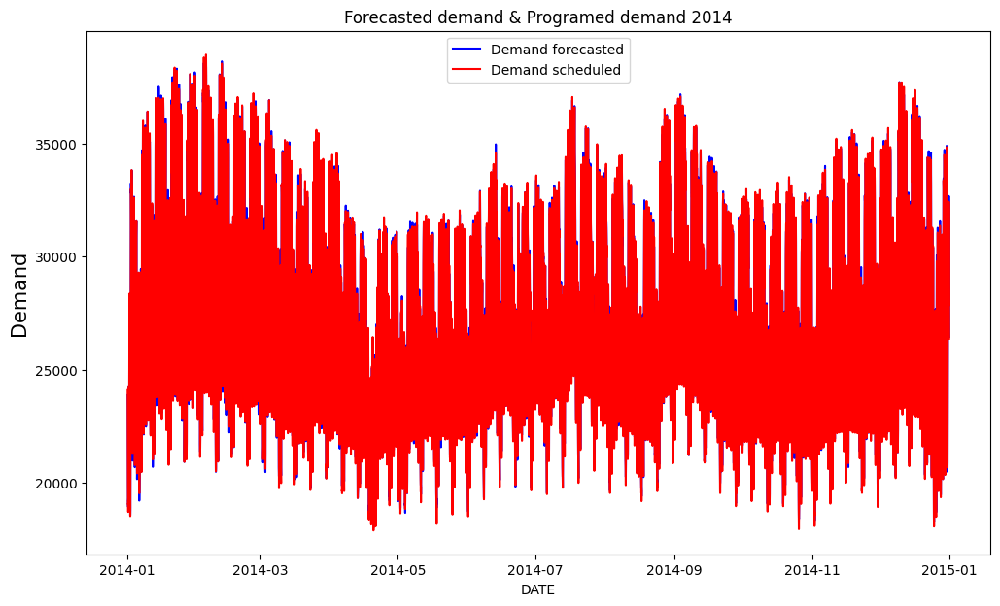

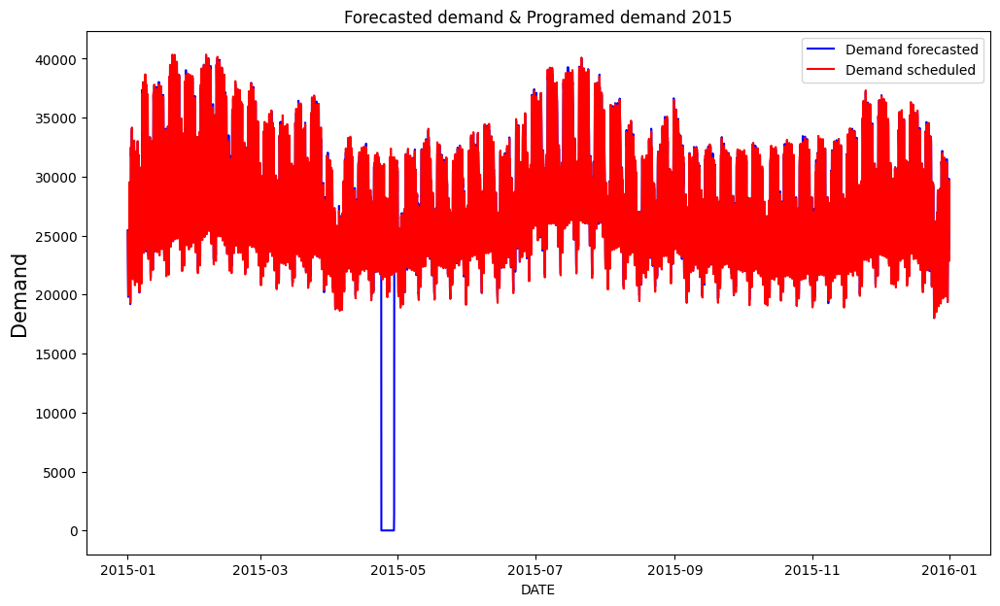

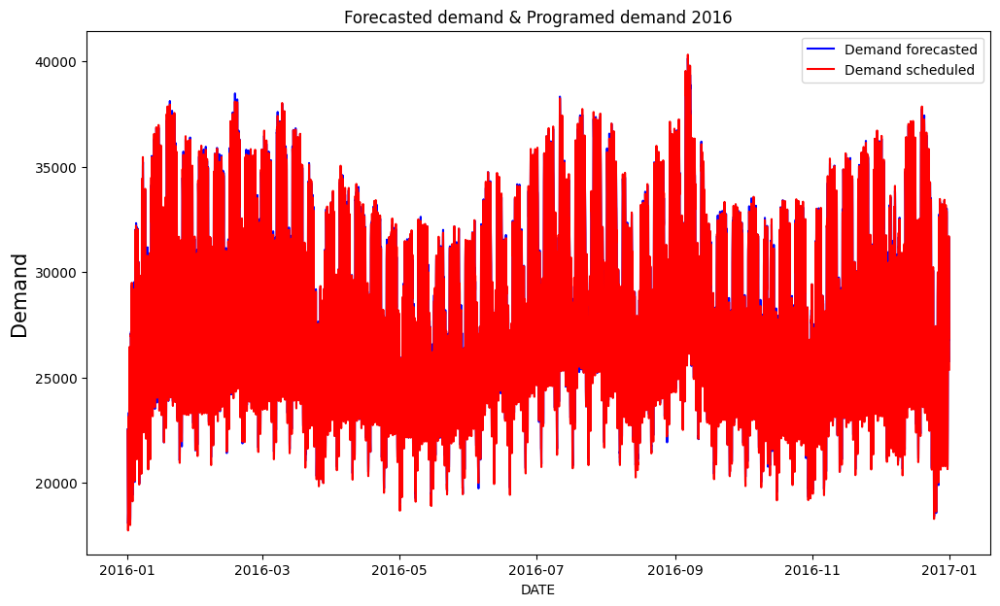

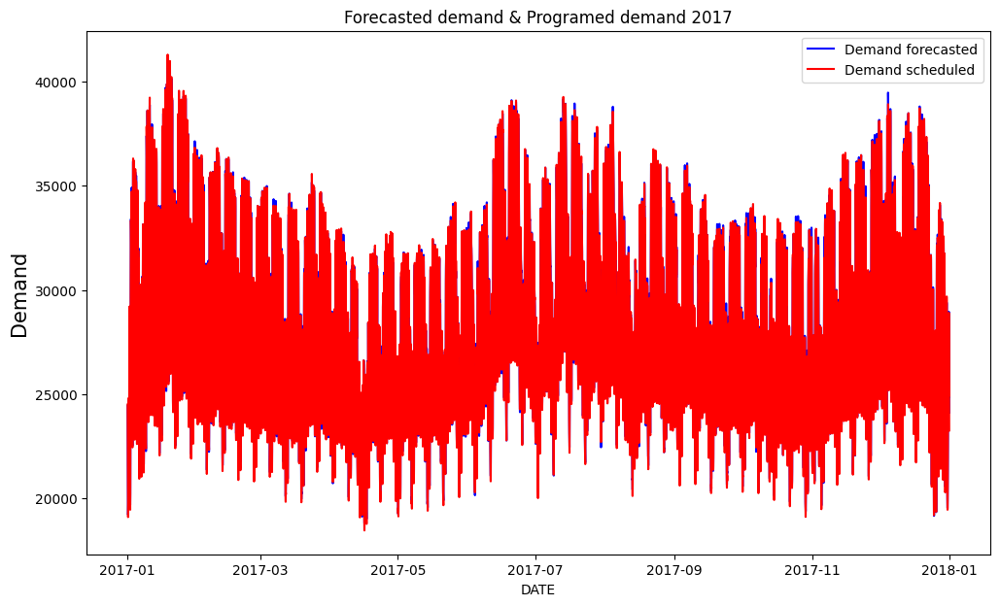

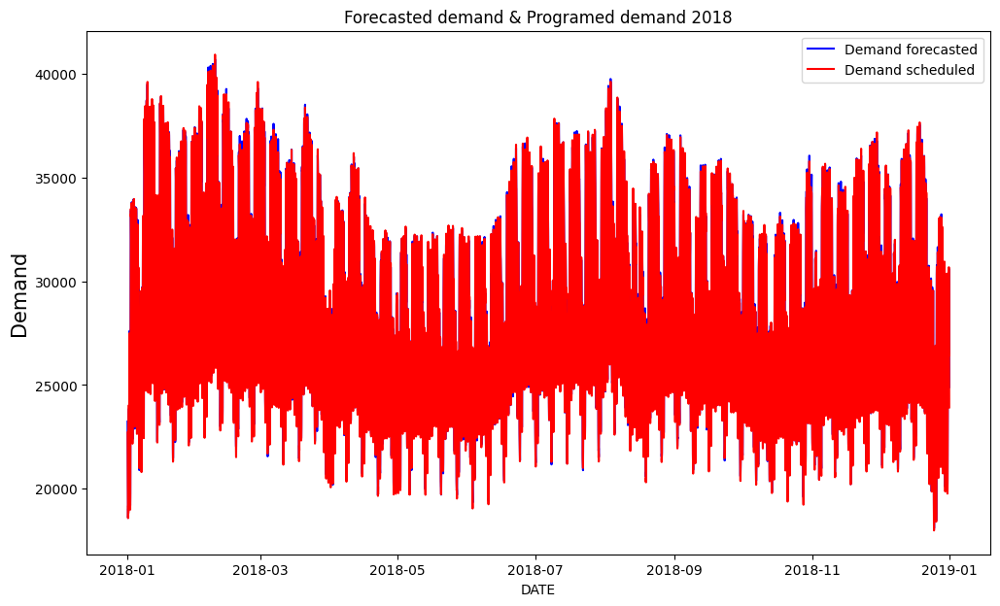

...

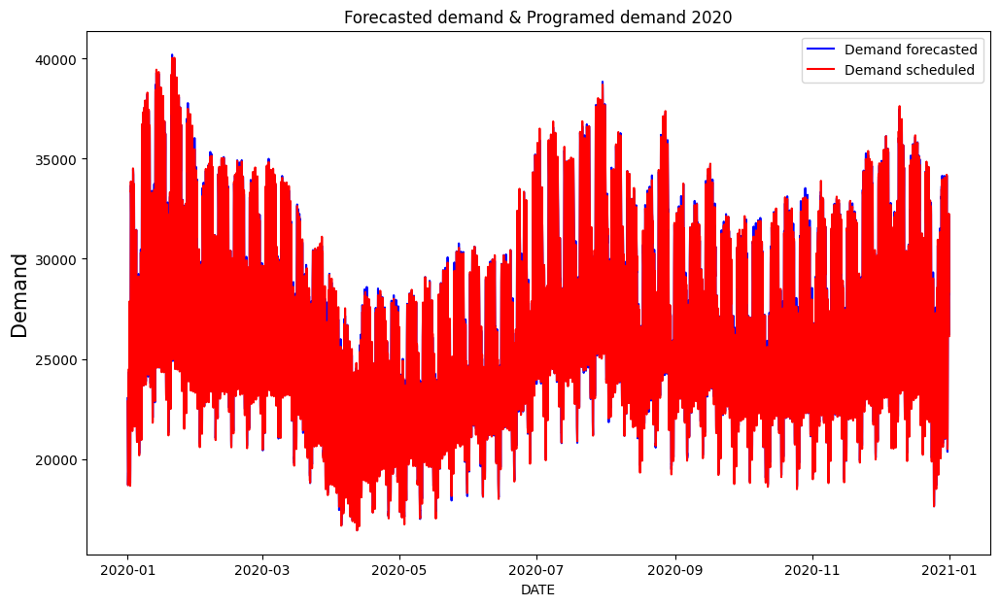

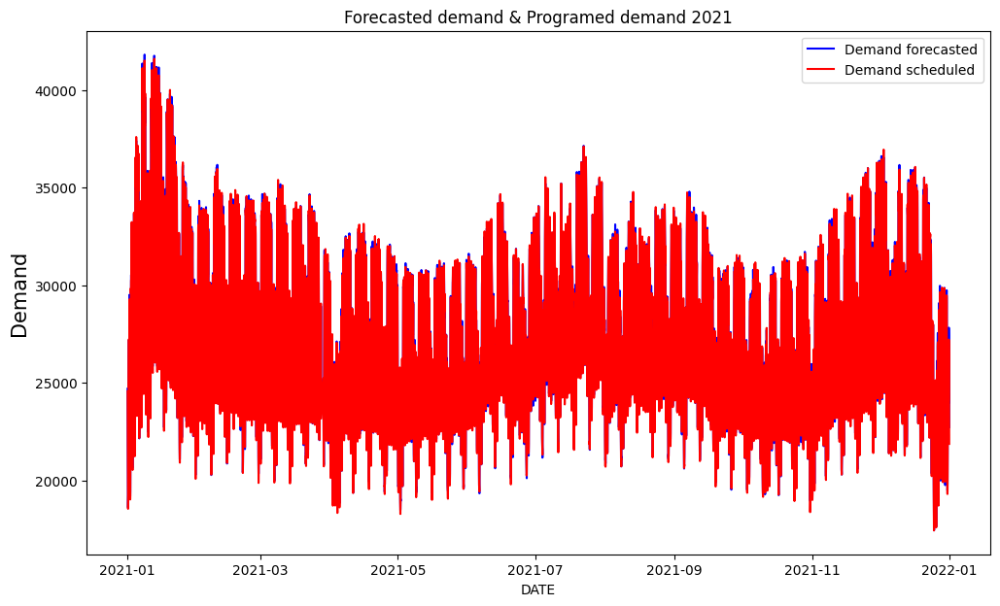

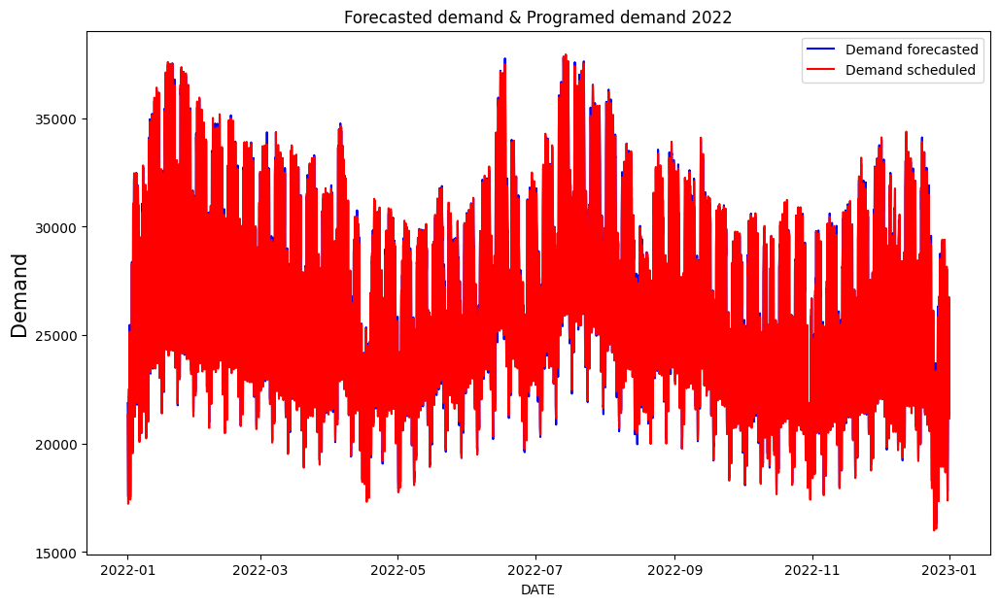

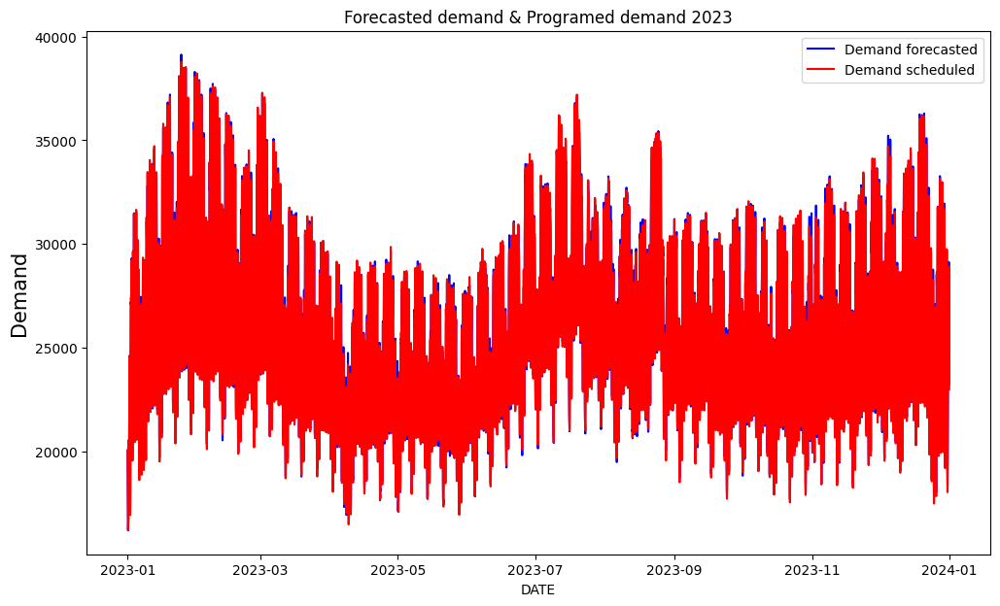

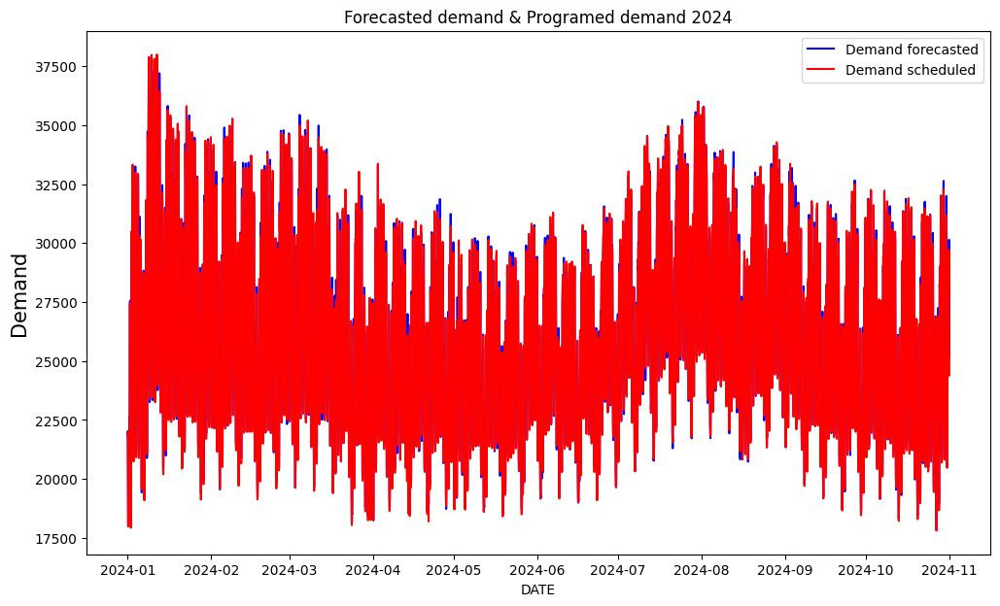

In [30]:
# Forecasted demand & Programed demand per year
for year, data in full_data.groupby(full_data.index.year):
    
    plt.figure(figsize=(12, 7))
    plt.plot(data['demand_fore'], color = 'blue', label = 'Demand forecasted')
    plt.plot(data['demand_scheduled'], color = 'red', label = 'Demand scheduled')
    plt.title(f'Forecasted demand & Programed demand {year}')
    plt.xlabel('DATE')
    plt.ylabel('Demand', fontsize=15)
    plt.legend()
    plt.show()

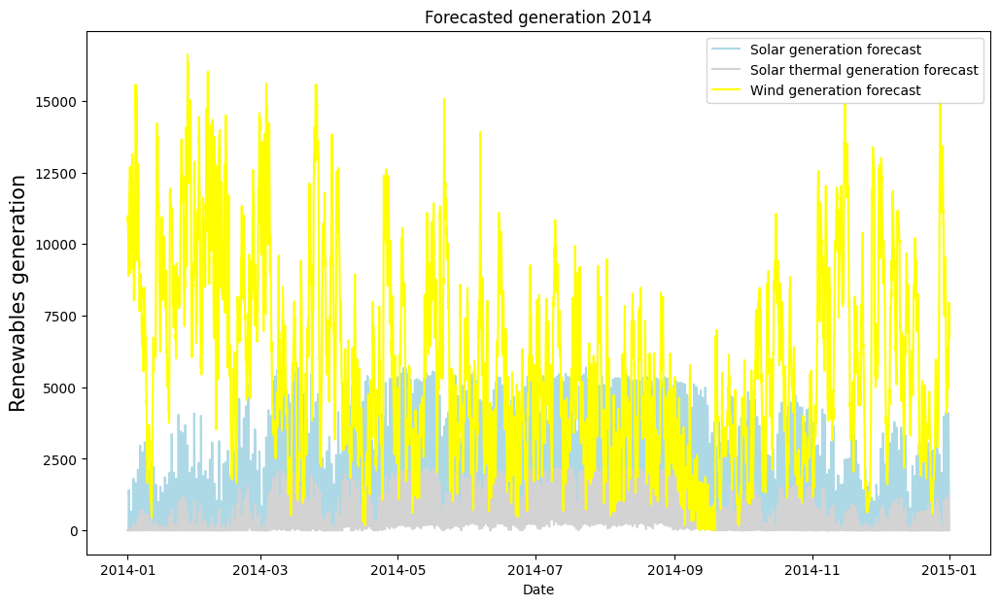

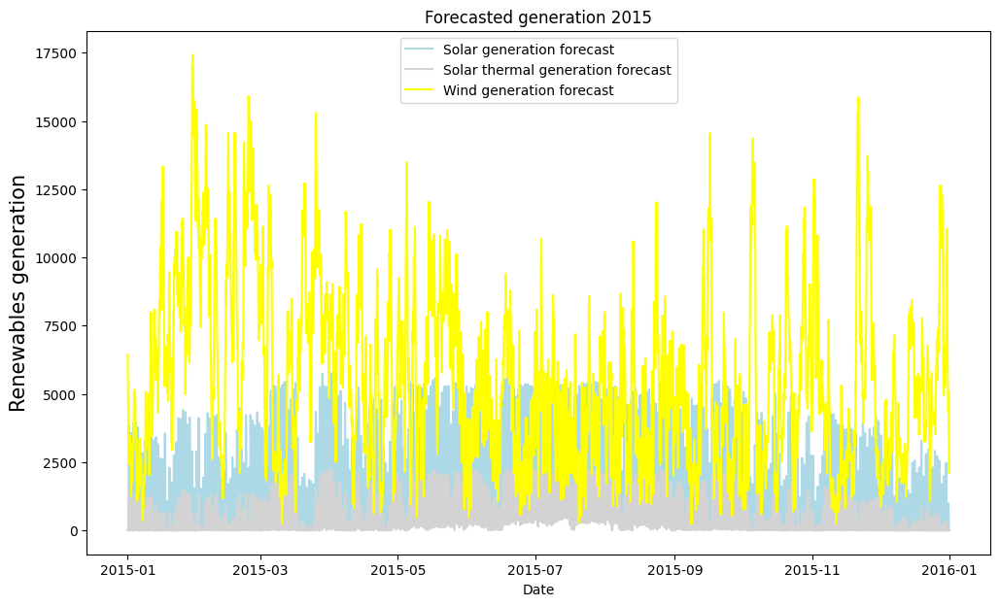

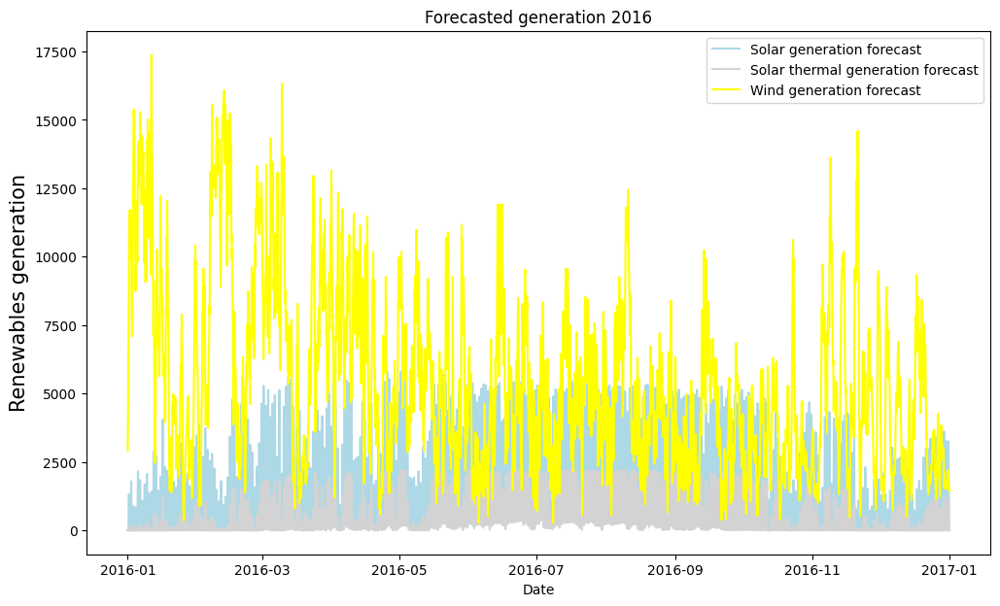

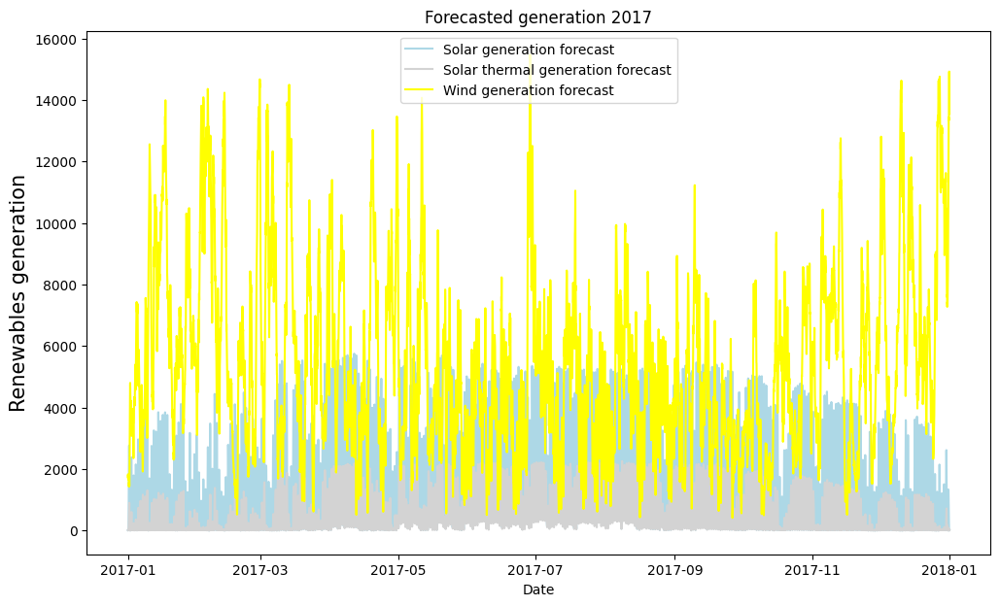

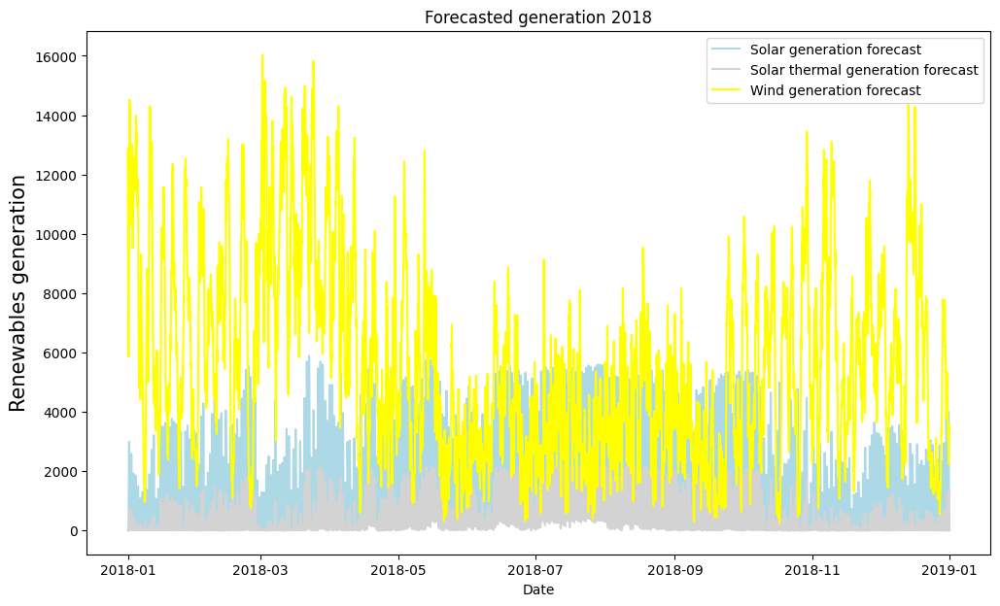

...

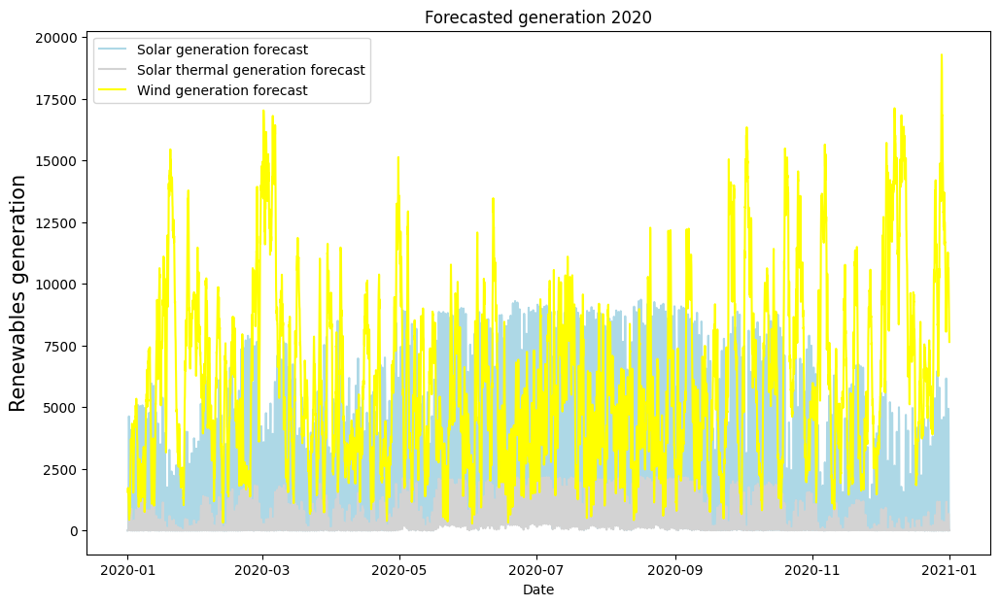

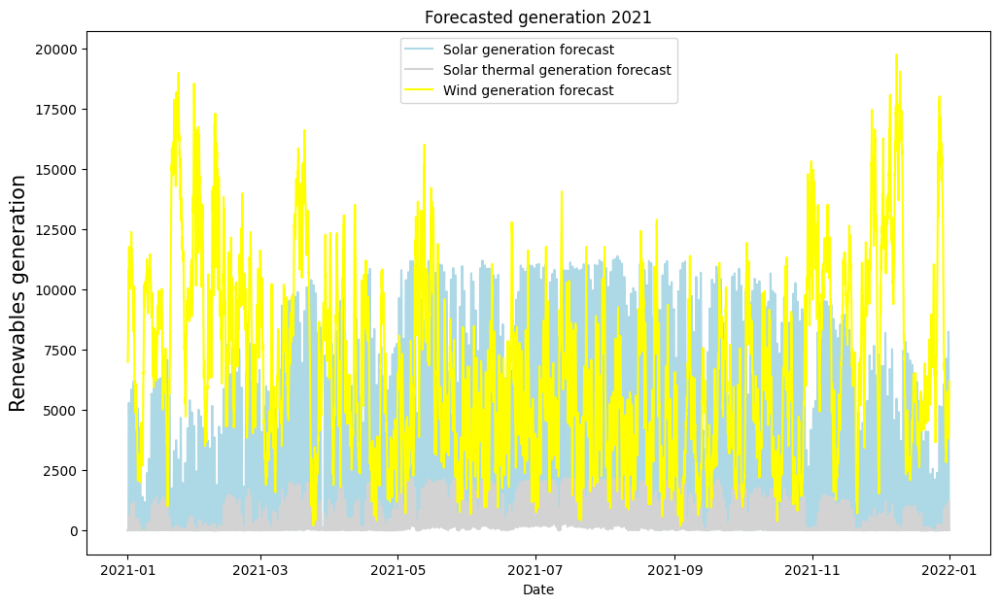

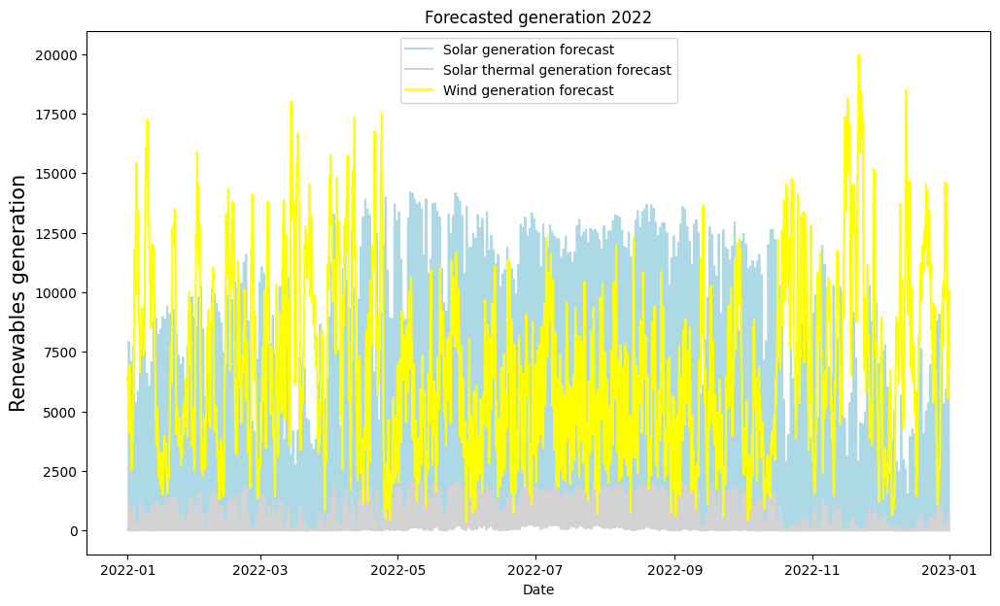

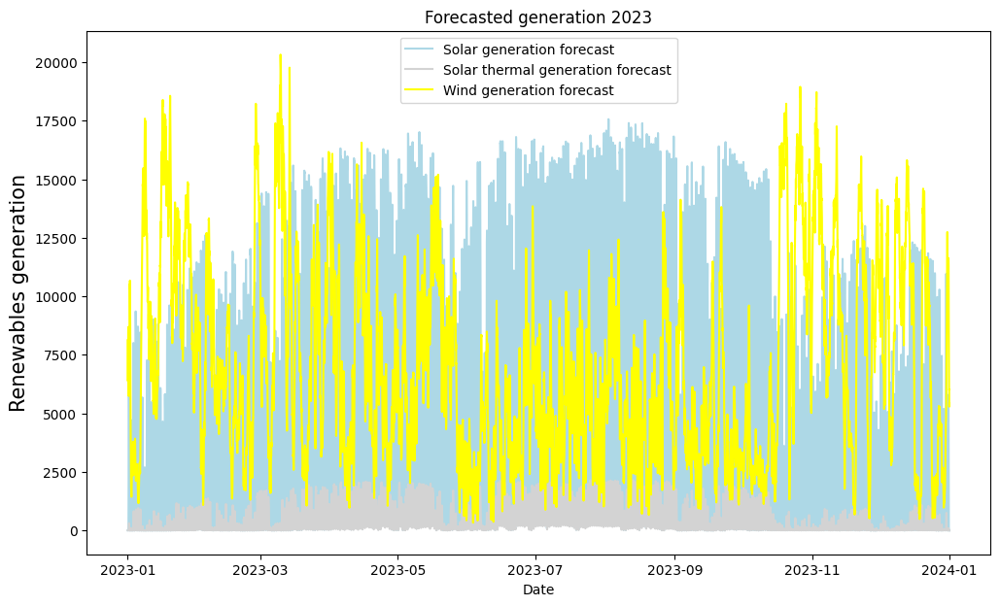

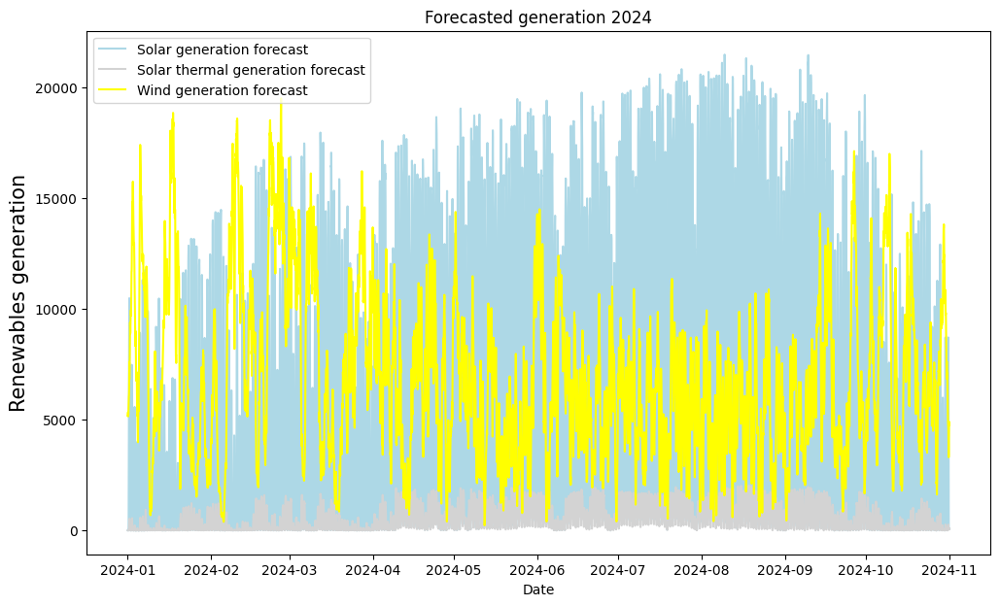

In [31]:
# Forecasted generation (Solar, solar thermal & wind)
for year, data in full_data.groupby(full_data.index.year):
    
    plt.figure(figsize=(12, 7))
    plt.plot(data['solar_gen_fore'], color = 'lightblue', label = 'Solar generation forecast')
    plt.plot(data['solar_thermal_fore'], color = 'lightgray', label = 'Solar thermal generation forecast')
    plt.plot(data['wind_gen_fore'], color = 'yellow', label = 'Wind generation forecast')
    plt.title(f'Forecasted generation {year}')
    plt.xlabel('Date')
    plt.ylabel('Renewables generation', fontsize=15)
    plt.legend()
    plt.show()

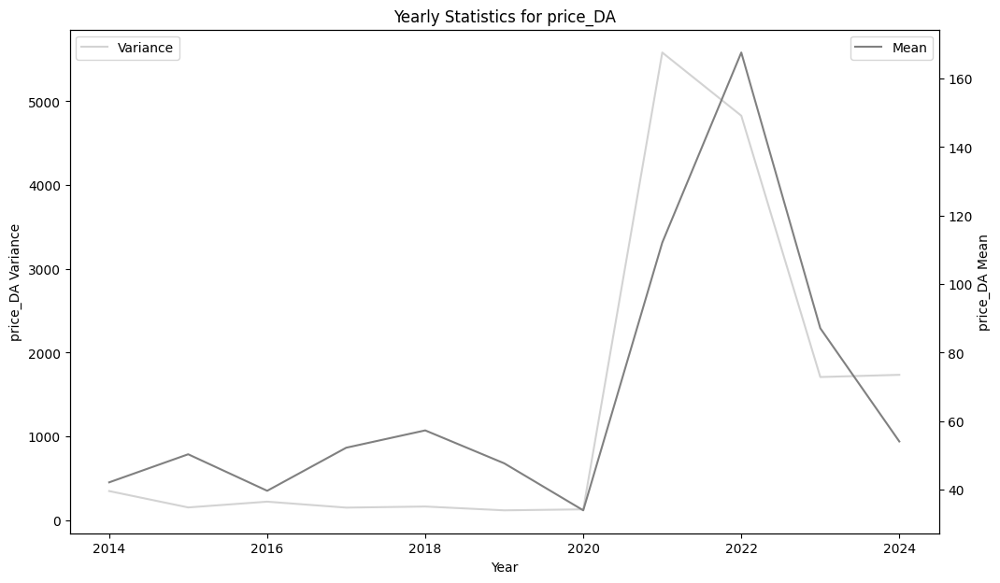

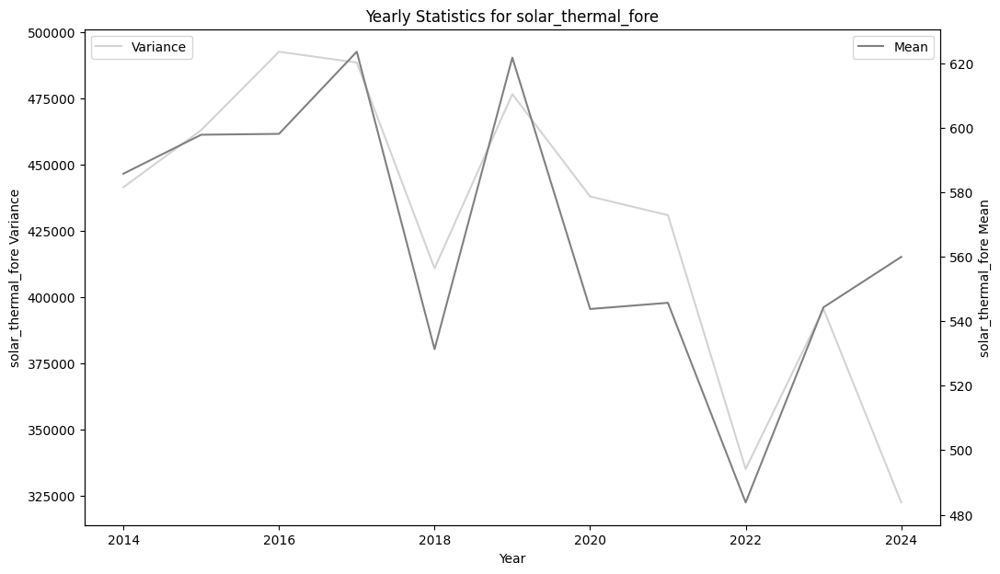

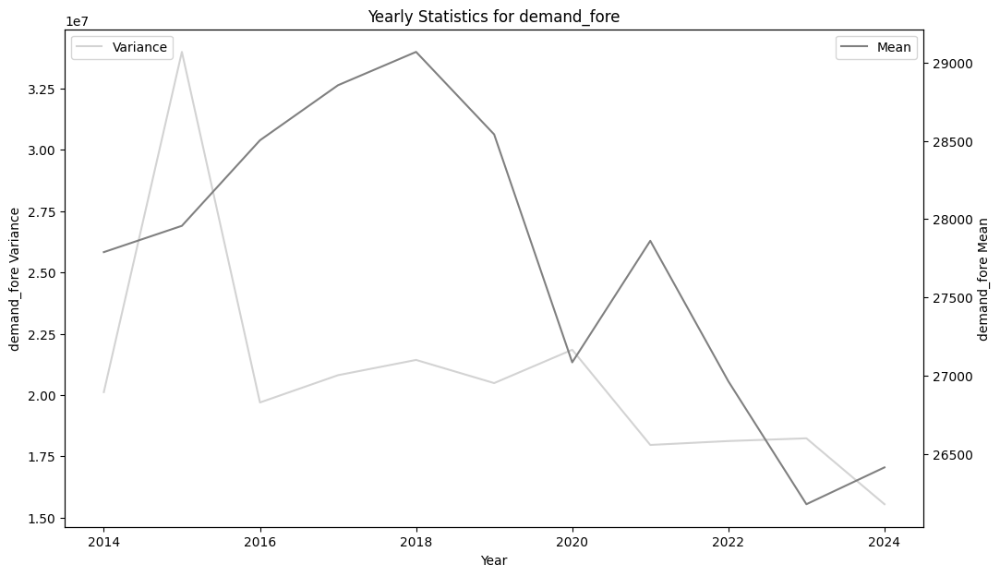

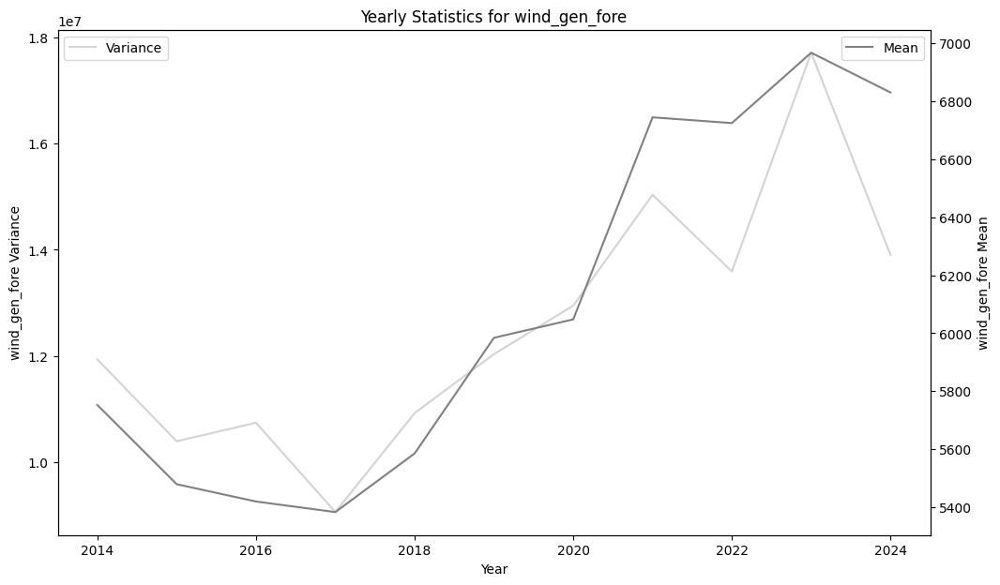

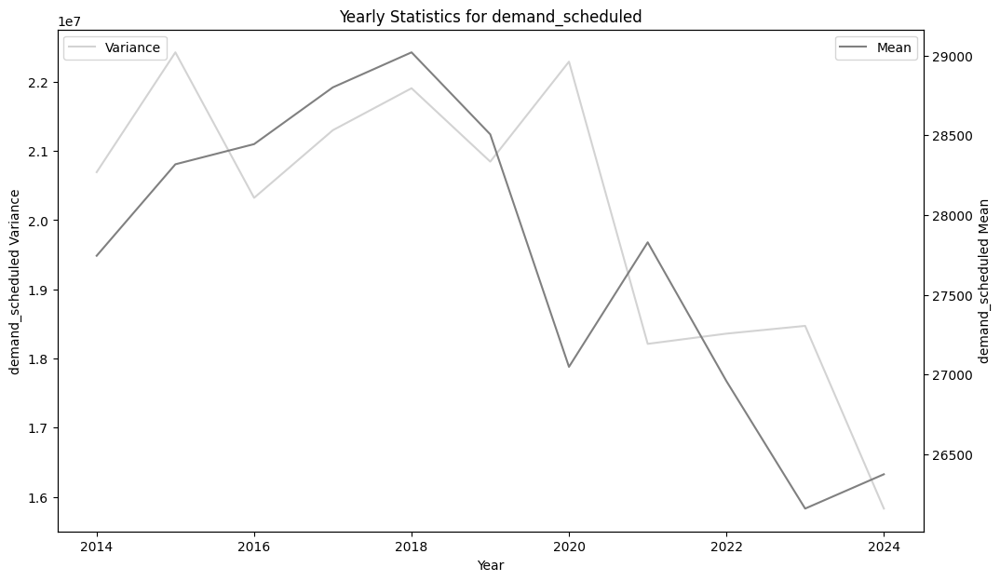

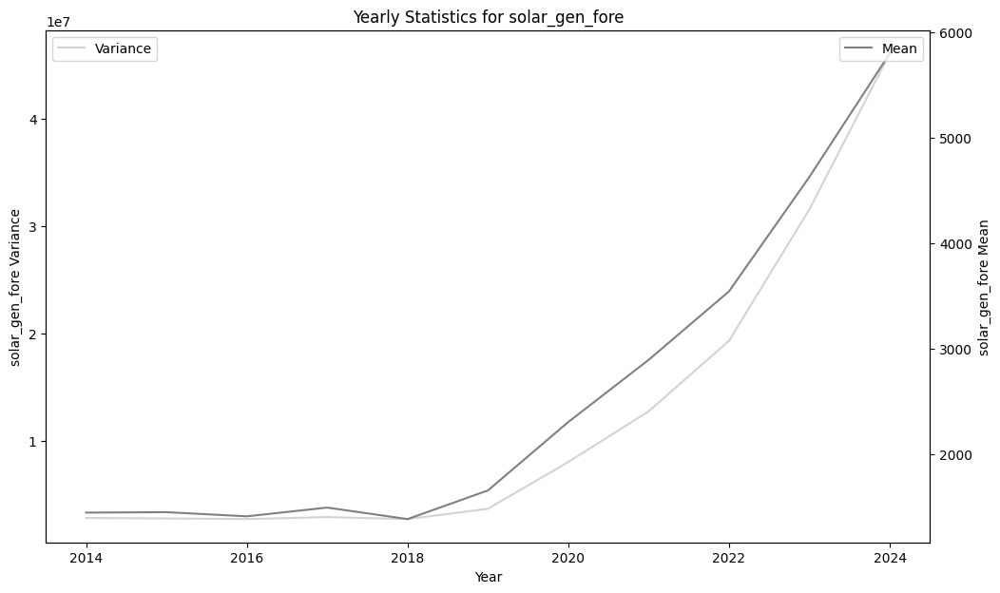

In [32]:
# Plotting the stats for each variable to see their behaviour
for variable in yearly_stats.columns.levels[0]:  # Top-level columns
    fig, ax1 = plt.subplots(figsize=(12, 7))
    
    # Plot variance on the left y-axis
    ax1.plot(yearly_stats.index, yearly_stats[variable]['var'], label='Variance', color='lightgrey')
    ax1.set_xlabel('Year')
    ax1.set_ylabel(f'{variable} Variance')
    ax1.legend(loc='upper left')
    # Second y-axis for the mean
    ax2 = ax1.twinx()
    ax2.plot(yearly_stats.index, yearly_stats[variable]['mean'], label='Mean', color='grey')
    ax2.set_ylabel(f'{variable} Mean')
    ax2.legend(loc='upper right')
    plt.title(f'Yearly Statistics for {variable}')
    plt.show()

Density plots 
* Let's compare the distributions for each month, year and hour and compare them with the overall dataset
* In order to do so, we'll create new input features: **month**, **year** and **hour**


In [34]:
full_data['year'] = full_data.index.year
full_data['month'] = full_data.index.month
full_data['hour'] = full_data.index.hour

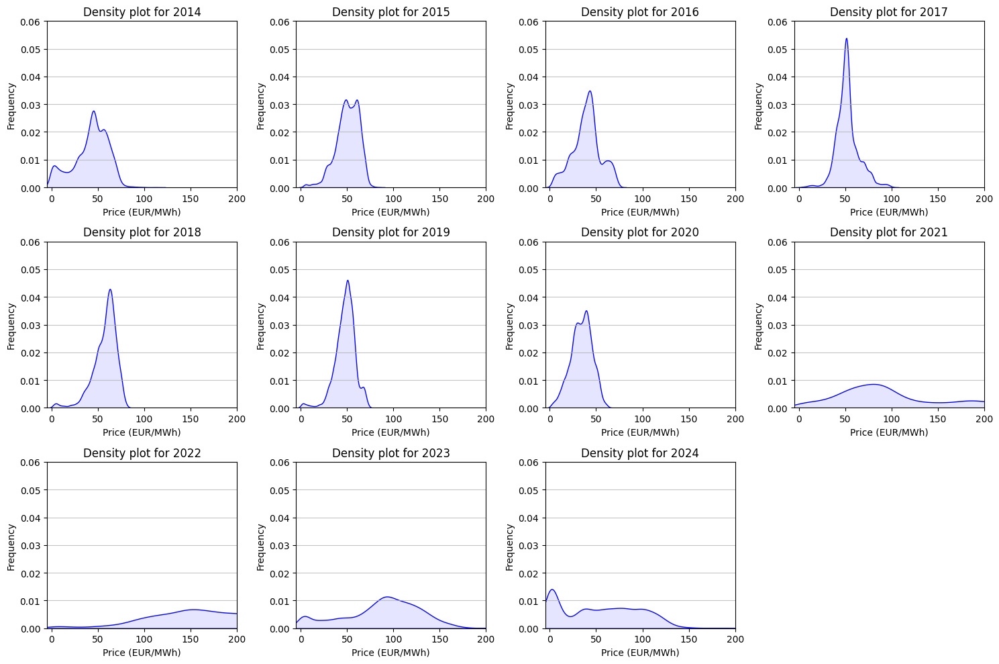

In [37]:
#For each year
plt.figure(figsize=(15, 10))

years = range(2014, 2025)  # Including 2024

for year in years:
    plt.subplot(3, 4, year - 2013)  # Create a 3x4 grid of subplots
    sns.kdeplot(data=full_data[full_data['year'] == year]['price_DA'], color='blue', label='Weekday', fill=True, alpha=0.1)
    plt.title(f'Density plot for {year}')
    plt.xlabel('Price (EUR/MWh)')
    plt.ylabel('Frequency')
    plt.ylim([0, 0.06])
    plt.xlim([-5, 200])  # Adjust the x-axis limit for better visibility
    plt.grid(axis='y', alpha=0.75)

plt.tight_layout()
plt.show()

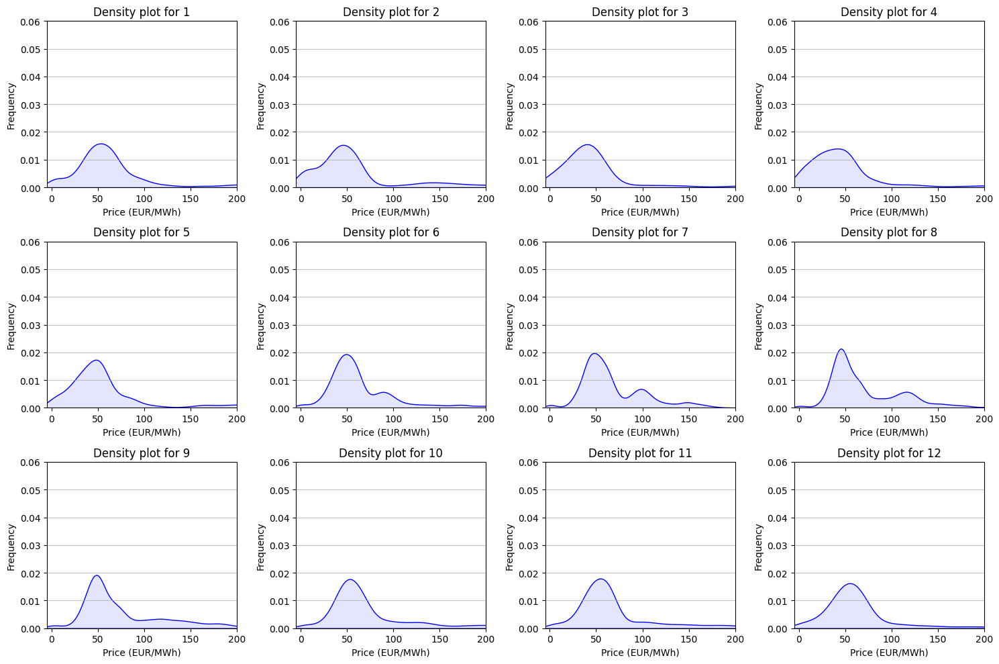

In [38]:
#For each month
plt.figure(figsize=(15, 10))

months = range(1, 13)  

for month in months:
    plt.subplot(3, 4, month)  # Create a 3x4 grid of subplots
    sns.kdeplot(data=full_data[full_data['month'] == month]['price_DA'], color='blue', label='Weekday', fill=True, alpha=0.1)
    plt.title(f'Density plot for {month}')
    plt.xlabel('Price (EUR/MWh)')
    plt.ylabel('Frequency')
    plt.ylim([0, 0.06])
    plt.xlim([-5, 200])  # Adjust the x-axis limit for better visibility
    plt.grid(axis='y', alpha=0.75)

plt.tight_layout()
plt.show()

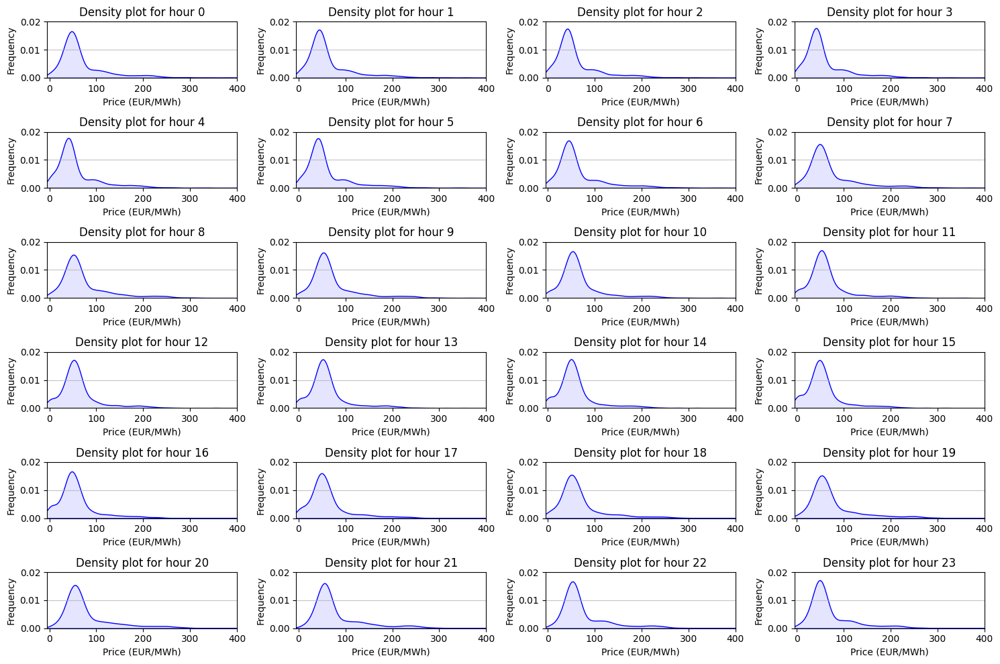

In [39]:
#For each hour
plt.figure(figsize=(15, 10))

hours = range(0, 24)  

for hour in hours:
    plt.subplot(6, 4, hour+1)  # Create a 6x4 grid of subplots
    sns.kdeplot(data=full_data[full_data['hour'] == hour]['price_DA'], color='blue', label='Weekday', fill=True, alpha=0.1)
    plt.title(f'Density plot for hour {hour}')
    plt.xlabel('Price (EUR/MWh)')
    plt.ylabel('Frequency')
    plt.ylim([0, 0.02])
    plt.xlim([-5, 400])  # Adjust the x-axis limit for better visibility
    plt.grid(axis='y', alpha=0.75)

plt.tight_layout()
plt.show()

Prices have been very different distributions depending on the year, lets use a reduced dataset of 2023 and 2024

Let's look also at monthly distribution in 2023 and 2024:

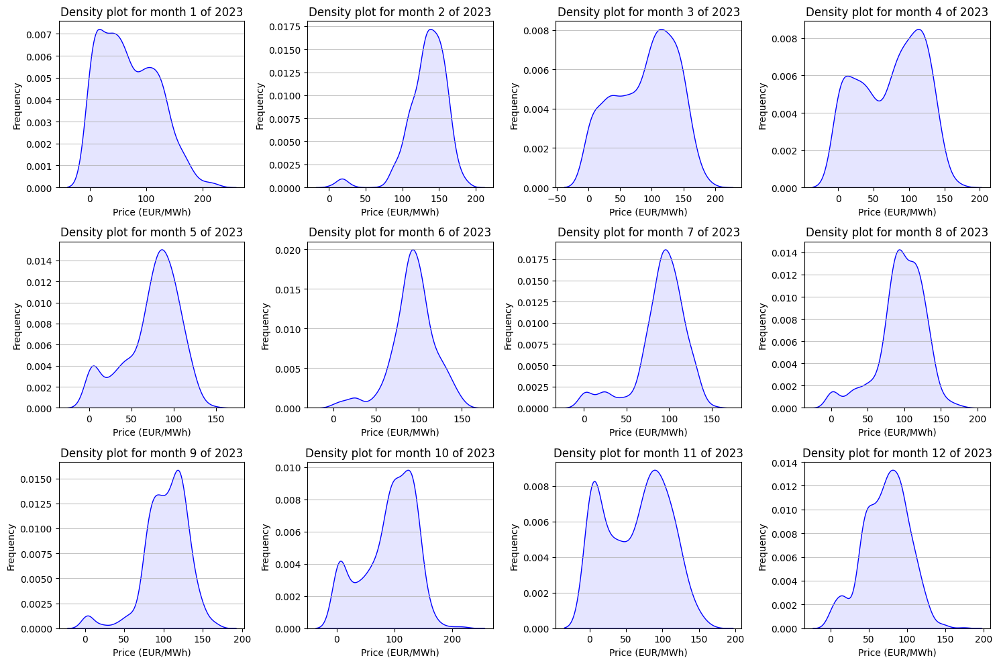

In [41]:
#For each month of 2023
plt.figure(figsize=(15, 10))

year = 2023
months = range(1, 13)  

for month in months:
    plt.subplot(3, 4, month)  # Create a 3x4 grid of subplots
    sns.kdeplot(data=full_data[(full_data['month'] == month) & (full_data['year'] == year)]['price_DA'], color='blue', label='Weekday', fill=True, alpha=0.1)
    plt.title(f'Density plot for month {month} of 2023')
    plt.xlabel('Price (EUR/MWh)')
    plt.ylabel('Frequency')
    plt.grid(axis='y', alpha=0.75)

plt.tight_layout()
plt.show()

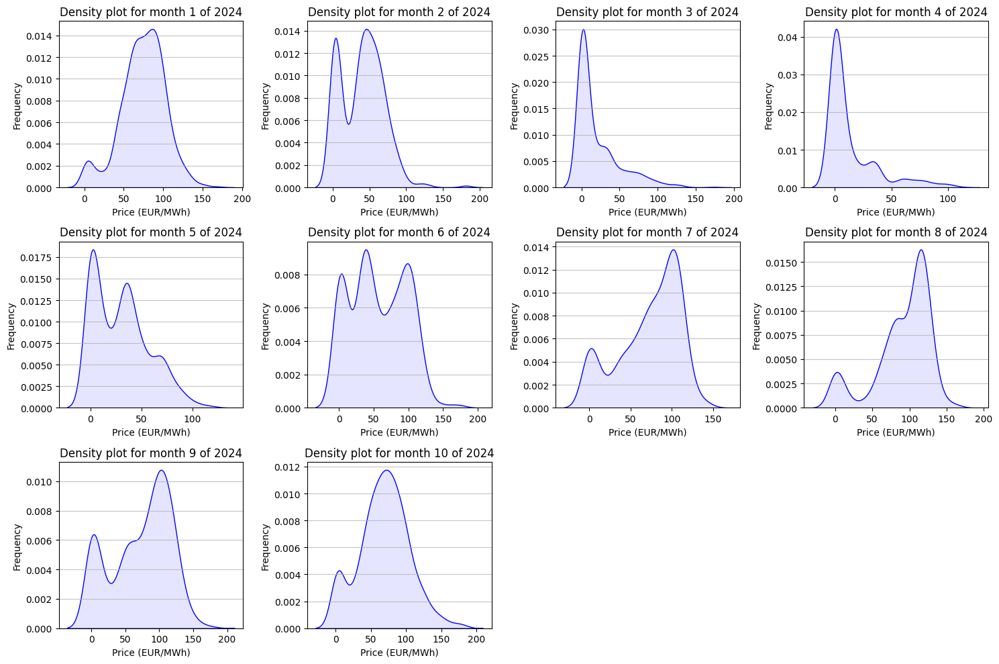

In [57]:
#For each month of 2024
plt.figure(figsize=(15, 10))

year = 2024
months = range(1, 11)  

for month in months:
    plt.subplot(3, 4, month)  # Create a 3x4 grid of subplots
    sns.kdeplot(data=full_data[(full_data['month'] == month) & (full_data['year'] == year)]['price_DA'], color='blue', label='Weekday', fill=True, alpha=0.1)
    plt.title(f'Density plot for month {month} of 2024')
    plt.xlabel('Price (EUR/MWh)')
    plt.ylabel('Frequency')
    plt.grid(axis='y', alpha=0.75)

plt.tight_layout()
plt.show()

# END OF DATA EXPLORATION
___

# 3. DATA Cleaning

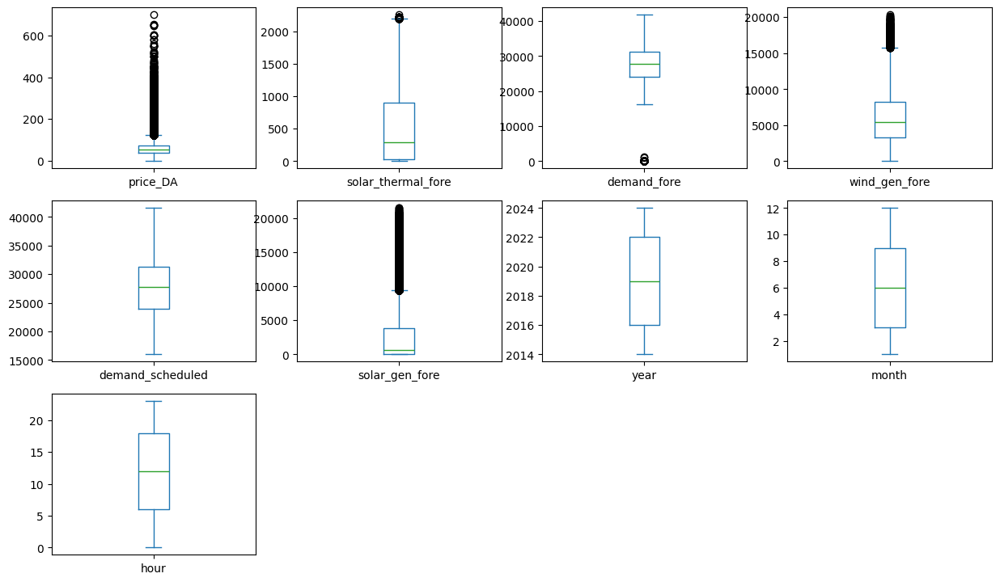

In [45]:
boxplot_attributes = full_data.plot(kind='box', subplots=True, layout=(5, 4), figsize=(15, 15),
                                 sharex=False, sharey=False, fontsize=10)

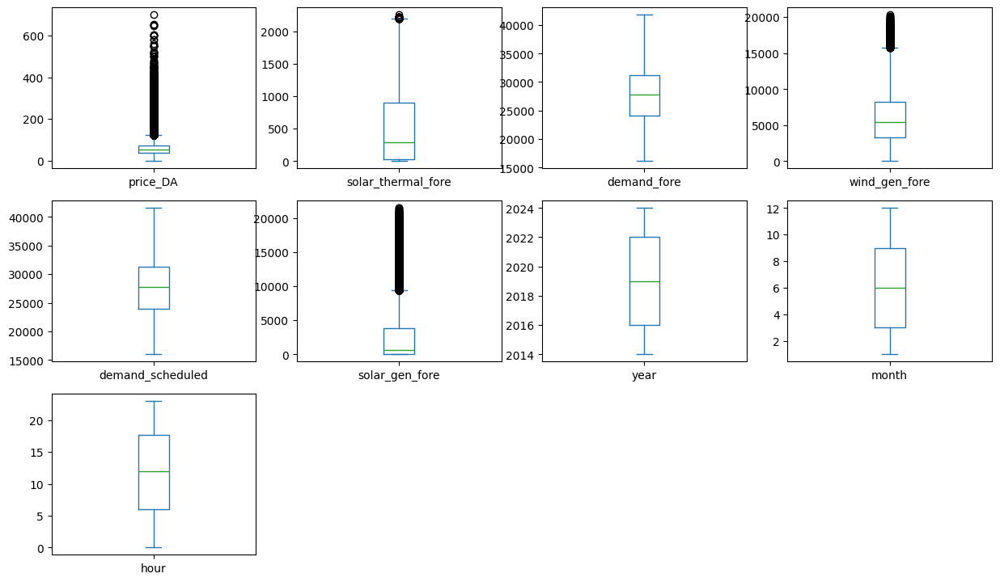

In [46]:
def remove_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    return data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]


full_data_no_outliers = remove_outliers_iqr(full_data, 'demand_fore')


atributos_boxplot = full_data_no_outliers.plot(kind='box', subplots=True, layout=(5, 4), figsize=(15, 15),
                                 sharex=False, sharey=False, fontsize=10)

# End of 3th PART
---

# 4. Feature Creation


Initial plots looking for some correlations...

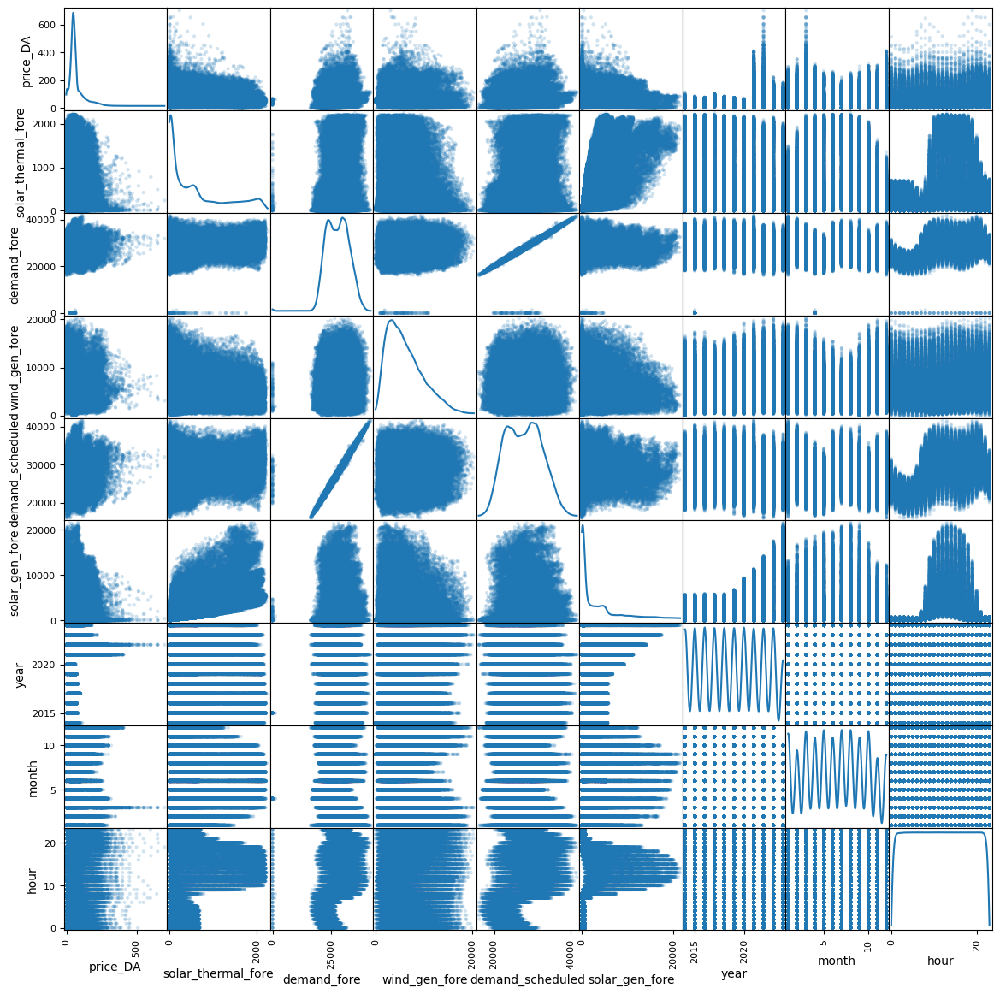

In [48]:
from pandas.plotting import scatter_matrix

scatter_matrix(full_data, alpha=0.2, figsize=(14, 14), diagonal='kde', range_padding=0.05)
plt.show()


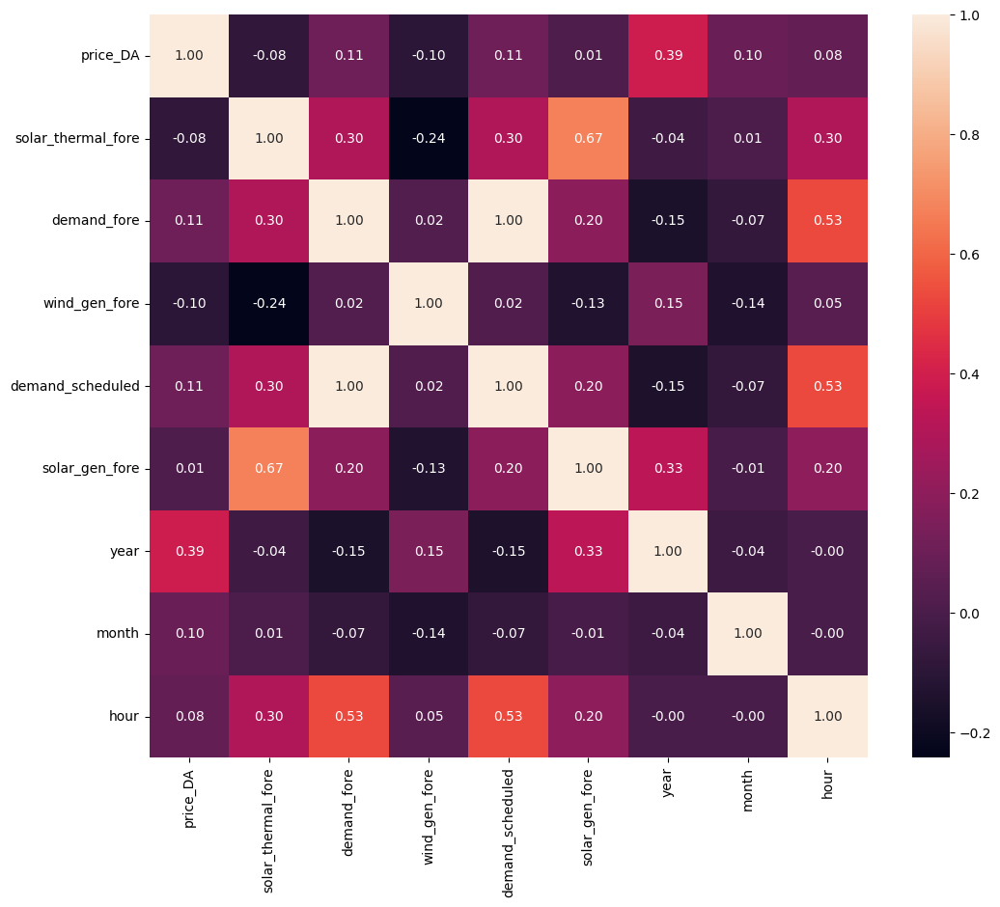

In [49]:
# Calculation of correlation coefficients
corr = full_data_no_outliers.iloc[:,0:].corr(method='pearson')  # method{‘pearson’, ‘kendall’, ‘spearman’} 

# Plot Heat Map,
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt=".2f")
plt.show()

Lets create a reduced dataset to check again, only with data from 2023 and 2024. 

In [50]:
reduced_data_no_outliers = full_data_no_outliers[(full_data_no_outliers['year']==2023)|(full_data['year']==2024)]
reduced_data_no_outliers

/var/folders/h1/pxtpg4h944j672ncc_wl9qp80000gn/T/ipykernel_18862/2287286099.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  reduced_data_no_outliers = full_data_no_outliers[(full_data_no_outliers['year']==2023)|(full_data['year']==2024)]


,price_DA,solar_thermal_fore,demand_fore,wind_gen_fore,demand_scheduled,solar_gen_fore,year,month,hour
2023-01-01 00:00:00,0.00,3.625,20042.250000,8124.00,20060.75,3.625,2023,1,0
2023-01-01 01:00:00,0.00,2.325,19383.750000,7173.75,19241.00,2.325,2023,1,1
2023-01-01 02:00:00,0.00,0.900,18216.083333,6380.75,18151.75,0.900,2023,1,2
2023-01-01 03:00:00,0.00,0.575,17126.666667,6469.25,17043.50,0.575,2023,1,3
2023-01-01 04:00:00,0.00,0.600,16551.666667,7175.50,16469.25,0.600,2023,1,4
...,...,...,...,...,...,...,...,...,...
2024-10-31 19:00:00,135.01,82.550,30143.666667,3972.75,29705.50,82.550,2024,10,19
2024-10-31 20:00:00,148.72,94.400,29875.750000,4615.25,29545.50,94.400,2024,10,20
2024-10-31 21:00:00,134.34,97.750,29014.000000,4913.00,28285.50,97.750,2024,10,21
2024-10-31 22:00:00,115.20,64.150,26512.166667,4820.25,25917.00,64.150,2024,10,22


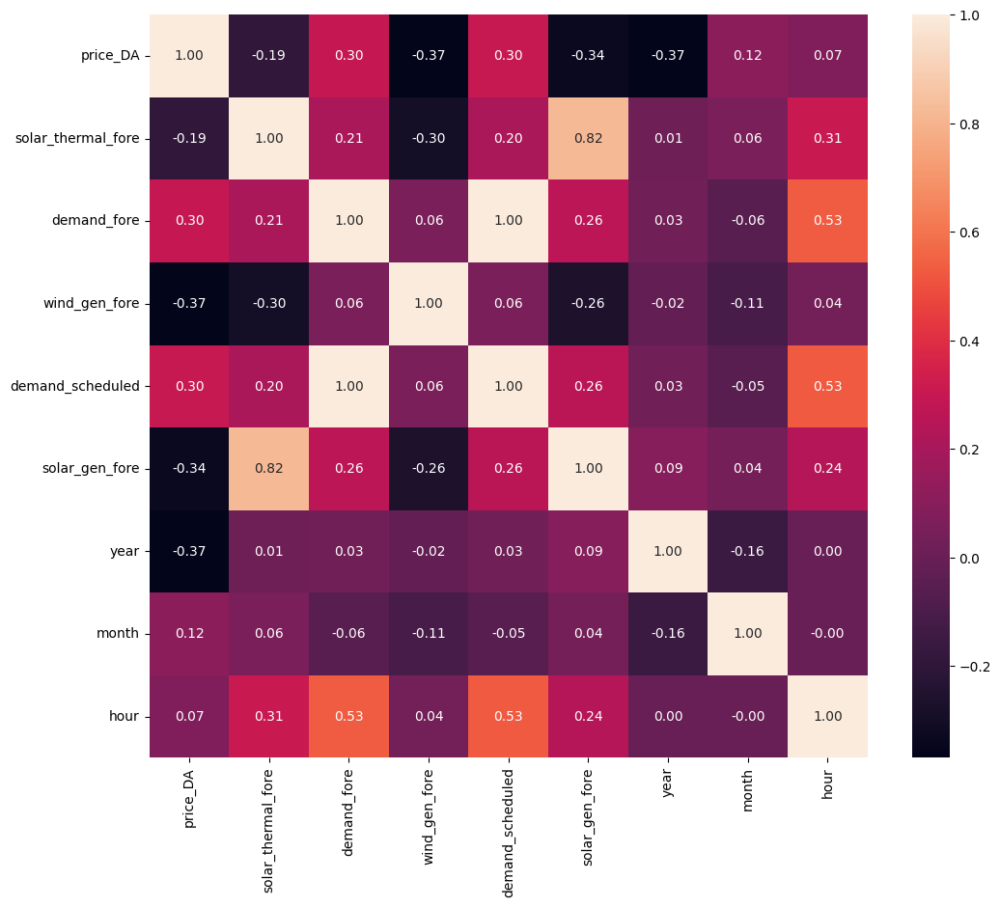

In [51]:
# Calculation of correlation coefficients
corr = reduced_data_no_outliers.iloc[:,0:].corr(method='pearson')  # method{‘pearson’, ‘kendall’, ‘spearman’} 

# Plot Heat Map,
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt=".2f")
plt.show()

**The correlation coefficients improve when considering a reduced dataset.**

## 4.1. Time Based, Lagged and Rolling Features

**Time-based** features help capture patterns in the data related to daily, weekly, or seasonal cycle.

**Lagged features** help the model see recent values, allowing it to learn short-term dependencies. For instance, if energy prices were high in the last hour, they might still be high. They are applied selectively to columns where recent values are likely to influence future values, particularly ic areas like prices, demand, and variable renewab generation. 

**Rolling (averaged) features** are applied to specific columns where understanding recent trends or cumulative effects over short to medium timefra es (e.g., 3, 6, or 24 hours) is particularly useful for predicting future values. coloumns with price, demand and renewable generat \
on.

In [ ]:
# Function to add time-based features
def create_time_based_features(data):
    if not isinstance(data.index, pd.DatetimeIndex):
        data.index = pd.to_datetime(data.index)
    data['day_of_week'] = data.index.dayofweek # The day of the week (0=Monday, 6=Sunday).
    data['week_of_year'] = data.index.isocalendar().week # The week number in the year (1-52), which can help identify seasonal patterns.
    data['is_weekend'] = data['day_of_week'].apply(lambda x: 1 if x >= 5 else 0) # A flag indicating if the day is a weekend (1 for Saturday/Sunday, 0 otherwise).
    return data

# Function to create lagged features
def create_lagged_features(data, columns, lags=[24, 48]):
    for column in columns:
        for lag in lags:
            data[f"{column}_lag_{lag}"] = data[column].shift(lag)
    return data

# Function to create rolling/averaged features
def create_rolling_features(data, columns, windows=[24, 48], agg_func="mean"):
    for column in columns:
        for window in windows:
            if agg_func == "mean":
                data[f"{column}_roll_mean_{window}"] = data[column].rolling(window=window, min_periods=1).mean()
            elif agg_func == "sum":
                data[f"{column}_roll_sum_{window}"] = data[column].rolling(window=window, min_periods=1).sum()
    return data


# time-based features
reduced_data_with_features = create_time_based_features(reduced_data_no_outliers)

# lagged features
lagged_columns = ['price_DA']
#lagged_columns = ['price_DA', 'demand_prevista', 'demand_prog', 'prevision_produccion_eolica', 'generacion_prevista_solar']
reduced_data_with_features = create_lagged_features(reduced_data_no_outliers, lagged_columns, lags=[24, 48])

# Add rolling features
price_column = ['price_DA']
demand_columns = ['demand_prevista', 'demand_prog']
#generation_columns = ['pbf_total', 'pbf_eolica', 'pbf_solar_fot']
generation_columns = ['prevision_produccion_eolica', 'generacion_prevista_solar']
reduced_data_with_features = create_rolling_features(reduced_data_no_outliers, price_column, windows=[24,48], agg_func="mean")

# Collect names of all added columns (time-based, lagged, and rolling features)
time_based_columns = ['hour', 'day_of_week', 'month', 'week_of_year', 'is_weekend']
lagged_feature_columns = [f"{col}_lag_{lag}" for col in lagged_columns for lag in [24, 48]]
rolling_feature_columns = [f"{col}_roll_mean_{win}" for col in price_column + demand_columns + generation_columns for win in [3, 6, 24]]
added_columns = time_based_columns + lagged_feature_columns + rolling_feature_columns

reduced_data_with_features 

/var/folders/h1/pxtpg4h944j672ncc_wl9qp80000gn/T/ipykernel_18862/1952467808.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['day_of_week'] = data.index.dayofweek # The day of the week (0=Monday, 6=Sunday).
/var/folders/h1/pxtpg4h944j672ncc_wl9qp80000gn/T/ipykernel_18862/1952467808.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['week_of_year'] = data.index.isocalendar().week # The week number in the year (1-52), which can help identify seasonal patterns.
/var/folders/h1/pxtpg4h944j672ncc_w

,price_DA,solar_thermal_fore,demand_fore,wind_gen_fore,demand_scheduled,solar_gen_fore,year,month,hour,day_of_week,week_of_year,is_weekend,price_DA_lag_24,price_DA_lag_48,price_DA_roll_mean_24,price_DA_roll_mean_48
2023-01-01 00:00:00,0.00,3.625,20042.250000,8124.00,20060.75,3.625,2023,1,0,6,52,1,NaN,NaN,0.000000,0.000000
2023-01-01 01:00:00,0.00,2.325,19383.750000,7173.75,19241.00,2.325,2023,1,1,6,52,1,NaN,NaN,0.000000,0.000000
2023-01-01 02:00:00,0.00,0.900,18216.083333,6380.75,18151.75,0.900,2023,1,2,6,52,1,NaN,NaN,0.000000,0.000000
2023-01-01 03:00:00,0.00,0.575,17126.666667,6469.25,17043.50,0.575,2023,1,3,6,52,1,NaN,NaN,0.000000,0.000000
2023-01-01 04:00:00,0.00,0.600,16551.666667,7175.50,16469.25,0.600,2023,1,4,6,52,1,NaN,NaN,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-31 19:00:00,135.01,82.550,30143.666667,3972.75,29705.50,82.550,2024,10,19,3,44,0,143.36,93.34,99.792083,89.002708
2024-10-31 20:00:00,148.72,94.400,29875.750000,4615.25,29545.50,94.400,2024,10,20,3,44,0,143.36,98.61,100.015417,90.046667
2024-10-31 21:00:00,134.34,97.750,29014.000000,4913.00,28285.50,97.750,2024,10,21,3,44,0,132.33,90.00,100.099167,90.970417
2024-10-31 22:00:00,115.20,64.150,26512.166667,4820.25,25917.00,64.150,2024,10,22,3,44,0,99.80,83.22,100.740833,91.636667


### Correlation matrix with added features

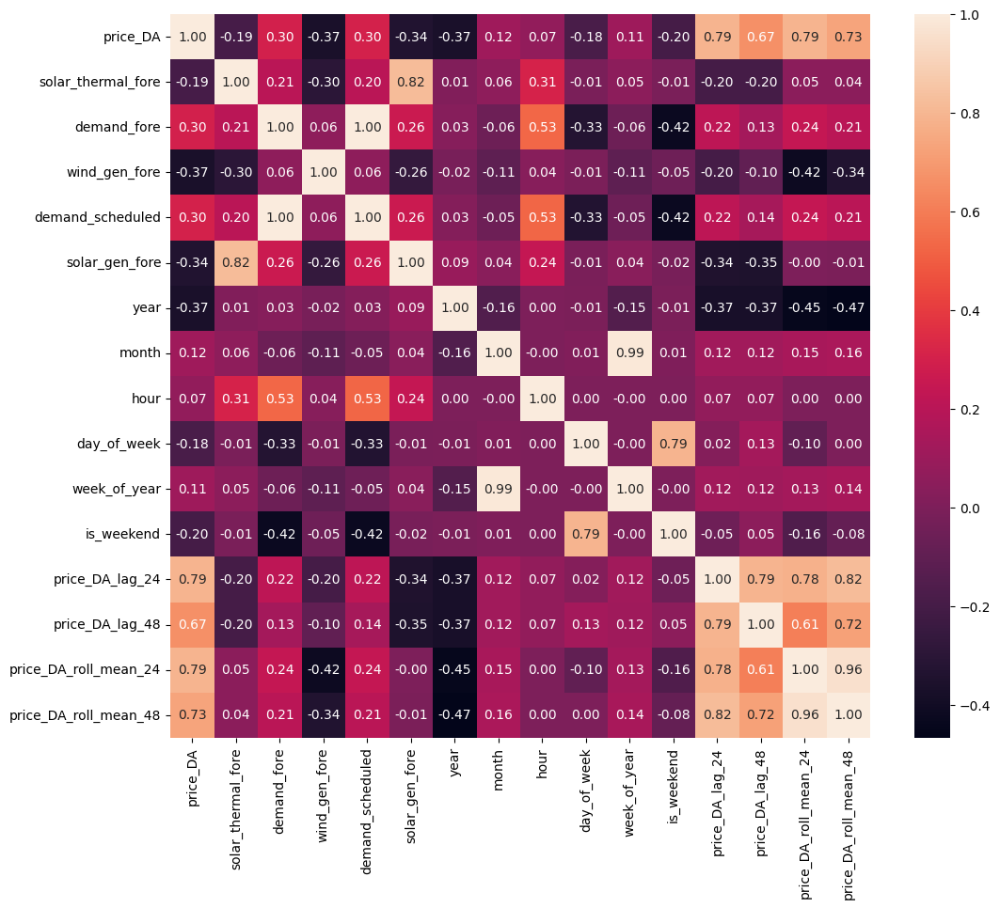

In [60]:
# Calculation of correlation coefficients
corr = reduced_data_with_features.iloc[:,0:].corr(method='pearson')  # method{‘pearson’, ‘kendall’, ‘spearman’} 

# Plot Heat Map,
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt=".2f")
plt.show()

**RESULT**: Significant correlation with lagged variables and rolling average.

## 4.2. Volitality Features

These features help the model identify trends or sudden shifts in pricing. Short term standard deviation and price differences reveal market conditions that may affect future prices.  
(For volatility features, only doing standardization captures the extent of variability around the mean.  
Normalization would scale volatility features to a 0-1 range, losing valuable information about how much they deviate.) 

In [ ]:
# Function to create price volatility features
def create_price_volatility_features(data, price_column='price_DA', std_windows=[3]):
    # Price difference (Diff) feature
    data[f"{price_column}_diff"] = data[price_column].diff() # Calculates the difference between the current and previous price. This helps capture sudden changes in price, which may indicate volatility.
    
    # Rolling standard deviation of price over specified windows
    for window in std_windows: # Computes the rolling standard deviation of prices over a 3-hour window, helping to capture short-term price volatility.
        data[f"{price_column}_roll_std_{window}"] = data[price_column].rolling(window=window, min_periods=1).std()
    
    return data

# Apply the function to add price volatility features
reduced_data_with_volatility_features = create_price_volatility_features(reduced_data_with_features, price_column='price_DA', std_windows=[3])

# Collect the newly added volatility feature columns
volatility_feature_columns = ['price_DA_diff', 'price_DA_roll_std_3']

# Display only the added price volatility feature columns
print(reduced_data_with_volatility_features[volatility_feature_columns].head())


# Selecting volatility features for standardization
volatility_features = reduced_data_with_volatility_features[volatility_feature_columns]

                     price_DA_diff  price_DA_roll_std_3
2023-01-01 00:00:00            NaN                  NaN
2023-01-01 01:00:00            0.0                  0.0
2023-01-01 02:00:00            0.0                  0.0
2023-01-01 03:00:00            0.0                  0.0
2023-01-01 04:00:00            0.0                  0.0


C:\Users\andre\AppData\Local\Temp\ipykernel_10796\2982309618.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[f"{price_column}_diff"] = data[price_column].diff() # Calculates the difference between the current and previous price. This helps capture sudden changes in price, which may indicate volatility.
C:\Users\andre\AppData\Local\Temp\ipykernel_10796\2982309618.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[f"{price_column}_roll_std_{window}"] = data[price_column].rolling(window=window, 

### Correlation matrix with added features

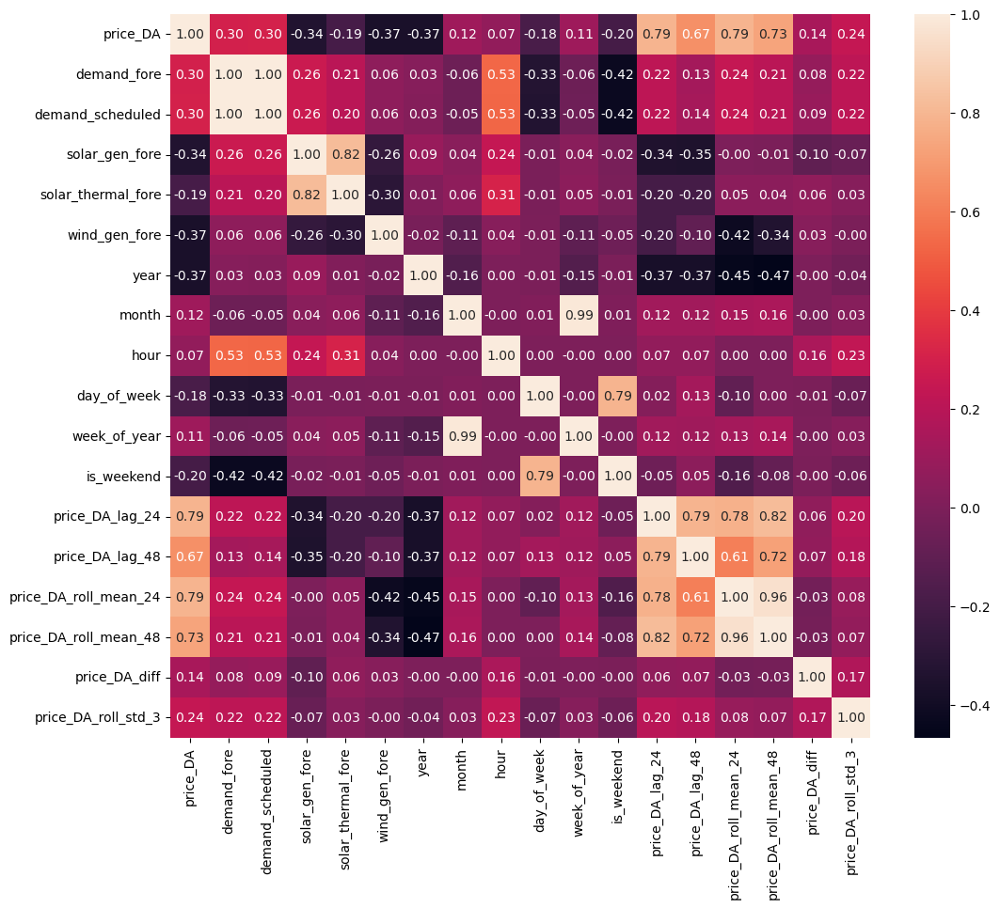

In [37]:
# Calculation of correlation coefficients
corr = reduced_data_with_volatility_features.iloc[:,0:].corr(method='pearson')  # method{‘pearson’, ‘kendall’, ‘spearman’} 

# Plot Heat Map,
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt=".2f")
plt.show()

**RESULT**: Not so good correlation with these features

In [38]:
dataset_after_feature_selection = reduced_data_with_volatility_features

# END OF 4th PART
---

# 5. Model Building

## 5.1. Splitting the data into training, validation, and test data

In [ ]:
# Features X ; Target y 
X = dataset_after_feature_selection.drop(['price_DA'], axis=1) 
y = dataset_after_feature_selection['price_DA']

In [40]:
from sklearn.model_selection import train_test_split

test_size = 0.20

# Dividing the data into training, validation and test data.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size,
                                                    shuffle=False)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=test_size,
                                                    shuffle=False)

In [41]:
X_val

,demand_fore,demand_scheduled,solar_gen_fore,solar_thermal_fore,wind_gen_fore,year,month,hour,day_of_week,week_of_year,is_weekend,price_DA_lag_24,price_DA_lag_48,price_DA_roll_mean_24,price_DA_roll_mean_48,price_DA_diff,price_DA_roll_std_3
2024-03-04 18:00:00,32157.750000,31010.25,2215.350,216.400,13129.00,2024,3,18,0,10,0,2.06,3.20,8.420417,5.958750,1.80,1.361727
2024-03-04 19:00:00,34163.416667,33342.75,164.950,113.950,13283.00,2024,3,19,0,10,0,7.98,8.12,8.671250,6.081250,9.00,5.786190
2024-03-04 20:00:00,35437.083333,34990.00,154.175,154.175,13492.50,2024,3,20,0,10,0,29.60,31.25,8.479583,5.951042,11.00,10.016653
2024-03-04 21:00:00,34284.500000,34105.25,125.400,125.400,14051.25,2024,3,21,0,10,0,30.60,30.60,7.953750,5.688125,-7.02,5.569572
2024-03-04 22:00:00,30888.250000,30729.75,69.325,69.325,13861.25,2024,3,22,0,10,0,14.00,5.60,7.891250,5.831875,-5.48,6.265791
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-19 19:00:00,29121.083333,28482.75,7326.975,527.550,5086.50,2024,6,19,2,25,0,45.28,21.72,78.410000,63.967917,41.36,24.934876
2024-06-19 20:00:00,29552.250000,29455.50,3403.175,491.275,5444.00,2024,6,20,2,25,0,80.23,46.38,78.709167,64.822708,7.58,26.341443
2024-06-19 21:00:00,29719.750000,29631.75,882.325,319.775,5778.00,2024,6,21,2,25,0,124.12,72.75,78.112917,65.594792,22.40,15.588547
2024-06-19 22:00:00,28554.750000,28281.75,273.200,271.200,6565.25,2024,6,22,2,25,0,130.90,91.27,77.200417,65.964167,-0.81,12.705276


In [42]:
X_test

,demand_fore,demand_scheduled,solar_gen_fore,solar_thermal_fore,wind_gen_fore,year,month,hour,day_of_week,week_of_year,is_weekend,price_DA_lag_24,price_DA_lag_48,price_DA_roll_mean_24,price_DA_roll_mean_48,price_DA_diff,price_DA_roll_std_3
2024-06-20 00:00:00,24672.166667,24187.25,231.400,231.400,7486.75,2024,6,0,3,25,0,105.16,51.76,76.503750,67.720625,19.67,11.282173
2024-06-20 01:00:00,23503.500000,23285.75,176.075,176.075,7890.50,2024,6,1,3,25,0,99.96,37.00,76.713750,69.137292,-4.26,10.348306
2024-06-20 02:00:00,22422.166667,22423.50,214.800,214.800,7645.00,2024,6,2,3,25,0,94.76,51.01,77.057083,70.220417,-2.00,3.197270
2024-06-20 03:00:00,22004.500000,21871.00,114.175,114.175,7237.25,2024,6,3,3,25,0,90.56,52.59,77.537917,71.251875,-0.90,1.484363
2024-06-20 04:00:00,21927.416667,21960.75,97.400,97.400,6190.75,2024,6,4,3,25,0,90.56,53.99,77.802083,72.145833,-5.20,3.292922
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-31 19:00:00,30143.666667,29705.50,82.550,82.550,3972.75,2024,10,19,3,44,0,143.36,93.34,99.792083,89.002708,0.87,2.676957
2024-10-31 20:00:00,29875.750000,29545.50,94.400,94.400,4615.25,2024,10,20,3,44,0,143.36,98.61,100.015417,90.046667,13.71,8.178197
2024-10-31 21:00:00,29014.000000,28285.50,97.750,97.750,4913.00,2024,10,21,3,44,0,132.33,90.00,100.099167,90.970417,-14.38,8.115801
2024-10-31 22:00:00,26512.166667,25917.00,64.150,64.150,4820.25,2024,10,22,3,44,0,99.80,83.22,100.740833,91.636667,-19.14,16.816234


## 5.2. Normalisation

In [43]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the scaler on the training data
X_train_scaled = scaler.fit_transform(X_train)

# Use the same scaler to transform the validation and test data (do not fit again)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

## 5.3. Model building and evaluation

In [ ]:
from sklearn.metrics import get_scorer_names
print(get_scorer_names())

['accuracy', 'adjusted_mutual_info_score', 'adjusted_rand_score', 'average_precision', 'balanced_accuracy', 'completeness_score', 'explained_variance', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'fowlkes_mallows_score', 'homogeneity_score', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_weighted', 'matthews_corrcoef', 'max_error', 'mutual_info_score', 'neg_brier_score', 'neg_log_loss', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error', 'neg_mean_gamma_deviance', 'neg_mean_poisson_deviance', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_median_absolute_error', 'neg_negative_likelihood_ratio', 'neg_root_mean_squared_error', 'normalized_mutual_info_score', 'positive_likelihood_ratio', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'r2', 'rand_score', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'roc_auc', 'roc_auc_ovo', 'roc_auc_ovo_weight

In [ ]:
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, ElasticNet
from xgboost import XGBRegressor


# Define the number of folds and error metrics
num_folds = 5
error_metrics = {'neg_root_mean_squared_error', 'r2'}


# Define a dictionary with models
models = {
    ('MLP', MLPRegressor()),
    ('RFR', RandomForestRegressor()),
    ('SVR', SVR()),
    ('AdaB', AdaBoostRegressor()),
    ('GBR', GradientBoostingRegressor()),  # Gradient Boosting Regressor
    ('DTR', DecisionTreeRegressor()),  # Decision Tree Regressor
    ('XGB', XGBRegressor()),  # XGBoost Regressor
    ('LR', LinearRegression()),  # Linear Regression
    ('EN', ElasticNet())  # ElasticNet Regressor
}

In [46]:
import numpy as np
print("Number of NaN values in X_train_scaled:", np.isnan(X_train_scaled).sum())
print("Number of NaN values in y_train:", np.isnan(y_train).sum())

Number of NaN values in X_train_scaled: 74
Number of NaN values in y_train: 0


In [47]:
# Replace NaN in X_train_scaled with column mean
col_mean = np.nanmean(X_train_scaled, axis=0)
inds = np.where(np.isnan(X_train_scaled))
X_train_scaled[inds] = np.take(col_mean, inds[1])

# Replace NaN in y_train with the mean value. We could also try to remove the rows later
y_train = np.nan_to_num(y_train, nan=np.nanmean(y_train))

####### Evaluation metric:  neg_root_mean_squared_error

Training model: EN with neg_root_mean_squared_error...
Performing TimeSeriesSplit with 5 folds...
Model: EN, neg_root_mean_squared_error Mean: -33.8418, Std: 8.0890


Training model: XGB with neg_root_mean_squared_error...
Performing TimeSeriesSplit with 5 folds...
Model: XGB, neg_root_mean_squared_error Mean: -20.9851, Std: 5.5204


Training model: MLP with neg_root_mean_squared_error...
Performing TimeSeriesSplit with 5 folds...
Model: MLP, neg_root_mean_squared_error Mean: -21.9879, Std: 5.7212


Training model: RFR with neg_root_mean_squared_error...
Performing TimeSeriesSplit with 5 folds...
Model: RFR, neg_root_mean_squared_error Mean: -20.1483, Std: 5.7990


Training model: AdaB with neg_root_mean_squared_error...
Performing TimeSeriesSplit with 5 folds...
Model: AdaB, neg_root_mean_squared_error Mean: -22.4929, Std: 5.1824


Training model: GBR with neg_root_mean_squared_error...
Performing TimeSeriesSplit with 5 folds...

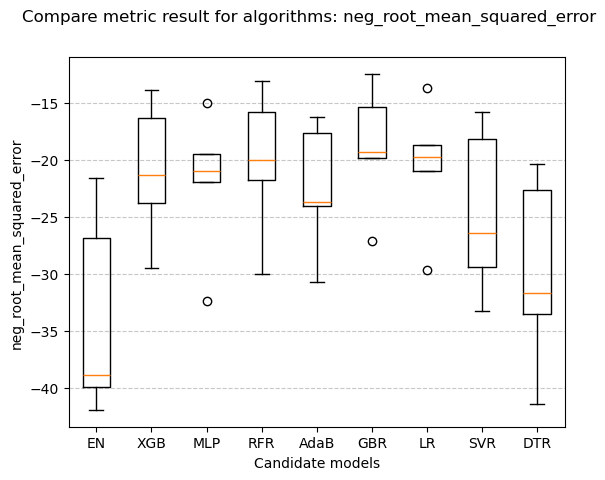

####### Evaluation metric:  r2

Training model: EN with r2...
Performing TimeSeriesSplit with 5 folds...
Model: EN, r2 Mean: 0.0659, Std: 0.2024


Training model: XGB with r2...
Performing TimeSeriesSplit with 5 folds...
Model: XGB, r2 Mean: 0.6344, Std: 0.1078


Training model: MLP with r2...
Performing TimeSeriesSplit with 5 folds...
Model: MLP, r2 Mean: 0.4773, Std: 0.4692


Training model: RFR with r2...
Performing TimeSeriesSplit with 5 folds...
Model: RFR, r2 Mean: 0.6671, Std: 0.1000


Training model: AdaB with r2...
Performing TimeSeriesSplit with 5 folds...
Model: AdaB, r2 Mean: 0.5718, Std: 0.0924


Training model: GBR with r2...
Performing TimeSeriesSplit with 5 folds...
Model: GBR, r2 Mean: 0.7062, Std: 0.0822


Training model: LR with r2...
Performing TimeSeriesSplit with 5 folds...
Model: LR, r2 Mean: 0.5532, Std: 0.3996


Training model: SVR with r2...
Performing TimeSeriesSplit with 5 folds...
Model: SVR, r2 Mean: 0.5109, Std: 0.1125


Training model: DTR with r2...
Per

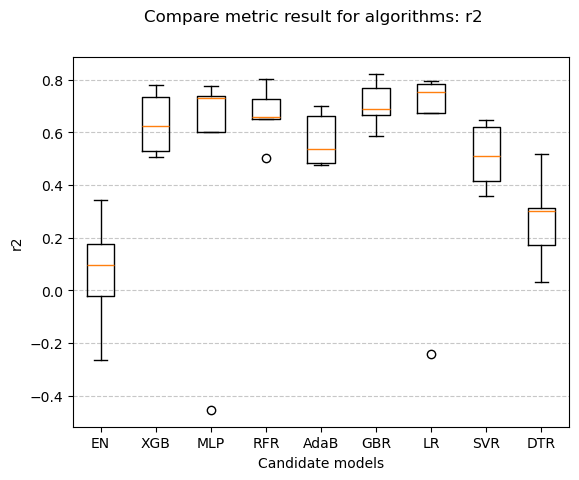

In [ ]:
from sklearn.model_selection import TimeSeriesSplit, cross_val_score, GridSearchCV
from sklearn.exceptions import ConvergenceWarning

# Cross-validation training
for scoring in error_metrics:
    results = [] # store metrics results
    msg = []  # print summary of result
    names = []  # store name of the models
    print('####### Evaluation metric: ', scoring)
    
    for name, model in models:
        print(f'\nTraining model: {name} with {scoring}...')
        cross_validation = TimeSeriesSplit(n_splits=num_folds)
        
        # Start the cross-validation process and print verbose output
        print(f"Performing TimeSeriesSplit with {num_folds} folds...") 
        
        cv_results = cross_val_score(model, X_train_scaled, y_train, cv=cross_validation, scoring=scoring)
        
        print(f"Model: {name}, {scoring} Mean: {cv_results.mean():.4f}, Std: {cv_results.std():.4f}\n")

        results.append(cv_results)
        names.append(name)
        resume = (name, cv_results.mean(), cv_results.std())
        msg.append(resume)
    

    # Compare results between algorithms
    fig = plt.figure()
    fig.suptitle('Compare metric result for algorithms: %s' %scoring)
    ax = fig.add_subplot(111)
    ax.set_xlabel('Candidate models')
    ax.set_ylabel('%s' %scoring)
    plt.boxplot(results)
    ax.set_xticklabels(names)
    # Show a grid for better readability
    ax.grid(True, axis='y', linestyle='--', alpha=0.7)
    plt.show()

    results = []

## Best Model Hyperparameters Adjustment

### Note DS: Below are all the possible models
### Keep in mind that important parameters are listed first

## Model summary:

#### model = AdaBoostRegressor()

params = {
    'estimator': [None],  # default=None
    'n_estimators': [50],  # default=50
    'learning_rate': [1.0],  # default=1.0
    'loss': ['linear', 'square', 'exponential'],  # default='linear'
    'random_state': [None],  # default=None
}


#### model = MLPRegressor()

params = {
    'hidden_layer_sizes': [(100,)],  # default=(100,)
    'activation': ['identity', 'logistic', 'tanh', 'relu'],  # default='relu'
    'solver': ['lbfgs', 'sgd', 'adam'],  # default='adam'
    'alpha': [0.0001],  # default=0.0001
    'batch_size': ['auto'],  # default='auto'
    'learning_rate': ['constant', 'invscaling', 'adaptive'],  # default='constant'
    'learning_rate_init': [0.001],  # default=0.001
    'power_t': [0.5],  # default=0.5
    'max_iter': [200],  # default=200
    'shuffle': [True],  # default=True
    'random_state': [None],  # default=None
    'tol': [0.0001],  # default=0.0001
    'verbose': [False],  # default=False
    'warm_start': [False],  # default=False
    'momentum': [0.9],  # default=0.9
    'nesterovs_momentum': [True],  # default=True
    'early_stopping': [False],  # default=False
    'validation_fraction': [0.1],  # default=0.1
    'beta_1': [0.9],  # default=0.9
    'beta_2': [0.999],  # default=0.999
    'epsilon': [1e-08],  # default=1e-08
    'n_iter_no_change': [10],  # default=10
    'max_fun': [15000],  # default=15000
}


#### model = XGBRegressor()

params = {
    'n_estimators': [100],  # default=100
    'learning_rate': [0.3],  # default=0.3
    'max_depth': [6],  # default=6
    'objective': ['reg:squarederror'],  # default='reg:squarederror'
    'booster': ['gbtree', 'gblinear', 'dart'],  # default='gbtree'
    'gamma': [0],  # default=0
    'min_child_weight': [1],  # default=1
    'subsample': [1],  # default=1
    'colsample_bytree': [1],  # default=1
    'reg_alpha': [0],  # default=0
    'reg_lambda': [1],  # default=1
    'random_state': [None],  # default=None
}

#### model = DecisionTreeRegressor()

params = {
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],  # default='squared_error'
    'splitter': ['best', 'random'],  # default='best'
    'max_depth': [None],  # default=None
    'min_samples_split': [2],  # default=2
    'min_samples_leaf': [1],  # default=1
    'min_weight_fraction_leaf': [0.0],  # default=0.0
    'max_features': [None],  # default=None
    'random_state': [None],  # default=None
    'max_leaf_nodes': [None],  # default=None
    'min_impurity_decrease': [0.0],  # default=0.0
    'ccp_alpha': [0.0],  # default=0.0
    'monotonic_cst': [None],  # default=None
}


#### model = SVR()

params = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid', 'precomputed'],  # default='rbf'
    'degree': [3],  # default=3
    'gamma': ['scale', 'auto'],  # default='scale'
    'coef0': [0.0],  # default=0.0
    'tol': [0.001],  # default=0.001
    'C': [1.0],  # default=1.0
    'epsilon': [0.1],  # default=0.1
    'shrinking': [True],  # default=True
    'cache_size': [200],  # default=200
    'verbose': [False],  # default=False
    'max_iter': [-1],  # default=-1
}


#### model = ElasticNet()

params = {
    'alpha': [1.0],  # default=1.0
    'l1_ratio': [0.5],  # default=0.5
    'fit_intercept': [True],  # default=True
    'precompute': [False],  # default=False
    'max_iter': [1000],  # default=1000
    'copy_X': [True],  # default=True
    'tol': [0.0001],  # default=0.0001
    'warm_start': [False],  # default=False
    'positive': [False],  # default=False
    'random_state': [None],  # default=None
    'selection': ['cyclic', 'random'],  # default='cyclic'
}


#### model = RandomForestRegressor()

params = {
    'n_estimators': [100],  # default=100
    'criterion': ['squared_error', 'absolute_error', 'poisson'],  # default='squared_error'
    'max_depth': [None],  # default=None
    'min_samples_split': [2],  # default=2
    'min_samples_leaf': [1],  # default=1
    'min_weight_fraction_leaf': [0.0],  # default=0.0
    'max_features': ['sqrt', 'log2', None],  # default='sqrt'
    'max_leaf_nodes': [None],  # default=None
    'min_impurity_decrease': [0.0],  # default=0.0
    'bootstrap': [True],  # default=True
    'oob_score': [False],  # default=False
    'n_jobs': [None],  # default=None
    'random_state': [None],  # default=None
    'verbose': [0],  # default=0
    'warm_start': [False],  # default=False
    'ccp_alpha': [0.0],  # default=0.0
    'max_samples': [None],  # default=None
    'monotonic_cst': [None],  # default=None
}


#### model = LinearRegression()

params = {
    'fit_intercept': [True],  # default=True
    'copy_X': [True],  # default=True
    'n_jobs': [None],  # default=None
    'positive': [False],  # default=False
}


#### model = GradientBoostingRegressor()

params = {
    'loss': ['squared_error', 'absolute_error', 'huber', 'quantile'],  # default='squared_error'
    'learning_rate': [0.1],  # default=0.1
    'n_estimators': [100],  # default=100
    'subsample': [1.0],  # default=1.0
    'criterion': ['friedman_mse', 'squared_error'],  # default='friedman_mse'
    'min_samples_split': [2],  # default=2
    'min_samples_leaf': [1],  # default=1
    'min_weight_fraction_leaf': [0.0],  # default=0.0
    'max_depth': [3],  # default=3
    'min_impurity_decrease': [0.0],  # default=0.0
    'init': [None],  # default=None
    'random_state': [None],  # default=None
    'max_features': [None],  # default=None
    'alpha': [0.9],  # default=0.9
    'verbose': [0],  # default=0
    'max_leaf_nodes': [None],  # default=None
    'warm_start': [False],  # default=False
    'validation_fraction': [0.1],  # default=0.1
    'n_iter_no_change': [None],  # default=None
    'tol': [0.0001],  # default=0.0001
    'ccp_alpha': [0.0],  # default=0.0
}

In [49]:
#model = AdaBoostRegressor()
#model = MLPRegressor()
#model = XGBRegressor()
#model = DecisionTreeRegressor()
#model = SVR()
#model = ElasticNet()
#model = RandomForestRegressor()
#model = LinearRegression()
model = GradientBoostingRegressor()


scoring= 'r2'
params = {
    # Number of trees in random forest
    'n_estimators': [100, 500],  # default=100
    'learning_rate': [0.1, 0.2, 0.3, 0.4],
    'loss': ['quantile', 'squared_error', 'absolute_error'], # Default: Squared Error
     # Maximum number of levels in tree
   #  'max_depth': [2, None],  #deafult = None
     # Method of selecting samples for training each tree
}


# Search for the best combination of hyperparameters
cross_validation = TimeSeriesSplit(n_splits=5)
my_cv = cross_validation.split(X_val_scaled)
gsearch = GridSearchCV(estimator=model, param_grid=params, scoring=scoring, cv=my_cv, verbose=3)
gsearch.fit(X_val_scaled, y_val)

# Print best Result
print("Best result: %f using the following hyperparameters %s" % (gsearch.best_score_, gsearch.best_params_))
means = gsearch.cv_results_['mean_test_score']
stds = gsearch.cv_results_['std_test_score']
params = gsearch.cv_results_['params']

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.1, loss=quantile, n_estimators=100;, score=-2.150 total time=   0.8s
[CV 2/5] END learning_rate=0.1, loss=quantile, n_estimators=100;, score=0.464 total time=   1.3s
[CV 3/5] END learning_rate=0.1, loss=quantile, n_estimators=100;, score=0.513 total time=   2.1s
[CV 4/5] END learning_rate=0.1, loss=quantile, n_estimators=100;, score=0.652 total time=   2.8s
[CV 5/5] END learning_rate=0.1, loss=quantile, n_estimators=100;, score=0.743 total time=   3.5s
[CV 1/5] END learning_rate=0.1, loss=quantile, n_estimators=500;, score=-2.558 total time=   4.8s
[CV 2/5] END learning_rate=0.1, loss=quantile, n_estimators=500;, score=0.415 total time=   9.3s
[CV 3/5] END learning_rate=0.1, loss=quantile, n_estimators=500;, score=0.522 total time=  11.1s
[CV 4/5] END learning_rate=0.1, loss=quantile, n_estimators=500;, score=0.689 total time=  14.6s
[CV 5/5] END learning_rate=0.1, loss=quantile, n_estimators=500

## Final evaluation of the model

In [50]:
final_model_v1 = GradientBoostingRegressor(n_estimators=500, max_depth=None, learning_rate=0.3, loss='absolute_error') # Training with best hyperparameters
final_model_v1.fit(X_train_scaled,y_train)  # Training the model
y_predict_v1 = final_model_v1.predict(X_test_scaled)  # Making a prediction on the test data

In [51]:
from sklearn.metrics import r2_score, mean_squared_error

# Calculate R² (R-squared) score
r2 = r2_score(y_test, y_predict_v1)

# Calculate RMSE (Root Mean Squared Error)
rmse = mean_squared_error(y_test, y_predict_v1, squared=False)

# Print both the R² and RMSE scores
print(f"R² Score: {r2:.4f}")
print(f"RMSE: {rmse:.4f}")

R² Score: 0.7651
RMSE: 19.0217


In [52]:
import plotly.graph_objects as go

# Create the figure
fig = go.Figure()

# Add the trace for the actual consumption (True Values)
fig.add_trace(go.Scatter(x=y_test.index, y=y_test, mode='lines', name='True Values',
                         line=dict(color='blue', width=2)))

# Add the trace for the predicted consumption (Predicted Values)
fig.add_trace(go.Scatter(x=y_test.index, y=y_predict_v1, mode='lines', name='Predicted Values V1',
                         line=dict(color='red', width=2, dash='dot')))  # 'dot' for less separated dashes


# Update layout for a more beautiful plot
fig.update_layout(
    title='True vs Predicted Day-Ahead Price',
    xaxis_title='Date/Time',
    yaxis_title='Day-Ahead Price (EUR/MWh)',
    template='plotly',  # dark theme, can change to 'plotly' for light theme
    hovermode='x unified',  # hover over to show values for both lines at a time
    legend=dict(
        x=0.01, y=0.99,  # position of legend
        traceorder='normal',
        font=dict(family="Arial", size=12, color="white"),
        bgcolor='rgba(0, 0, 0, 0.3)',
        bordercolor='white',
        borderwidth=1
    ),
   
   
)

# Show the plot
fig.show()

## Add gas prices and reduced data of the model
We'll add gas prices and reduce the time horizon of the model, to include data from 1 year only. 

In [67]:
gas_data = pd.read_excel(directory+'/Gas data/Consolidated 2023-2024.xlsx')
gas_data

,Delivery day,MIBGAS PVB Last Price Index Day-Ahead [EUR/MWh],PGN Price [EUR/MWh],Capped Price [EUR/MWh]
0,2023-01-01,54.00,58.43,54.00
1,2023-01-02,54.00,59.75,54.00
2,2023-01-03,60.70,59.98,59.98
3,2023-01-04,63.00,72.00,63.00
4,2023-01-05,58.00,66.04,58.00
...,...,...,...,...
686,2024-11-17,45.96,NaN,45.96
687,2024-11-18,45.98,NaN,45.98
688,2024-11-19,46.84,NaN,46.84
689,2024-11-20,45.39,NaN,45.39


Resample and drop columns

In [68]:
gas_data['Delivery day'] = pd.to_datetime(gas_data['Delivery day'])
gas_data = gas_data.set_index('Delivery day')
gas_data = gas_data.loc[:,'Capped Price [EUR/MWh]']
gas_data.rename('Gas Price', inplace = True)
gas_data

Delivery day
2023-01-01    54.00
2023-01-02    54.00
2023-01-03    59.98
2023-01-04    63.00
2023-01-05    58.00
              ...  
2024-11-17    45.96
2024-11-18    45.98
2024-11-19    46.84
2024-11-20    45.39
2024-11-21    46.45
Name: Gas Price, Length: 691, dtype: float64

In [69]:
gas_data_hourly = gas_data.resample('H').ffill()
gas_data_hourly

Delivery day
2023-01-01 00:00:00    54.00
2023-01-01 01:00:00    54.00
2023-01-01 02:00:00    54.00
2023-01-01 03:00:00    54.00
2023-01-01 04:00:00    54.00
                       ...  
2024-11-20 20:00:00    45.39
2024-11-20 21:00:00    45.39
2024-11-20 22:00:00    45.39
2024-11-20 23:00:00    45.39
2024-11-21 00:00:00    46.45
Freq: H, Name: Gas Price, Length: 16561, dtype: float64

Add gas prices to the dataset

In [70]:
dataset_after_feature_selection_w_gas = dataset_after_feature_selection
dataset_after_feature_selection_w_gas.loc[:,'Gas_Price'] = gas_data_hourly.loc[reduced_data_no_outliers.index]

Check for correlations

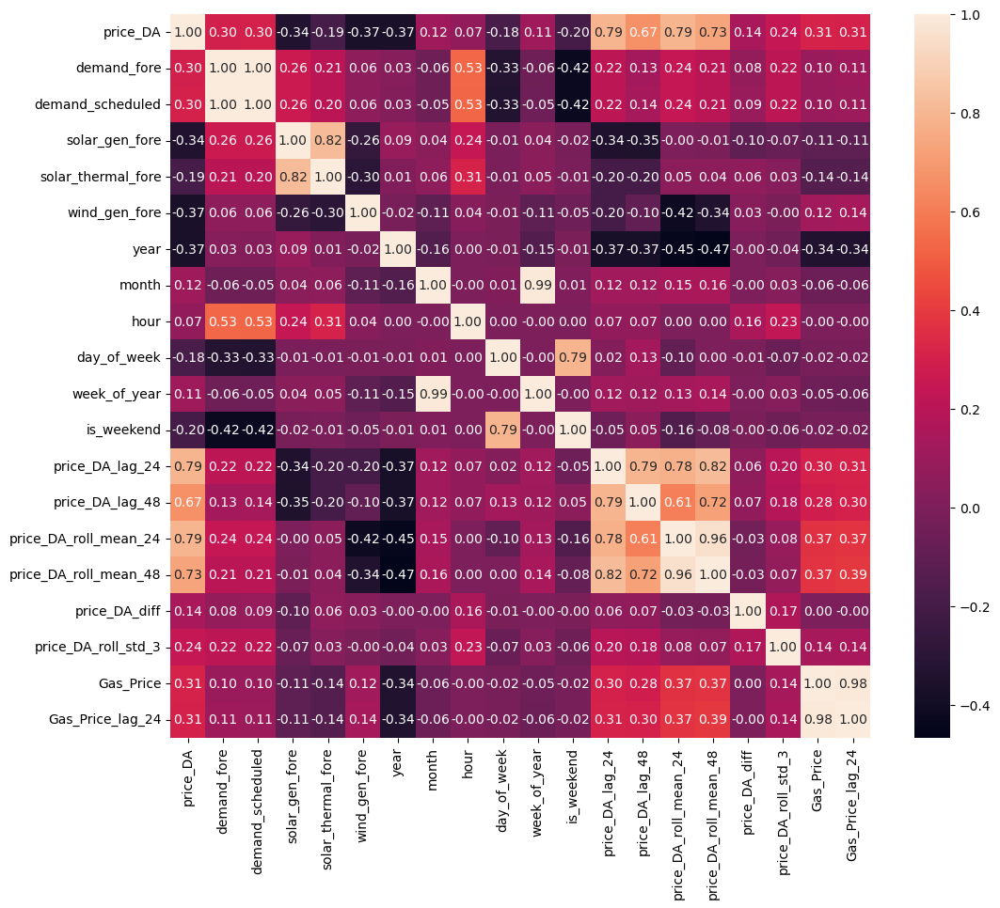

In [71]:
# Calculation of correlation coefficients
corr = dataset_after_feature_selection_w_gas.iloc[:,0:].corr(method='pearson')  # method{‘pearson’, ‘kendall’, ‘spearman’} 

# Plot Heat Map,
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt=".2f")
plt.show()

Some correlation is present, prices will be lagged in 1 day and check again, as we won't have this information in real time. 

In [72]:
# lagged features
lagged_columns = ['Gas_Price']
dataset_after_feature_selection_w_gas = create_lagged_features(dataset_after_feature_selection_w_gas, lagged_columns, lags=[24])
dataset_after_feature_selection_w_gas

C:\Users\andre\AppData\Local\Temp\ipykernel_10796\4234633912.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,price_DA,demand_fore,demand_scheduled,solar_gen_fore,solar_thermal_fore,wind_gen_fore,year,month,hour,day_of_week,week_of_year,is_weekend,price_DA_lag_24,price_DA_lag_48,price_DA_roll_mean_24,price_DA_roll_mean_48,price_DA_diff,price_DA_roll_std_3,Gas_Price,Gas_Price_lag_24
2023-01-01 00:00:00,0.00,20042.250000,20060.75,3.625,3.625,8124.00,2023,1,0,6,52,1,NaN,NaN,0.000000,0.000000,NaN,NaN,54.00,NaN
2023-01-01 01:00:00,0.00,19383.750000,19241.00,2.325,2.325,7173.75,2023,1,1,6,52,1,NaN,NaN,0.000000,0.000000,0.00,0.000000,54.00,NaN
2023-01-01 02:00:00,0.00,18216.083333,18151.75,0.900,0.900,6380.75,2023,1,2,6,52,1,NaN,NaN,0.000000,0.000000,0.00,0.000000,54.00,NaN
2023-01-01 03:00:00,0.00,17126.666667,17043.50,0.575,0.575,6469.25,2023,1,3,6,52,1,NaN,NaN,0.000000,0.000000,0.00,0.000000,54.00,NaN
2023-01-01 04:00:00,0.00,16551.666667,16469.25,0.600,0.600,7175.50,2023,1,4,6,52,1,NaN,NaN,0.000000,0.000000,0.00,0.000000,54.00,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-31 19:00:00,135.01,30143.666667,29705.50,82.550,82.550,3972.75,2024,10,19,3,44,0,143.36,93.34,99.792083,89.002708,0.87,2.676957,41.72,43.04
2024-10-31 20:00:00,148.72,29875.750000,29545.50,94.400,94.400,4615.25,2024,10,20,3,44,0,143.36,98.61,100.015417,90.046667,13.71,8.178197,41.72,43.04
2024-10-31 21:00:00,134.34,29014.000000,28285.50,97.750,97.750,4913.00,2024,10,21,3,44,0,132.33,90.00,100.099167,90.970417,-14.38,8.115801,41.72,43.04
2024-10-31 22:00:00,115.20,26512.166667,25917.00,64.150,64.150,4820.25,2024,10,22,3,44,0,99.80,83.22,100.740833,91.636667,-19.14,16.816234,41.72,43.04


In [73]:
dataset_after_feature_selection_w_gas = dataset_after_feature_selection_w_gas.dropna()
dataset_after_feature_selection_w_gas

,price_DA,demand_fore,demand_scheduled,solar_gen_fore,solar_thermal_fore,wind_gen_fore,year,month,hour,day_of_week,week_of_year,is_weekend,price_DA_lag_24,price_DA_lag_48,price_DA_roll_mean_24,price_DA_roll_mean_48,price_DA_diff,price_DA_roll_std_3,Gas_Price,Gas_Price_lag_24
2023-01-03 00:00:00,130.01,22857.833333,22678.5,0.000,0.000,2918.50,2023,1,0,1,1,0,61.38,0.00,115.409583,62.332083,5.79,5.351171,59.98,54.00
2023-01-03 01:00:00,120.00,21250.333333,21045.5,0.000,0.000,3051.00,2023,1,1,1,1,0,42.17,0.00,118.652500,64.832083,-10.01,5.025478,59.98,54.00
2023-01-03 02:00:00,118.76,20168.666667,20150.5,0.000,0.000,3333.75,2023,1,2,1,1,0,42.00,0.00,121.850833,67.306250,-1.24,6.168471,59.98,54.00
2023-01-03 03:00:00,115.00,19695.000000,19582.0,0.075,0.075,3500.50,2023,1,3,1,1,0,42.07,0.00,124.889583,69.702083,-3.76,2.603690,59.98,54.00
2023-01-03 04:00:00,113.63,19558.833333,19574.0,0.000,0.000,3402.00,2023,1,4,1,1,0,42.17,0.00,127.867083,72.069375,-1.37,2.656169,59.98,54.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-31 19:00:00,135.01,30143.666667,29705.5,82.550,82.550,3972.75,2024,10,19,3,44,0,143.36,93.34,99.792083,89.002708,0.87,2.676957,41.72,43.04
2024-10-31 20:00:00,148.72,29875.750000,29545.5,94.400,94.400,4615.25,2024,10,20,3,44,0,143.36,98.61,100.015417,90.046667,13.71,8.178197,41.72,43.04
2024-10-31 21:00:00,134.34,29014.000000,28285.5,97.750,97.750,4913.00,2024,10,21,3,44,0,132.33,90.00,100.099167,90.970417,-14.38,8.115801,41.72,43.04
2024-10-31 22:00:00,115.20,26512.166667,25917.0,64.150,64.150,4820.25,2024,10,22,3,44,0,99.80,83.22,100.740833,91.636667,-19.14,16.816234,41.72,43.04


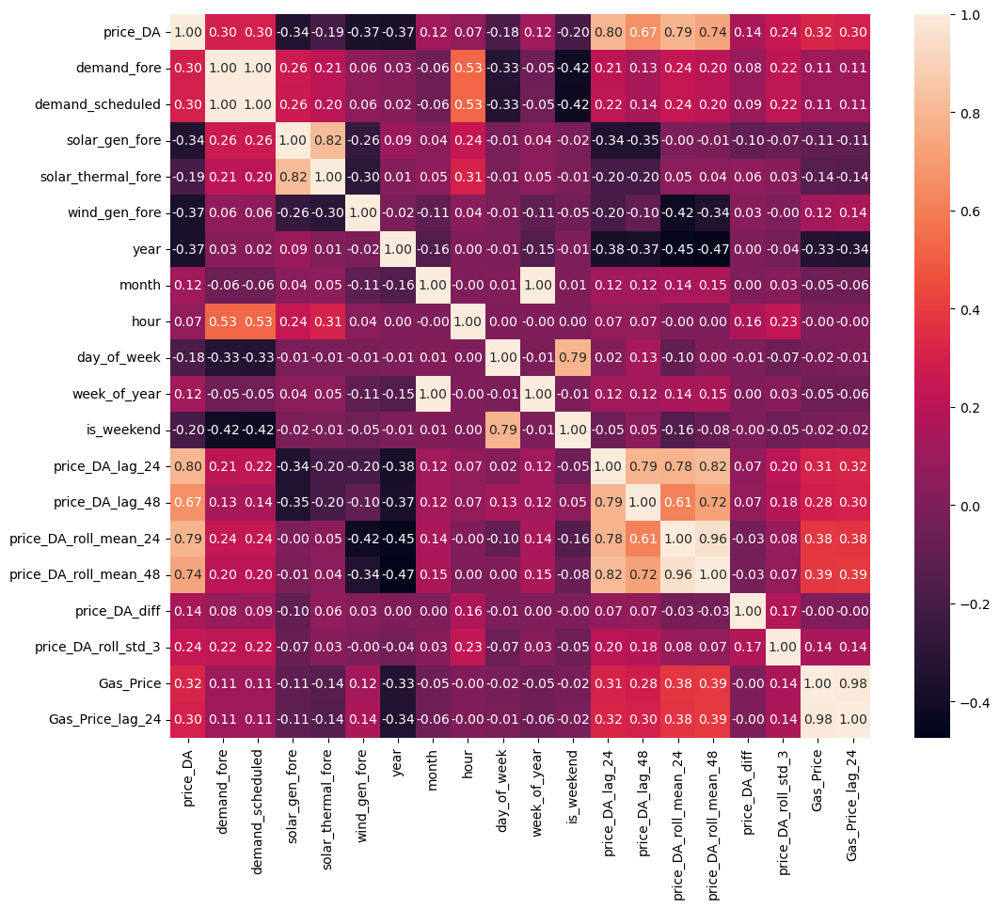

In [74]:
# Calculation of correlation coefficients
corr = dataset_after_feature_selection_w_gas.iloc[:,0:].corr(method='pearson')  # method{‘pearson’, ‘kendall’, ‘spearman’} 

# Plot Heat Map,
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt=".2f")
plt.show()

Correlation remains, lets drop Gas_Price column as we cannot use it in practice (data available for the time of the prediction of prices will be the lagged value of the day before)

In [75]:
dataset_after_feature_selection_w_gas = dataset_after_feature_selection_w_gas.drop(columns=['Gas_Price'])
dataset_after_feature_selection_w_gas

,price_DA,demand_fore,demand_scheduled,solar_gen_fore,solar_thermal_fore,wind_gen_fore,year,month,hour,day_of_week,week_of_year,is_weekend,price_DA_lag_24,price_DA_lag_48,price_DA_roll_mean_24,price_DA_roll_mean_48,price_DA_diff,price_DA_roll_std_3,Gas_Price_lag_24
2023-01-03 00:00:00,130.01,22857.833333,22678.5,0.000,0.000,2918.50,2023,1,0,1,1,0,61.38,0.00,115.409583,62.332083,5.79,5.351171,54.00
2023-01-03 01:00:00,120.00,21250.333333,21045.5,0.000,0.000,3051.00,2023,1,1,1,1,0,42.17,0.00,118.652500,64.832083,-10.01,5.025478,54.00
2023-01-03 02:00:00,118.76,20168.666667,20150.5,0.000,0.000,3333.75,2023,1,2,1,1,0,42.00,0.00,121.850833,67.306250,-1.24,6.168471,54.00
2023-01-03 03:00:00,115.00,19695.000000,19582.0,0.075,0.075,3500.50,2023,1,3,1,1,0,42.07,0.00,124.889583,69.702083,-3.76,2.603690,54.00
2023-01-03 04:00:00,113.63,19558.833333,19574.0,0.000,0.000,3402.00,2023,1,4,1,1,0,42.17,0.00,127.867083,72.069375,-1.37,2.656169,54.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-31 19:00:00,135.01,30143.666667,29705.5,82.550,82.550,3972.75,2024,10,19,3,44,0,143.36,93.34,99.792083,89.002708,0.87,2.676957,43.04
2024-10-31 20:00:00,148.72,29875.750000,29545.5,94.400,94.400,4615.25,2024,10,20,3,44,0,143.36,98.61,100.015417,90.046667,13.71,8.178197,43.04
2024-10-31 21:00:00,134.34,29014.000000,28285.5,97.750,97.750,4913.00,2024,10,21,3,44,0,132.33,90.00,100.099167,90.970417,-14.38,8.115801,43.04
2024-10-31 22:00:00,115.20,26512.166667,25917.0,64.150,64.150,4820.25,2024,10,22,3,44,0,99.80,83.22,100.740833,91.636667,-19.14,16.816234,43.04


### Shortening time horizon
We'll shorten the time horizon and check for any improvements of the model. This is based on the assumption that the profile of the prices each year is quite different (see graphs above in the data exploration part). 1 year of data will be kept, assuming that prices are seasonal, therefore we'll keep prices from Nov-2023 to Oct-2024.

In [76]:
start_date = '2023-11-01 00:00:00'
end_date = '2024-10-31 23:00:00'

dataset_after_feature_selection_v2 = dataset_after_feature_selection_w_gas.loc[start_date:end_date,:]
dataset_after_feature_selection_v2

,price_DA,demand_fore,demand_scheduled,solar_gen_fore,solar_thermal_fore,wind_gen_fore,year,month,hour,day_of_week,week_of_year,is_weekend,price_DA_lag_24,price_DA_lag_48,price_DA_roll_mean_24,price_DA_roll_mean_48,price_DA_diff,price_DA_roll_std_3,Gas_Price_lag_24
2023-11-01 00:00:00,16.75,22777.416667,22703.75,8.275,8.275,10025.50,2023,11,0,2,44,0,61.60,8.00,103.055833,70.142500,-54.81,40.159333,45.89
2023-11-01 01:00:00,12.52,21705.166667,21753.50,6.150,6.150,10361.00,2023,11,1,2,44,0,60.00,8.20,101.077500,70.232500,-4.23,32.933647,45.89
2023-11-01 02:00:00,4.99,20845.000000,20658.00,6.100,6.100,10597.25,2023,11,2,2,44,0,64.00,7.57,98.618750,70.178750,-7.53,5.956669,45.89
2023-11-01 03:00:00,4.30,20283.500000,20297.00,7.150,7.150,11255.00,2023,11,3,2,44,0,64.80,5.20,96.097917,70.160000,-0.69,4.559704,45.89
2023-11-01 04:00:00,4.30,19968.833333,19979.50,6.650,6.650,11661.00,2023,11,4,2,44,0,65.50,5.00,93.547917,70.145417,0.00,0.398372,45.89
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-31 19:00:00,135.01,30143.666667,29705.50,82.550,82.550,3972.75,2024,10,19,3,44,0,143.36,93.34,99.792083,89.002708,0.87,2.676957,43.04
2024-10-31 20:00:00,148.72,29875.750000,29545.50,94.400,94.400,4615.25,2024,10,20,3,44,0,143.36,98.61,100.015417,90.046667,13.71,8.178197,43.04
2024-10-31 21:00:00,134.34,29014.000000,28285.50,97.750,97.750,4913.00,2024,10,21,3,44,0,132.33,90.00,100.099167,90.970417,-14.38,8.115801,43.04
2024-10-31 22:00:00,115.20,26512.166667,25917.00,64.150,64.150,4820.25,2024,10,22,3,44,0,99.80,83.22,100.740833,91.636667,-19.14,16.816234,43.04


Let's check one more time for the correlations

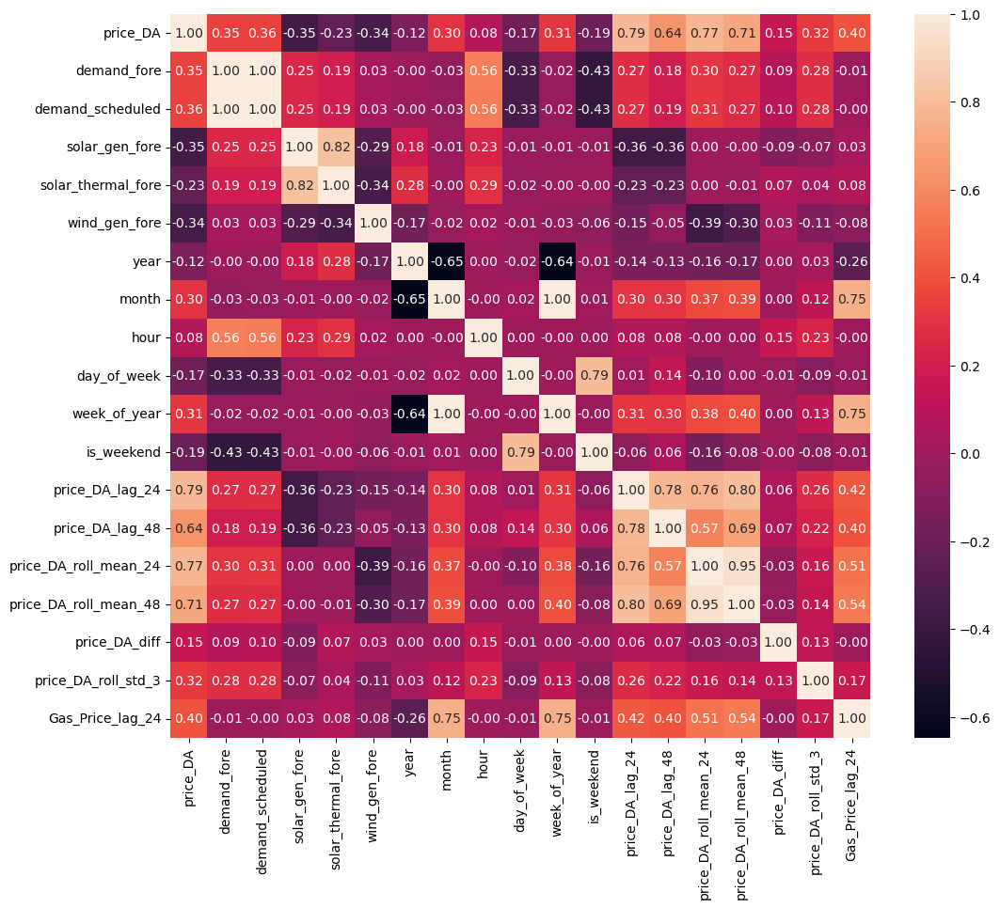

In [78]:
# Calculation of correlation coefficients
corr = dataset_after_feature_selection_v2.iloc[:,0:].corr(method='pearson')  # method{‘pearson’, ‘kendall’, ‘spearman’} 

# Plot Heat Map,
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt=".2f")
plt.show()

Some correlations improve, such as the one with gas or demand. Also the correlations with solar and wind improve (they decrease but get more negative as they are inversely correlated). Let's build the model again and check the results. 


## Splitting the data into training, validation, and test data

In [80]:
# Features X ; Target y 
X2 = dataset_after_feature_selection_v2.drop(['price_DA'], axis=1) 
y2 = dataset_after_feature_selection_v2['price_DA']

In [81]:
from sklearn.model_selection import train_test_split

test_size = 0.20

# Dividing the data into training, validation and test data.
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=test_size,
                                                    shuffle=False)

X_train2, X_val2, y_train2, y_val2 = train_test_split(X_train2, y_train2, test_size=test_size,
                                                    shuffle=False)

In [82]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the scaler on the training data
X_train_scaled2 = scaler.fit_transform(X_train2)

# Use the same scaler to transform the validation and test data (do not fit again)
X_val_scaled2 = scaler.transform(X_val2)
X_test_scaled2 = scaler.transform(X_test2)

## Building model again

In [79]:
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, ElasticNet
from xgboost import XGBRegressor


# Define the number of folds and error metrics
num_folds = 5
error_metrics = {'neg_root_mean_squared_error', 'r2'}


# Define a dictionary with models
models = {
    ('MLP', MLPRegressor()),
    ('RFR', RandomForestRegressor()),
    ('SVR', SVR()),
    ('AdaB', AdaBoostRegressor()),
    ('GBR', GradientBoostingRegressor()),  # Gradient Boosting Regressor
    ('DTR', DecisionTreeRegressor()),  # Decision Tree Regressor
    ('XGB', XGBRegressor()),  # XGBoost Regressor
    ('LR', LinearRegression()),  # Linear Regression
    ('EN', ElasticNet())  # ElasticNet Regressor
}


In [84]:
import numpy as np
print("Number of NaN values in X_train_scaled:", np.isnan(X_train_scaled2).sum())
print("Number of NaN values in y_train:", np.isnan(y_train2).sum())

Number of NaN values in X_train_scaled: 0
Number of NaN values in y_train: 0


####### Evaluation metric:  neg_root_mean_squared_error

Training model: MLP with neg_root_mean_squared_error...
Performing TimeSeriesSplit with 5 folds...
Model: MLP, neg_root_mean_squared_error Mean: -16.0810, Std: 2.7420


Training model: LR with neg_root_mean_squared_error...
Performing TimeSeriesSplit with 5 folds...
Model: LR, neg_root_mean_squared_error Mean: -19.9741, Std: 9.6927


Training model: SVR with neg_root_mean_squared_error...
Performing TimeSeriesSplit with 5 folds...
Model: SVR, neg_root_mean_squared_error Mean: -18.6447, Std: 3.0838


Training model: GBR with neg_root_mean_squared_error...
Performing TimeSeriesSplit with 5 folds...
Model: GBR, neg_root_mean_squared_error Mean: -16.1208, Std: 3.4714


Training model: AdaB with neg_root_mean_squared_error...
Performing TimeSeriesSplit with 5 folds...
Model: AdaB, neg_root_mean_squared_error Mean: -21.7813, Std: 5.5098


Training model: DTR with neg_root_mean_squared_error...
Performing TimeSeriesSplit with 5 folds...

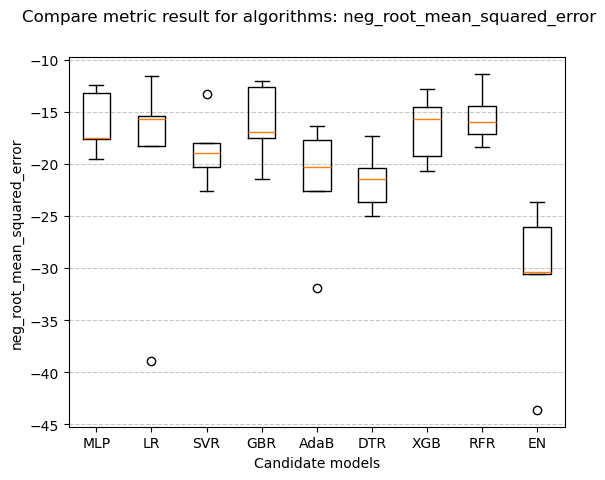

####### Evaluation metric:  r2

Training model: MLP with r2...
Performing TimeSeriesSplit with 5 folds...
Model: MLP, r2 Mean: 0.6779, Std: 0.1014


Training model: LR with r2...
Performing TimeSeriesSplit with 5 folds...
Model: LR, r2 Mean: 0.4097, Std: 0.6014


Training model: SVR with r2...
Performing TimeSeriesSplit with 5 folds...
Model: SVR, r2 Mean: 0.5711, Std: 0.1275


Training model: GBR with r2...
Performing TimeSeriesSplit with 5 folds...
Model: GBR, r2 Mean: 0.6625, Std: 0.1661


Training model: AdaB with r2...
Performing TimeSeriesSplit with 5 folds...
Model: AdaB, r2 Mean: 0.3514, Std: 0.4278


Training model: DTR with r2...
Performing TimeSeriesSplit with 5 folds...
Model: DTR, r2 Mean: 0.4035, Std: 0.1025


Training model: XGB with r2...
Performing TimeSeriesSplit with 5 folds...
Model: XGB, r2 Mean: 0.6467, Std: 0.1485


Training model: RFR with r2...
Performing TimeSeriesSplit with 5 folds...
Model: RFR, r2 Mean: 0.7076, Std: 0.0684


Training model: EN with r2...
Pe

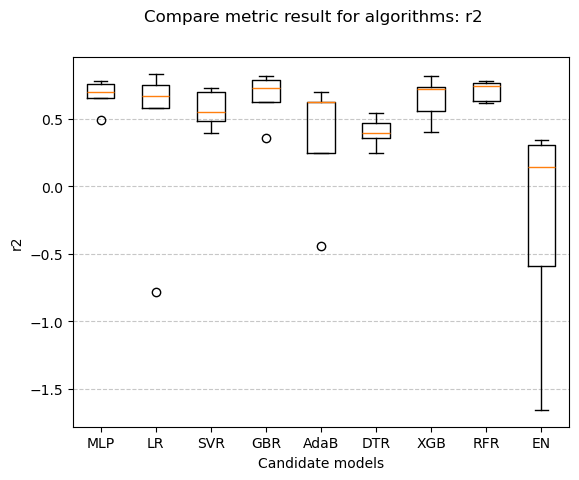

In [85]:
from sklearn.model_selection import TimeSeriesSplit, cross_val_score, GridSearchCV
import warnings
from sklearn.exceptions import ConvergenceWarning
# Suppress specific warnings from sklearn (like ConvergenceWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)


# Cross-validation training
for scoring in error_metrics:
    results = [] # store metrics results
    msg = []  # print summary of result
    names = []  # store name of the models
    print('####### Evaluation metric: ', scoring)
    
    for name, model in models:
        print(f'\nTraining model: {name} with {scoring}...')
        cross_validation = TimeSeriesSplit(n_splits=num_folds)
        
        # Start the cross-validation process and print verbose output
        print(f"Performing TimeSeriesSplit with {num_folds} folds...") 
        
        cv_results = cross_val_score(model, X_train_scaled2, y_train2, cv=cross_validation, scoring=scoring)
        
        print(f"Model: {name}, {scoring} Mean: {cv_results.mean():.4f}, Std: {cv_results.std():.4f}\n")

        results.append(cv_results)
        names.append(name)
        resume = (name, cv_results.mean(), cv_results.std())
        msg.append(resume)
    

    # Compare results between algorithms
    fig = plt.figure()
    fig.suptitle('Compare metric result for algorithms: %s' %scoring)
    ax = fig.add_subplot(111)
    ax.set_xlabel('Candidate models')
    ax.set_ylabel('%s' %scoring)
    plt.boxplot(results)
    ax.set_xticklabels(names)
    # Show a grid for better readability
    ax.grid(True, axis='y', linestyle='--', alpha=0.7)
    plt.show()

    results = []

## Hyperparametrization

GBR looks like the best model again, let's perform its hyperparametrization. 

In [86]:
#model = AdaBoostRegressor()
#model = MLPRegressor()
#model = XGBRegressor()
#model = DecisionTreeRegressor()
#model = SVR()
#model = ElasticNet()
#model = RandomForestRegressor()
#model = LinearRegression()
model = GradientBoostingRegressor()


scoring= 'r2'
params = {
    # Number of trees in random forest
    'n_estimators': [100, 500],  # default=100
    'learning_rate': [0.1, 0.2, 0.3, 0.4],
    'loss': ['quantile', 'squared_error', 'absolute_error'], # Default: Squared Error
     # Maximum number of levels in tree
   #  'max_depth': [2, None],  #deafult = None
     # Method of selecting samples for training each tree
}


# Search for the best combination of hyperparameters
cross_validation = TimeSeriesSplit(n_splits=5)
my_cv = cross_validation.split(X_val_scaled2)
gsearch = GridSearchCV(estimator=model, param_grid=params, scoring=scoring, cv=my_cv, verbose=3)
gsearch.fit(X_val_scaled2, y_val2)

# Print best Result
print("Best result: %f using the following hyperparameters %s" % (gsearch.best_score_, gsearch.best_params_))
means = gsearch.cv_results_['mean_test_score']
stds = gsearch.cv_results_['std_test_score']
params = gsearch.cv_results_['params']

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.1, loss=quantile, n_estimators=100;, score=0.516 total time=   0.8s
[CV 2/5] END learning_rate=0.1, loss=quantile, n_estimators=100;, score=0.521 total time=   1.2s
[CV 3/5] END learning_rate=0.1, loss=quantile, n_estimators=100;, score=0.705 total time=   2.8s
[CV 4/5] END learning_rate=0.1, loss=quantile, n_estimators=100;, score=0.690 total time=   3.7s
[CV 5/5] END learning_rate=0.1, loss=quantile, n_estimators=100;, score=0.478 total time=   4.0s
[CV 1/5] END learning_rate=0.1, loss=quantile, n_estimators=500;, score=0.537 total time=   4.6s
[CV 2/5] END learning_rate=0.1, loss=quantile, n_estimators=500;, score=0.665 total time=   7.3s
[CV 3/5] END learning_rate=0.1, loss=quantile, n_estimators=500;, score=0.788 total time=  11.1s
[CV 4/5] END learning_rate=0.1, loss=quantile, n_estimators=500;, score=0.747 total time=  25.8s
[CV 5/5] END learning_rate=0.1, loss=quantile, n_estimators=500;,

## Final evaluation

We'll assume same hyperparametrization and model selection for simplicity. 

In [87]:
final_model_v2 = GradientBoostingRegressor(n_estimators=500, max_depth=None, learning_rate=0.1, loss='absolute_error') # Training with best hyperparameters
final_model_v2.fit(X_train_scaled2,y_train2)  # Training the model
y_predict_v2 = final_model_v2.predict(X_test_scaled2)  # Making a prediction on the test data

In [88]:
from sklearn.metrics import r2_score, mean_squared_error

# Calculate R² (R-squared) score
r2_2 = r2_score(y_test2, y_predict_v2)

# Calculate RMSE (Root Mean Squared Error)
rmse_2 = mean_squared_error(y_test2, y_predict_v2, squared=False)

# Print both the R² and RMSE scores
print(f"R² Score: {r2_2:.4f}")
print(f"RMSE: {rmse_2:.4f}")

R² Score: 0.7968
RMSE: 18.2319


In [89]:
import plotly.graph_objects as go

# Create the figure
fig = go.Figure()

# Add the trace for the actual consumption (True Values)
fig.add_trace(go.Scatter(x=y_test2.index, y=y_test2, mode='lines', name='True Values',
                         line=dict(color='blue', width=2)))

# Add the trace for the predicted consumption (Predicted Values)
fig.add_trace(go.Scatter(x=y_test2.index, y=y_predict_v2, mode='lines', name='Predicted Values V1',
                         line=dict(color='red', width=2, dash='dot')))  # 'dot' for less separated dashes


# Update layout for a more beautiful plot
fig.update_layout(
    title='True vs Predicted Day-Ahead Price',
    xaxis_title='Date/Time',
    yaxis_title='Day-Ahead Price (EUR/MWh)',
    template='plotly',  # dark theme, can change to 'plotly' for light theme
    hovermode='x unified',  # hover over to show values for both lines at a time
    legend=dict(
        x=0.01, y=0.99,  # position of legend
        traceorder='normal',
        font=dict(family="Arial", size=12, color="white"),
        bgcolor='rgba(0, 0, 0, 0.3)',
        bordercolor='white',
        borderwidth=1
    ),
   
   
)

# Show the plot
fig.show()

# Task 3: Clustering

We'll use the reduced dataset for the historical electricity prices dataset, meaning data from 2023 and 2024. 

In [90]:
df_prices = dataset_after_feature_selection_v2[['price_DA']]

In [91]:
df_prices.head()

,price_DA
2023-11-01 00:00:00,16.75
2023-11-01 01:00:00,12.52
2023-11-01 02:00:00,4.99
2023-11-01 03:00:00,4.30
2023-11-01 04:00:00,4.30


In [92]:
df_prices.describe()

,price_DA
count,8783.000000
mean,56.369759
std,41.228329
min,-2.000000
25%,14.100000
50%,58.000000
75%,90.265000
max,181.260000


## Data preparation
Transform the data to have 1 row per day

In [93]:
# Create a new column with the hour
df_prices['hour'] = df_prices.index.hour
df_prices

C:\Users\andre\AppData\Local\Temp\ipykernel_10796\602983555.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,price_DA,hour
2023-11-01 00:00:00,16.75,0
2023-11-01 01:00:00,12.52,1
2023-11-01 02:00:00,4.99,2
2023-11-01 03:00:00,4.30,3
2023-11-01 04:00:00,4.30,4
...,...,...
2024-10-31 19:00:00,135.01,19
2024-10-31 20:00:00,148.72,20
2024-10-31 21:00:00,134.34,21
2024-10-31 22:00:00,115.20,22


In [94]:
# The new index now contains only the date (DD/MM/YYYYYY).
df_prices.index = df_prices.index.date

In [95]:
# Create a column with the average hourly power of each hour 
df_prices_pivot = df_prices.pivot(columns='hour')
df_prices_pivot = df_prices_pivot.dropna()

df_prices_pivot.head()

price_DA                                                       ...  \
hour             0      1     2     3     4    5    6    7      8     9   ...   
2023-11-01    16.75  12.52  4.99  4.30  4.30  4.3  4.3  4.3   4.30  3.10  ...   
2023-11-02     4.30   4.30  0.77  0.06  0.09  1.6  4.3  5.0  10.00  4.55  ...   
2023-11-03     3.10   1.50  0.19  0.02  0.00  0.1  4.1  4.3   4.30  4.30  ...   
2023-11-04     4.30   2.00  1.20  1.62  1.19  1.0  1.5  1.4   1.68  2.00  ...   
2023-11-05     0.09   0.00  0.00  0.00  0.00  0.0  0.0  0.0   0.00  0.00  ...   

                                                                               
hour          14    15    16     17     18     19     20     21     22     23  
2023-11-01  0.10  0.01  1.62   4.30   4.30   4.30   7.87  11.56   4.55   4.30  
2023-11-02  4.30  3.80  4.30   4.30   4.50  10.00  10.00   4.55   4.30   3.80  
2023-11-03  3.00  4.10  4.30  12.56  12.82  12.82  15.50  14.54  14.54  10.00  
2023-11-04  0.02  0.00  0.02   0.15   2.00   4.30   4.30   4.30   1.30   0.00  
2023-11-05  0.00  0.00  0.00   2.00   7.41  22.00  24.80  25.02  22.86  16.42  

[5 rows x 24 columns]

### Plot the transformed data
Each line shows the hourly consumption for one day of the year. 

<Axes: title={'center': 'Daily Consumption'}, xlabel='None,hour'>

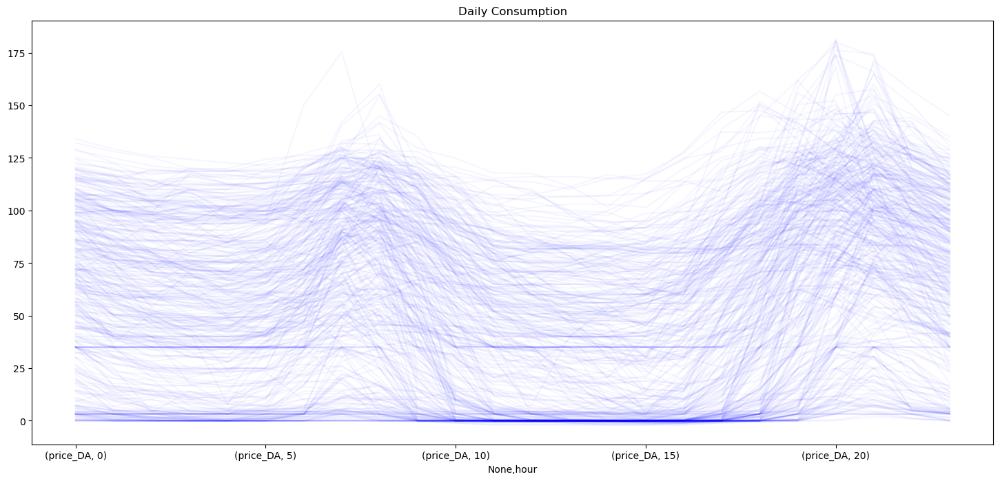

In [96]:
# Hourly consumption. Dataframe has to be transposed.
df_prices_pivot.T.plot(figsize=(18, 8), title='Daily Consumption', legend=False, color='blue', alpha=0.04)

**2. Transformation**. 

The data is scaled using the *MinMaxScaler()* method

In [97]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X = df_prices_pivot.values.copy()
X_scale = pd.DataFrame(scaler.fit_transform(X))
X_scale.head()

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
0,0.124981,0.096934,0.039628,0.034594,0.035051,0.034577,0.028667,0.024494,0.026858,0.027389,...,0.017628,0.016844,0.027846,0.035862,0.032508,0.026545,0.043313,0.055420,0.022756,0.029655
1,0.032085,0.033292,0.006115,0.000483,0.000734,0.012866,0.028667,0.028482,0.062461,0.038065,...,0.052883,0.048605,0.048462,0.035862,0.033778,0.061732,0.055065,0.014783,0.021154,0.026207
2,0.023131,0.011614,0.001509,0.000161,0.000000,0.000804,0.027333,0.024494,0.026858,0.036224,...,0.041971,0.051119,0.048462,0.091752,0.086603,0.079141,0.085412,0.072696,0.086795,0.068966
3,0.032085,0.015485,0.009530,0.013033,0.009700,0.008041,0.010000,0.007975,0.010493,0.019290,...,0.016956,0.016760,0.015538,0.007781,0.017905,0.026545,0.023615,0.013333,0.001923,0.000000
4,0.000672,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.004565,...,0.016788,0.016760,0.015385,0.020299,0.052254,0.135811,0.136725,0.133449,0.140128,0.113241


## Unsupervised Learning Model Building 1: Data Clustering using K-means

In [98]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

silhouette_scores = []
wcss = []

# Evaluate the K-means algorithm for a range of [2,15] clusters. 
n_cluster_list = np.arange(2, 16).astype(int)

In [99]:
# Iteration to evaluate K-means for different number of clusters (n_clusters)

for n_cluster in n_cluster_list:
    kmeans = KMeans(n_clusters=n_cluster, random_state=0)
    cluster_found = kmeans.fit_predict(X_scale)
    wcss.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_scale, kmeans.labels_, random_state=0))

### Optimal number of clusters: Silhouette Coefficient
The Silhouette Coefficient is used, where the best value is 1 and the worst value is -1. Values close to 0 indicate overlapping clusters. Negative values generally indicate that a sample has been assigned to the wrong cluster, since a different cluster is more similar. 

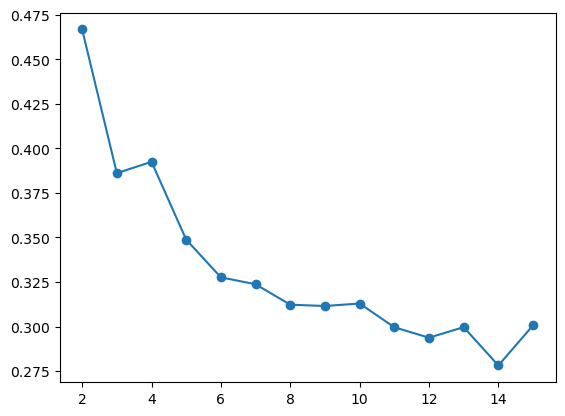

In [100]:
silhouette_metric = pd.DataFrame(index=n_cluster_list, columns=['silhouette_score'], data=silhouette_scores)
plt.plot(silhouette_metric, marker='o') 

### Optimal number of clusters: Elbow Method

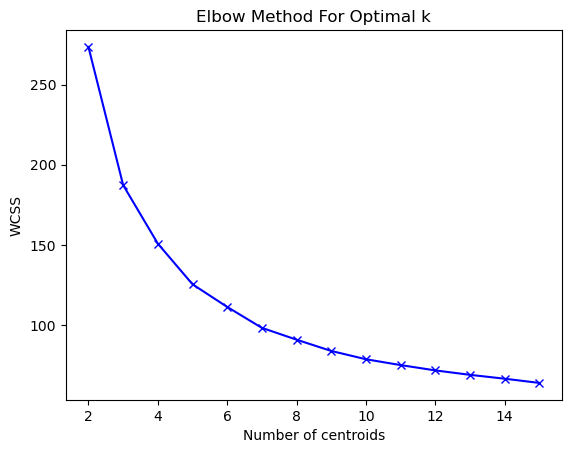

In [101]:
plt.plot(n_cluster_list, wcss, 'bx-')
plt.xlabel('Number of centroids')
plt.ylabel('WCSS')
plt.title('Elbow Method For Optimal k')
plt.show()

In [104]:
# Train the K-means for k=2, given the result of the Silhouette method.
kmeans = KMeans(n_clusters=2)
cluster_found = kmeans.fit_predict(X)
cluster_found_sr = pd.Series(cluster_found, name='cluster K-means')

# Create a multindex of the type: (date,cluster to which the day belongs)
df_prices_pivot = df_prices_pivot.set_index(cluster_found_sr, append=True)
df_prices_pivot.index

MultiIndex([(2023-11-01, 1),
            (2023-11-02, 1),
            (2023-11-03, 1),
            (2023-11-04, 1),
            (2023-11-05, 1),
            (2023-11-06, 0),
            (2023-11-07, 0),
            (2023-11-08, 0),
            (2023-11-09, 0),
            (2023-11-10, 1),
            ...
            (2024-10-22, 0),
            (2024-10-23, 0),
            (2024-10-24, 0),
            (2024-10-25, 0),
            (2024-10-26, 1),
            (2024-10-27, 0),
            (2024-10-28, 0),
            (2024-10-29, 0),
            (2024-10-30, 0),
            (2024-10-31, 0)],
           names=[None, 'cluster K-means'], length=365)

[0, 1]


Text(0.5, 0, 'Hours')

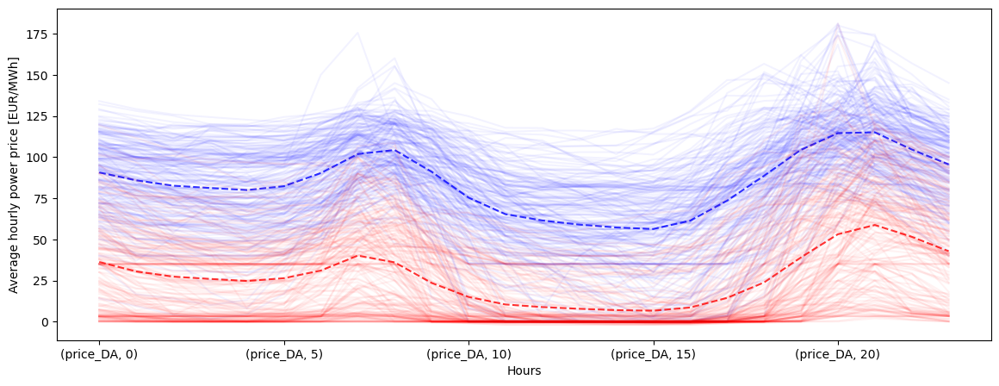

In [105]:
fig, ax = plt.subplots(1, 1, figsize=(14,5))
color_list = ['blue',  'red']
cluster_values = sorted(df_prices_pivot.index.get_level_values('cluster K-means').unique())
print(cluster_values)

for cluster, color in zip(cluster_values, color_list):
    # plot every line of both clusters
    df_prices_pivot.xs(cluster, level=1).T.plot(ax=ax, legend=False, alpha=0.05, color=color)
    # plot the mean consumption of each cluster
    df_prices_pivot.xs(cluster, level=1).mean().plot(ax=ax, color=color, legend=False, alpha=0.8, ls='--')

ax.set_ylabel('Average hourly power price [EUR/MWh]')
ax.set_xlabel('Hours')

In [106]:
df_prices_pivot

price_DA                                           \
hour                             0      1      2      3      4     5      6    
           cluster K-means                                                     
2023-11-01 1                  16.75  12.52   4.99   4.30   4.30   4.3   4.30   
2023-11-02 1                   4.30   4.30   0.77   0.06   0.09   1.6   4.30   
2023-11-03 1                   3.10   1.50   0.19   0.02   0.00   0.1   4.10   
2023-11-04 1                   4.30   2.00   1.20   1.62   1.19   1.0   1.50   
2023-11-05 1                   0.09   0.00   0.00   0.00   0.00   0.0   0.00   
...                             ...    ...    ...    ...    ...   ...    ...   
2024-10-27 0                  87.71  83.31  80.68  81.30  80.68  70.0  80.00   
2024-10-28 0                  60.61  50.31  49.00  43.10  43.92  49.2  65.78   
2024-10-29 0                  70.00  65.14  56.21  49.28  49.04  58.4  70.84   
2024-10-30 0                  66.00  55.00  52.99  44.60  40.00  52.5  68.68   
2024-10-31 0                  80.00  76.79  75.00  72.59  70.99  77.0  88.39   

                                                    ...                        \
hour                            7       8       9   ...     14     15      16   
           cluster K-means                          ...                         
2023-11-01 1                  4.30    4.30    3.10  ...   0.10   0.01    1.62   
2023-11-02 1                  5.00   10.00    4.55  ...   4.30   3.80    4.30   
2023-11-03 1                  4.30    4.30    4.30  ...   3.00   4.10    4.30   
2023-11-04 1                  1.40    1.68    2.00  ...   0.02   0.00    0.02   
2023-11-05 1                  0.00    0.00    0.00  ...   0.00   0.00    0.00   
...                            ...     ...     ...  ...    ...    ...     ...   
2024-10-27 0                 86.24   81.30   64.36  ...  55.19  44.99   63.97   
2024-10-28 0                 86.74   98.94   68.39  ...  51.97  52.51   84.89   
2024-10-29 0                 83.09   91.36   72.40  ...  70.84  71.10   73.61   
2024-10-30 0                 76.04   90.25   85.00  ...  69.57  72.65   86.81   
2024-10-31 0                117.05  121.58  102.80  ...  85.51  95.50  113.00   

                                                                            \
hour                            17      18      19      20      21      22   
           cluster K-means                                                   
2023-11-01 1                  4.30    4.30    4.30    7.87   11.56    4.55   
2023-11-02 1                  4.30    4.50   10.00   10.00    4.55    4.30   
2023-11-03 1                 12.56   12.82   12.82   15.50   14.54   14.54   
2023-11-04 1                  0.15    2.00    4.30    4.30    4.30    1.30   
2023-11-05 1                  2.00    7.41   22.00   24.80   25.02   22.86   
...                            ...     ...     ...     ...     ...     ...   
2024-10-27 0                 81.25   96.27  128.70  115.51  107.36   90.58   
2024-10-28 0                115.57  149.48  133.66  115.73  110.49   98.61   
2024-10-29 0                 74.70   85.00   93.34   98.61   90.00   83.22   
2024-10-30 0                102.30  145.00  143.36  143.36  132.33   99.80   
2024-10-31 0                130.00  134.14  135.01  148.72  134.34  115.20   

                                    
hour                            23  
           cluster K-means          
2023-11-01 1                  4.30  
2023-11-02 1                  3.80  
2023-11-03 1                 10.00  
2023-11-04 1                  0.00  
2023-11-05 1                 16.42  
...                            ...  
2024-10-27 0                102.99  
2024-10-28 0                 81.25  
2024-10-29 0                 68.70  
2024-10-30 0                 91.71  
2024-10-31 0                102.00  

[365 rows x 24 columns]

## Unsupervised Learning Model Building 2: Data Clustering using Hierarchical Clustering

In [107]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler


# Step 2: Apply Agglomerative Clustering (Hierarchical Clustering)
agg_clustering = AgglomerativeClustering()  # You can adjust the number of clusters as needed -- n_clusters=2
y_hierarchical = agg_clustering.fit_predict(df_prices_pivot)


In [108]:
y_hierarchical

array([1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,

In [109]:
cluster_found_hr = pd.Series(y_hierarchical, name='cluster Hierarchical')

# Create a multindex of the type: (date,cluster to which the day belongs)
df_prices_pivot = df_prices_pivot.set_index(cluster_found_hr, append=True)
df_prices_pivot.index

MultiIndex([(2023-11-01, 1, 1),
            (2023-11-02, 1, 1),
            (2023-11-03, 1, 1),
            (2023-11-04, 1, 1),
            (2023-11-05, 1, 1),
            (2023-11-06, 0, 0),
            (2023-11-07, 0, 0),
            (2023-11-08, 0, 0),
            (2023-11-09, 0, 0),
            (2023-11-10, 1, 0),
            ...
            (2024-10-22, 0, 0),
            (2024-10-23, 0, 0),
            (2024-10-24, 0, 0),
            (2024-10-25, 0, 0),
            (2024-10-26, 1, 0),
            (2024-10-27, 0, 0),
            (2024-10-28, 0, 0),
            (2024-10-29, 0, 0),
            (2024-10-30, 0, 0),
            (2024-10-31, 0, 0)],
           names=[None, 'cluster K-means', 'cluster Hierarchical'], length=365)

[0, 1]


Text(0.5, 0, 'Hours')

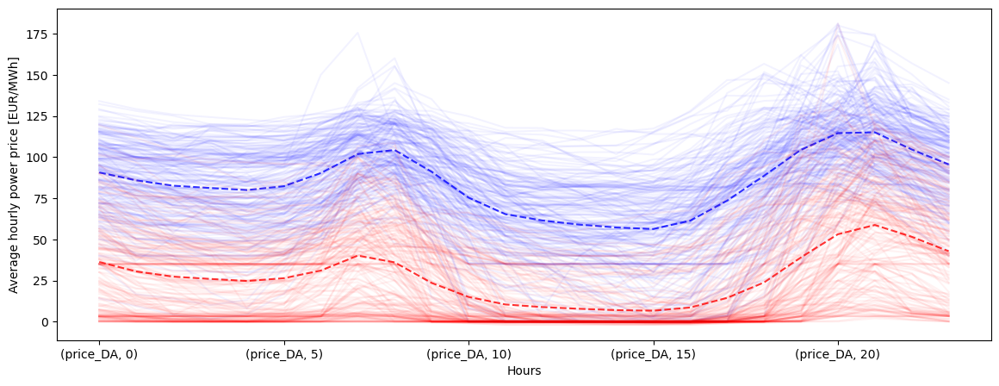

In [110]:
fig, ax = plt.subplots(1, 1, figsize=(14,5))
color_list = ['blue',  'red']
cluster_values = sorted(df_prices_pivot.index.get_level_values('cluster Hierarchical').unique())
print(cluster_values)

for cluster, color in zip(cluster_values, color_list):
    # plot every line of both clusters
    df_prices_pivot.xs(cluster, level=1).T.plot(ax=ax, legend=False, alpha=0.05, color=color)
    # plot the mean consumption of each cluster
    df_prices_pivot.xs(cluster, level=1).mean().plot(ax=ax, color=color, legend=False, alpha=0.8, ls='--')

ax.set_ylabel('Average hourly power price [EUR/MWh]')
ax.set_xlabel('Hours')

## Showing different clusters

The clusters look similar, let's look to values where the cluster obtained is different.

In [112]:
df_prices_pivot

price_DA                       \
hour                                                  0      1      2      3    
           cluster K-means cluster Hierarchical                                 
2023-11-01 1               1                       16.75  12.52   4.99   4.30   
2023-11-02 1               1                        4.30   4.30   0.77   0.06   
2023-11-03 1               1                        3.10   1.50   0.19   0.02   
2023-11-04 1               1                        4.30   2.00   1.20   1.62   
2023-11-05 1               1                        0.09   0.00   0.00   0.00   
...                                                  ...    ...    ...    ...   
2024-10-27 0               0                       87.71  83.31  80.68  81.30   
2024-10-28 0               0                       60.61  50.31  49.00  43.10   
2024-10-29 0               0                       70.00  65.14  56.21  49.28   
2024-10-30 0               0                       66.00  55.00  52.99  44.60   
2024-10-31 0               0                       80.00  76.79  75.00  72.59   

                                                                             \
hour                                                4     5      6       7    
           cluster K-means cluster Hierarchical                               
2023-11-01 1               1                      4.30   4.3   4.30    4.30   
2023-11-02 1               1                      0.09   1.6   4.30    5.00   
2023-11-03 1               1                      0.00   0.1   4.10    4.30   
2023-11-04 1               1                      1.19   1.0   1.50    1.40   
2023-11-05 1               1                      0.00   0.0   0.00    0.00   
...                                                ...   ...    ...     ...   
2024-10-27 0               0                     80.68  70.0  80.00   86.24   
2024-10-28 0               0                     43.92  49.2  65.78   86.74   
2024-10-29 0               0                     49.04  58.4  70.84   83.09   
2024-10-30 0               0                     40.00  52.5  68.68   76.04   
2024-10-31 0               0                     70.99  77.0  88.39  117.05   

                                                                 ...         \
hour                                                 8       9   ...     14   
           cluster K-means cluster Hierarchical                  ...          
2023-11-01 1               1                       4.30    3.10  ...   0.10   
2023-11-02 1               1                      10.00    4.55  ...   4.30   
2023-11-03 1               1                       4.30    4.30  ...   3.00   
2023-11-04 1               1                       1.68    2.00  ...   0.02   
2023-11-05 1               1                       0.00    0.00  ...   0.00   
...                                                 ...     ...  ...    ...   
2024-10-27 0               0                      81.30   64.36  ...  55.19   
2024-10-28 0               0                      98.94   68.39  ...  51.97   
2024-10-29 0               0                      91.36   72.40  ...  70.84   
2024-10-30 0               0                      90.25   85.00  ...  69.57   
2024-10-31 0               0                     121.58  102.80  ...  85.51   

                                                                        \
hour                                                15      16      17   
           cluster K-means cluster Hierarchical                          
2023-11-01 1               1                      0.01    1.62    4.30   
2023-11-02 1               1                      3.80    4.30    4.30   
2023-11-03 1               1                      4.10    4.30   12.56   
2023-11-04 1               1                      0.00    0.02    0.15   
2023-11-05 1               1                      0.00    0.00    2.00   
...                                                ...     ...     ...   
2024-10-27 0               0     

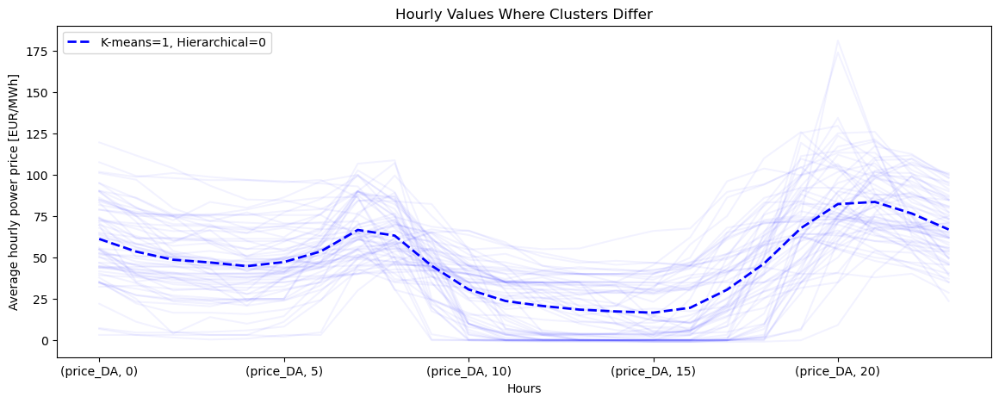

In [131]:
# Identify rows where clusters differ
different_clusters = df_prices_pivot.index[
    df_prices_pivot.index.get_level_values('cluster K-means') !=
    df_prices_pivot.index.get_level_values('cluster Hierarchical')
]

# Filter the dataframe for these rows
df_diff = df_prices_pivot.loc[different_clusters]

# Further filter for each mismatch type
kmeans_1_hierarchical_0 = df_diff.index[
    (df_diff.index.get_level_values('cluster K-means') == 1) &
    (df_diff.index.get_level_values('cluster Hierarchical') == 0)
]

kmeans_0_hierarchical_1 = df_diff.index[
    (df_diff.index.get_level_values('cluster K-means') == 0) &
    (df_diff.index.get_level_values('cluster Hierarchical') == 1)
]

# Initialize the plot
fig, ax = plt.subplots(1, 1, figsize=(14, 5))

# Plot for K-means 1 and Hierarchical 0 (blue)
if not kmeans_1_hierarchical_0.empty:
    df_prices_pivot.loc[kmeans_1_hierarchical_0].T.plot(
        ax=ax, color='blue', alpha=0.05, legend=False
    )
    df_prices_pivot.loc[kmeans_1_hierarchical_0].mean().plot(
        ax=ax, color='blue', ls='--', linewidth=2, label='K-means=1, Hierarchical=0', legend=True
    )

# Plot for K-means 0 and Hierarchical 1 (red)
if not kmeans_0_hierarchical_1.empty:
    df_prices_pivot.loc[kmeans_0_hierarchical_1].T.plot(
        ax=ax, color='red', alpha=0.05, legend=False
    )
    df_prices_pivot.loc[kmeans_0_hierarchical_1].mean().plot(
        ax=ax, color='red', ls='--', linewidth=2, label='K-means=0, Hierarchical=1', legend=True
    )

# Add labels, title, and legend
ax.set_ylabel('Average hourly power price [EUR/MWh]')
ax.set_xlabel('Hours')
ax.set_title('Hourly Values Where Clusters Differ')

plt.show()

In [120]:
kmeans_0_hierarchical_1

MultiIndex([], names=[None, 'cluster K-means', 'cluster Hierarchical'])

In [ ]:
df_diff.xs(cluster_method, level=1)

MultiIndex([(2023-11-01, 1, 1),
            (2023-11-02, 1, 1),
            (2023-11-03, 1, 1),
            (2023-11-04, 1, 1),
            (2023-11-05, 1, 1),
            (2023-11-06, 0, 0),
            (2023-11-07, 0, 0),
            (2023-11-08, 0, 0),
            (2023-11-09, 0, 0),
            (2023-11-10, 1, 0),
            ...
            (2024-10-22, 0, 0),
            (2024-10-23, 0, 0),
            (2024-10-24, 0, 0),
            (2024-10-25, 0, 0),
            (2024-10-26, 1, 0),
            (2024-10-27, 0, 0),
            (2024-10-28, 0, 0),
            (2024-10-29, 0, 0),
            (2024-10-30, 0, 0),
            (2024-10-31, 0, 0)],
           names=[None, 'cluster K-means', 'cluster Hierarchical'], length=365)

# Task 4: Validating results with Dimensionality Reduction (PCA)


## For the regression method
First with two components

In [147]:
from sklearn.decomposition import PCA
import matplotlib.colors

#initializing the PCA transformer and 
# gradient boosting regressor estimation
pca = PCA(n_components=2)
gbr = GradientBoostingRegressor(n_estimators=500, max_depth=None, learning_rate=0.1, loss='absolute_error')

#dimensionality reduction
X_train_pca = pca.fit_transform(X_train_scaled2)
X_test_pca = pca.fit_transform(X_test_scaled2)

final_model_v3 = GradientBoostingRegressor(n_estimators=500, max_depth=None, learning_rate=0.1, loss='absolute_error') # Training with best hyperparameters
final_model_v3.fit(X_train_pca,y_train2)  # Training the model
y_predict_v3 = final_model_v3.predict(X_test_pca)  # Making a prediction on the test data

In [152]:
y_predict_v3
y_predict_v2

array([ 83.75895237, 115.79274823, 145.61541822, ..., 119.32319408,
       105.59328255, 103.58178435])

In [153]:
from sklearn.metrics import r2_score, mean_squared_error

# Calculate R² (R-squared) score
r2_2 = r2_score(y_test2, y_predict_v3)

# Calculate RMSE (Root Mean Squared Error)
rmse_2 = mean_squared_error(y_test2, y_predict_v3, squared=False)

# Print both the R² and RMSE scores
print(f"R² Score: {r2_2:.4f}")
print(f"RMSE: {rmse_2:.4f}")

R² Score: -1.1243
RMSE: 58.9471


In [155]:
import plotly.graph_objects as go

# Create the figure
fig = go.Figure()

# Add the trace for the actual consumption (True Values)
fig.add_trace(go.Scatter(x=y_test2.index, y=y_test2, mode='lines', name='True Values',
                         line=dict(color='blue', width=2)))

# Add the trace for the predicted consumption (Predicted Values)
fig.add_trace(go.Scatter(x=y_test2.index, y=y_predict_v3, mode='lines', name='Predicted Values V3',
                         line=dict(color='red', width=2, dash='dot')))  # 'dot' for less separated dashes


# Update layout for a more beautiful plot
fig.update_layout(
    title='True vs Predicted Day-Ahead Price',
    xaxis_title='Date/Time',
    yaxis_title='Day-Ahead Price (EUR/MWh)',
    template='plotly',  # dark theme, can change to 'plotly' for light theme
    hovermode='x unified',  # hover over to show values for both lines at a time
    legend=dict(
        x=0.01, y=0.99,  # position of legend
        traceorder='normal',
        font=dict(family="Arial", size=12, color="white"),
        bgcolor='rgba(0, 0, 0, 0.3)',
        bordercolor='white',
        borderwidth=1
    ),
   
   
)

The model performance is very bad as we reduce too much the dataset, let's try with 4 components. 

In [156]:
from sklearn.decomposition import PCA
import matplotlib.colors

#initializing the PCA transformer and 
# gradient boosting regressor estimation
pca = PCA(n_components=4)
gbr = GradientBoostingRegressor(n_estimators=500, max_depth=None, learning_rate=0.1, loss='absolute_error')

#dimensionality reduction
X_train_pca_2 = pca.fit_transform(X_train_scaled2)
X_test_pca_2 = pca.fit_transform(X_test_scaled2)

final_model_v4 = GradientBoostingRegressor(n_estimators=500, max_depth=None, learning_rate=0.1, loss='absolute_error') # Training with best hyperparameters
final_model_v4.fit(X_train_pca_2,y_train2)  # Training the model
y_predict_v4 = final_model_v4.predict(X_test_pca_2)  # Making a prediction on the test data

KeyboardInterrupt: 

## For the clustering method

Principal Component Analysis (PCA) is a statistical method that simplifies the complexity of sample spaces with many dimensions while preserving their information. The number of features is reduced from 24 to 2. 
One way to validate the results of the clustering algorithm is by dimensionality reduction techniques. Note that the PCA does not know anything about the groups found by K-means.

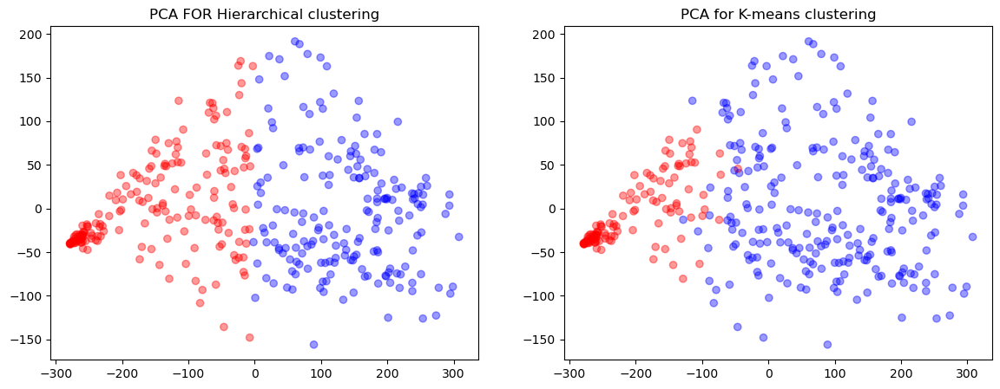

In [138]:
from sklearn.decomposition import PCA
import matplotlib.colors

pca = PCA(n_components=2)
results_pca = pca.fit_transform(X)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list(cluster_values, color_list)

# Initialize the plot
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

ax[0].scatter(results_pca[:, 0], results_pca[:, 1],
            c=df_prices_pivot.index.get_level_values('cluster K-means'),
            cmap=cmap,
            alpha=0.4,
            )
ax[1].scatter(results_pca[:, 0], results_pca[:, 1],
            c=df_prices_pivot.index.get_level_values('cluster Hierarchical'),
            cmap=cmap,
            alpha=0.4,
            )

ax[1].title.set_text('PCA for K-means clustering')
ax[0].title.set_text('PCA FOR Hierarchical clustering')

plt.show()